In [1]:
%matplotlib ipympl

In [2]:
import torch
import numpy as np
import Dataset2 as Dataset
import importlib
import matplotlib.pyplot as plt
import networkx as nx
from time import sleep, time

importlib.reload(Dataset)
DatasetContainer = Dataset.DatasetContainer
ProcessingDatasetContainer = Dataset.ProcessingDatasetContainer

def PLTParams(figsize = [15,15]):
    plt.rcParams['figure.figsize']=figsize
    plt.rcParams['font.size']=15
PLTParams()

import sys

sys.path.append('/remote/tychodata/ftairli/work/Projects/ProfileReconstruction/Code/')


In [3]:
def IndexToXY(indices,return_tensor=False):
    indices -=1
    Xs = indices//22
    Ys = indices%22
    if return_tensor: return Xs.int(),Ys.int()
    else:             return Xs.int().tolist(),Ys.int().tolist()



In [4]:
DataPath = '/remote/tychodata/ftairli/data/Simulations__libraries__MCTask__Offline_v3r99p2a__IdealMC_CORSIKA__Hybrid_CORSIKA76400/SIB23c/DatasetFiles/RawData'

In [5]:
# Importing Dataset
Dataset = DatasetContainer()
Dataset.Load(DataPath,'Test' ,LoadTraces=True)

Run010 = DatasetContainer()
Run010.Load(DataPath,'Run010' ,LoadTraces=True)
print(Run010.Event_level_keys)
print(Run010.Pixel_level_keys)
# # print(len(Run010))

Loading Test
Loading Run010
{'EventID_1/2': 0, 'EventID_2/2': 1, 'Primary': 2, 'Station_TotalSignal': 3, 'Station_Time': 4, 'Station_Theta': 5, 'Station_Phi': 6, 'Station_Distance': 7, 'Station_Chi_i': 8, 'Gen_LogE': 9, 'Gen_CosZenith': 10, 'Gen_Xmax': 11, 'Gen_dEdXmax': 12, 'Rec_LogE': 13, 'Rec_CosZenith': 14, 'Rec_Xmax': 15, 'Rec_dEdXmax': 16, 'Rec_UspL': 17, 'Rec_UspR': 18, 'Gen_SDPPhi': 19, 'Gen_SDPTheta': 20, 'Gen_Chi0': 21, 'Gen_Rp': 22, 'Gen_T0': 23, 'Gen_CoreEyeDist': 24, 'Rec_SDPPhi': 25, 'Rec_SDPTheta': 26, 'Rec_Chi0': 27, 'Rec_Rp': 28, 'Rec_T0': 29, 'Rec_CoreEyeDist': 30}
{'PixelID': 0, 'TelID': 1, 'EyeID': 2, 'Status': 3, 'Charge': 4, 'Chi_i': 5, 'Theta': 6, 'Phi': 7, 'TimeOffset': 8, 'PulseStart': 9, 'PulseCentroid': 10, 'PulseStop': 11}


(tensor([1., 2., 3., 4., 5., 6.]), tensor([416463, 840956, 931557, 927695, 833327, 387588]))
(tensor([1., 2., 3., 4.]), tensor([ 952458, 1232826, 1102668, 1049634]))


<BarContainer object of 4 artists>

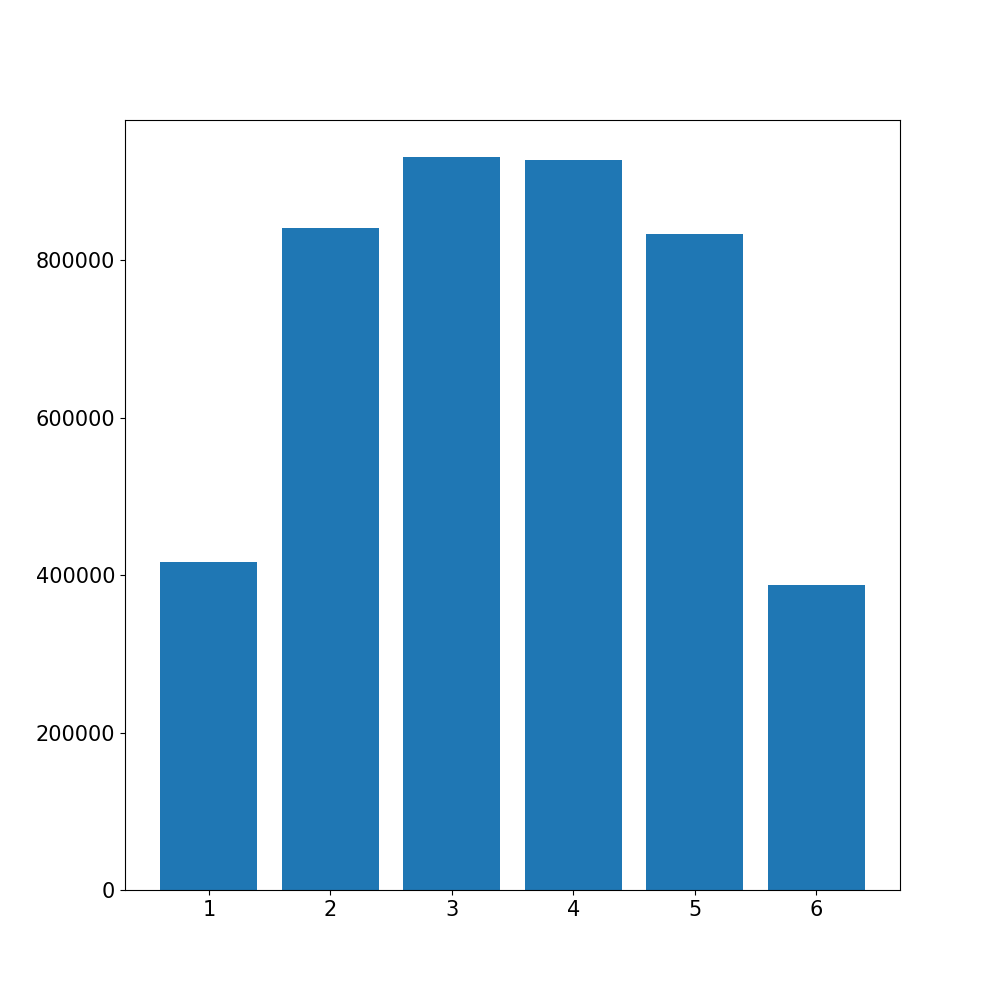

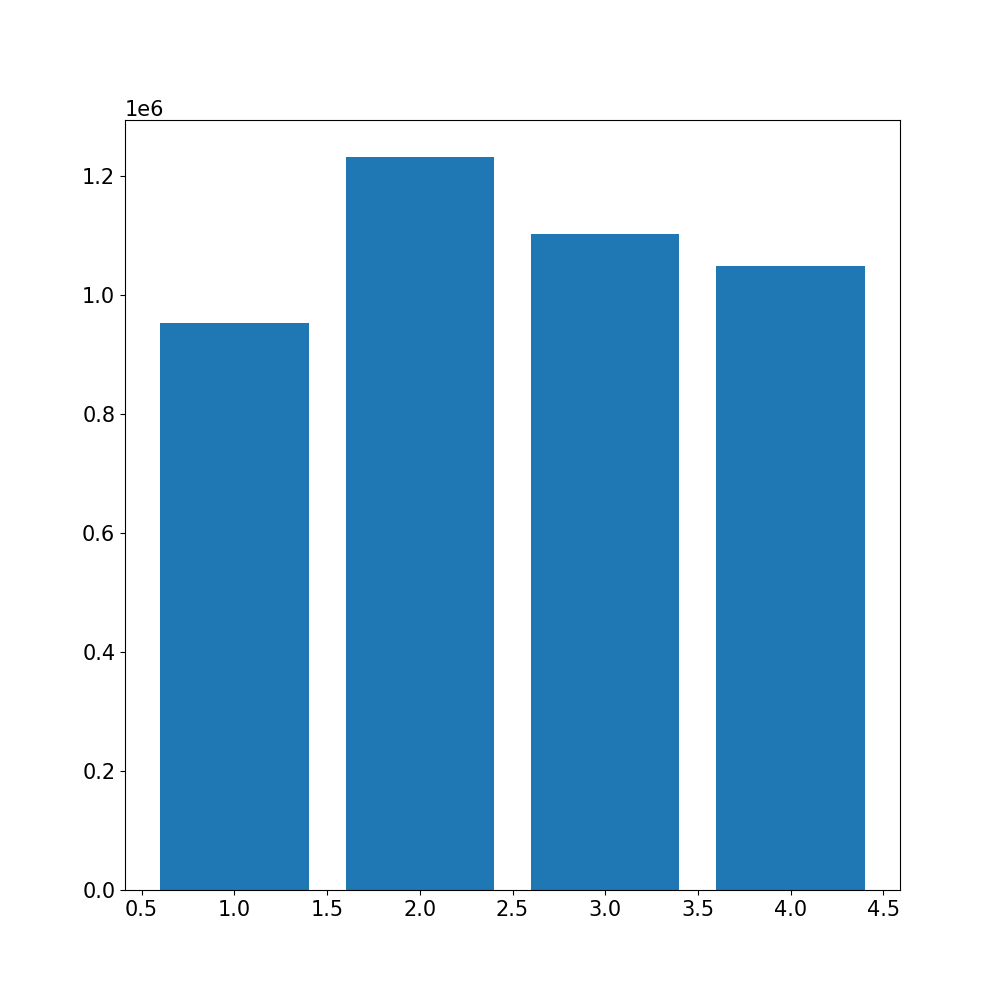

In [6]:
AllTelIDs = Run010.get_pixel_values('TelID')
plt.figure(figsize=[10,10])
unique_ids = torch.unique(AllTelIDs,return_counts=True)
print(unique_ids)
plt.bar(unique_ids[0],unique_ids[1])

AllEyeIDs = Run010.get_pixel_values('EyeID')
plt.figure(figsize=[10,10])
unique_ids = torch.unique(AllEyeIDs,return_counts=True)
print(unique_ids)
plt.bar(unique_ids[0],unique_ids[1])

# Making Graphs max-Pixels

In [7]:
EventLengths = [torch.sum(ev.get_pixel_values('Status')==4) for ev in Run010]

print('Max Event Length:',max(EventLengths))
print('Min Event Length:',min(EventLengths))


Max Event Length: tensor(140)
Min Event Length: tensor(4)


In [8]:
# # How many pixels in an event ?
# plt.figure()
# plt.hist(EventLengths,bins=100,cumulative=True,density=True)
# plt.xlabel('Event Length')
# plt.ylabel('Count')
# # plt.yscale('log')
# plt.axvline(50,color = 'r')
# plt.axvline(40,color = 'r')
# plt.grid()
# plt.show()

# print(f'99th percentile = {np.percentile(EventLengths,99)}')
# print(f'95th percentile = {np.percentile(EventLengths,95)}')
# print(f'90th percentile = {np.percentile(EventLengths,90)}')
# print(f'85th percentile = {np.percentile(EventLengths,85)}')
# print(f'80th percentile = {np.percentile(EventLengths,80)}')

# print(f'{torch.sum(torch.tensor(EventLengths)<=40.)/len(EventLengths)} 40')


In [9]:
def Theta_Phi_Cross(Theta_1,Phi_1,Theta_2,Phi_2):
    X1 = torch.sin(Theta_1)*torch.cos(Phi_1)
    Y1 = torch.sin(Theta_1)*torch.sin(Phi_1)
    Z1 = torch.cos(Theta_1)

    X2 = torch.sin(Theta_2)*torch.cos(Phi_2)
    Y2 = torch.sin(Theta_2)*torch.sin(Phi_2)
    Z2 = torch.cos(Theta_2)
    
    one = torch.stack([X1,Y1,Z1],dim=1)
    two = torch.stack([X2,Y2,Z2],dim=1)


    return torch.linalg.cross(one,two)




def cut_pixels(Pixel_Theta,Pixel_Phi,SDP_Theta,SDP_Phi,zeta=None,pixel_count=None):
    assert zeta is None, 'Zeta broken because the angle is supposed to be 90 and i havent implemented the thing to work with 90'
    if zeta is not None: assert pixel_count is None, 'must provide either zeta or pixel_count'
    if zeta is None and pixel_count is None: pixel_count = 40
    ''' returns the pixels cut by too far away from the SDP
    pretty much is a hack, cause i am not supposed to know the SDP at this point, but its whatever'''

    if zeta is None and len(Pixel_Theta)<pixel_count: return torch.ones(len(Pixel_Theta)).bool()
    
    SDP_Vector = torch.tensor([torch.sin(SDP_Theta)*torch.cos(SDP_Phi),
                                torch.sin(SDP_Theta)*torch.sin(SDP_Phi),
                                torch.cos(SDP_Theta)])
    Pixel_Vector = torch.stack([torch.sin(Pixel_Theta)*torch.cos(Pixel_Phi),
                                    torch.sin(Pixel_Theta)*torch.sin(Pixel_Phi),
                                    torch.cos(Pixel_Theta)],dim=1)
    Dot_product = torch.sum(SDP_Vector*Pixel_Vector,dim=1)
    Angle = torch.acos(Dot_product)
    if zeta is not None: return Angle<zeta
    else:
        # Find the indices of the 40 smallest angles
        _, indices = torch.topk(torch.abs(Dot_product), pixel_count, largest=False)
        mask = torch.zeros(len(Pixel_Theta), dtype=bool)
        mask[indices] = True
        
        return mask




In [25]:
def Graph_All_Connected(Dataset,ProcessingDataset = None):
    '''Produces graphs where all pixels are connected to each other'''
    PhiOffsets = {1:-75/180*torch.pi,2:-45/180*torch.pi,3:-15/180*torch.pi,4:15/180*torch.pi,5:45/180*torch.pi,6:75/180*torch.pi}
    leniency = 1.2
    max_ang_diff = 1.8*torch.sqrt(torch.tensor(3))
    # print(f'max ang diff = {max_ang_diff}')
    IDsList = ()
    Graph   = []
    AuxData = []
    for i, Event in enumerate(Dataset):
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)

        Pix_Phi        = Event.get_pixel_values('Phi')
        Pix_Theta      = Event.get_pixel_values('Theta')
        Pix_Centroid   = Event.get_pixel_values('PulseCentroid')
        Pix_PulseStart = Event.get_pixel_values('PulseStart')
        Pix_PulseStop  = Event.get_pixel_values('PulseStop')
        Pix_Charge     = Event.get_pixel_values('Charge')
        TelID          = Event.get_pixel_values('TelID')
        PixelIDs       = Event.get_pixel_values('PixelID')
        Pixel_Status   = Event.get_pixel_values('Status')
        HEAT = (TelID == 7)+(TelID == 8)+(TelID == 9)+(Event.get_pixel_values('EyeID') == 5)

        # Going to cheat here and throw away the noise pixels before i do the graph
        # cut = (Pixel_Status == 4)
        # Pix_Phi        = Pix_Phi       [cut]
        # Pix_Theta      = Pix_Theta     [cut]
        # Pix_Centroid   = Pix_Centroid  [cut]
        # Pix_PulseStart = Pix_PulseStart[cut]
        # Pix_PulseStop  = Pix_PulseStop [cut]
        # Pix_Charge     = Pix_Charge    [cut]
        # TelID          = TelID         [cut]
        # PixelIDs       = PixelIDs      [cut]
        # HEAT           = HEAT          [cut]

        SDP_Theta = Event.get_value('Gen_SDPTheta')
        SDP_Phi   = Event.get_value('Gen_SDPPhi')
        # There is no HEAT in new Dataset, but keeping for backwards compatibility

        cut = cut_pixels(Pix_Theta/180*torch.pi,Pix_Phi/180*torch.pi,SDP_Theta,SDP_Phi,pixel_count=40)

        Pix_Phi        = Pix_Phi       [cut]
        Pix_Theta      = Pix_Theta     [cut]
        Pix_Centroid   = Pix_Centroid  [cut]
        Pix_PulseStart = Pix_PulseStart[cut]
        Pix_PulseStop  = Pix_PulseStop [cut]
        Pix_Charge     = Pix_Charge    [cut]
        TelID          = TelID         [cut]
        PixelIDs       = PixelIDs      [cut]
        Pixel_Status   = Pixel_Status  [cut]
        HEAT           = HEAT          [cut]

        if not HEAT.all(): 
            Pix_PulseStart[HEAT]= 0.5 * Pix_PulseStart[HEAT]
            Pix_PulseStop [HEAT]= 0.5 * Pix_PulseStop [HEAT]

            
            Pix_PulseWidth = (Pix_PulseStop - Pix_PulseStart)/2
            
            Pix_Time_Diff = torch.abs(Pix_Centroid  [None,:] - Pix_Centroid  [:,None])
            Pix_Time_Gap  = torch.abs(Pix_PulseWidth[None,:] + Pix_PulseWidth[:,None])
            Pix_Ang_Diff  = torch.sqrt((Pix_Phi[None,:]-Pix_Phi[:,None])**2 + (Pix_Theta[None,:]-Pix_Theta[:,None])**2)
            
            Edges = (Pix_Time_Diff < leniency*Pix_Time_Gap) & (Pix_Ang_Diff<max_ang_diff) # 
            Edges = torch.stack(torch.where(Edges),dim=1)
            Edges = Edges[Edges[:,0]!=Edges[:,1]]
            # print(Edges.shape)
            
            # Normalise Node Values
            Pix_Theta    = (90-Pix_Theta)/30
            Central_Phi  = torch.mean(Pix_Phi)
            Pix_Phi      = (Pix_Phi-Central_Phi)/40

            Pix_Centroid = Pix_Centroid/1000
            Pix_Charge   = torch.log10(Pix_Charge+1)/2.5-1
            Pix_PulseWidth = Pix_PulseWidth/50

            Node_values   = torch.stack([Pix_Theta,Pix_Phi,Pix_Centroid,Pix_Charge,Pix_PulseWidth],dim=1)

            # Edge_ang_div  = torch.sqrt((Pix_Phi[Edges[0,:]]-Pix_Phi[Edges[1,:]])**2 + (Pix_Theta[Edges[0,:]]-Pix_Theta[Edges[1,:]])**2)
            # Edge_time_div = torch.abs(Pix_Centroid[Edges[0]]-Pix_Centroid[Edges[1]])
            Edge_ang_div  = Pix_Ang_Diff[Edges[:,0],Edges[:,1]]
            Edge_time_div = Pix_Time_Diff[Edges[:,0],Edges[:,1]]

            # Normalise Edge Values
            Edge_ang_div  = Edge_ang_div/1.5
            Edge_time_div = Edge_time_div/100
            Edge_values   = torch.stack([Edge_ang_div,Edge_time_div],dim=1)
            

            Graph.append([Node_values,Edges,Edge_values])
            AuxData.append(Central_Phi)
        else:
            Node_values = torch.tensor([[0,0,0,0]])
            Edges = torch.tensor([[0,0]])
            Edge_values = torch.tensor([[0,0]])
            Graph.append([Node_values,Edges,Edge_values])
            AuxData.append(0)

    # Slap into Dataset
    if ProcessingDataset is None:
        return Graph,IDsList,AuxData
    else:
        ProcessingDataset._Graph    = Graph
        ProcessingDataset.GraphData = True
        ProcessingDataset._Aux      = AuxData
        if ProcessingDataset._EventIds is None:
            ProcessingDataset._EventIds = IDsList
        else:
            assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'

        

Graphs,IDsList,AuxData = Graph_All_Connected(Run010,None)




In [26]:
All_Theta    = []
All_Phi      = []
All_Centroid = []
All_Charge   = []
All_Width    = []
All_Status   = []

for graph in Graphs:
    All_Theta   .append(graph[0][:,0])
    All_Phi     .append(graph[0][:,1])
    All_Centroid.append(graph[0][:,2])
    All_Charge  .append(graph[0][:,3])


In [ ]:
All_Width   .append(graph[0][:,4])
# All_Status  .append(graph[0][:,5])

All_Theta    = torch.cat(All_Theta   ).numpy()
All_Phi      = torch.cat(All_Phi     ).numpy()
All_Centroid = torch.cat(All_Centroid).numpy()
All_Charge   = torch.cat(All_Charge  ).numpy()
All_Width    = torch.cat(All_Width   ).numpy()
# All_Status   = torch.cat(All_Status  ).numpy()

# All_Theta    = All_Theta   [All_Status==4]
# All_Phi      = All_Phi     [All_Status==4]
# All_Centroid = All_Centroid[All_Status==4]
# All_Charge   = All_Charge  [All_Status==4]
# All_Width    = All_Width   [All_Status==4]
# All_Status   = All_Status  [All_Status==4]

In [ ]:
# Theta Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_Theta,bins=100)
ax[0].set_title('Theta')

normTheta = (90-All_Theta)/30
ax[1].hist(normTheta,bins=100)
ax[1].set_title('Normalized Theta')


Text(0.5, 1.0, 'Normalized Phi')

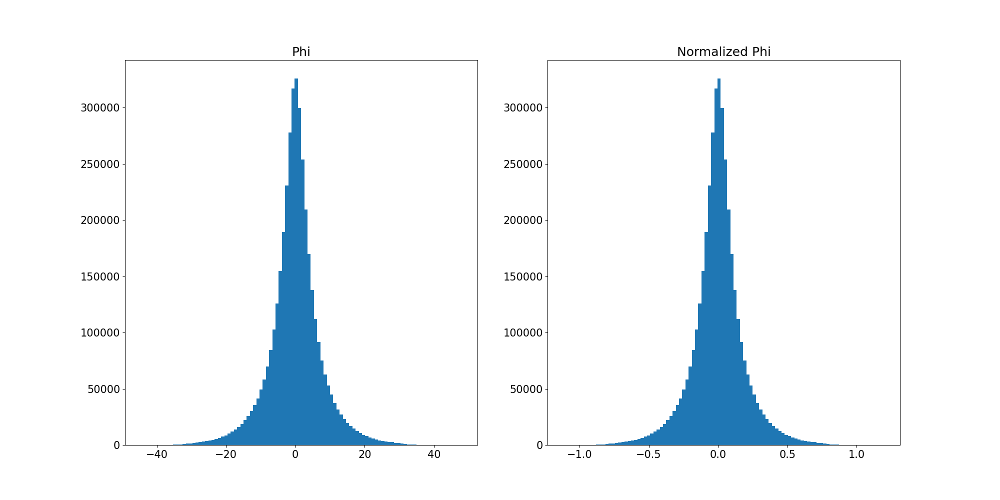

In [30]:
# Phi Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_Phi,bins=100)
ax[0].set_title('Phi')
# ax[0].set_yscale('log')

normPhi = All_Phi/40
ax[1].hist(normPhi,bins=100)
ax[1].set_title('Normalized Phi')


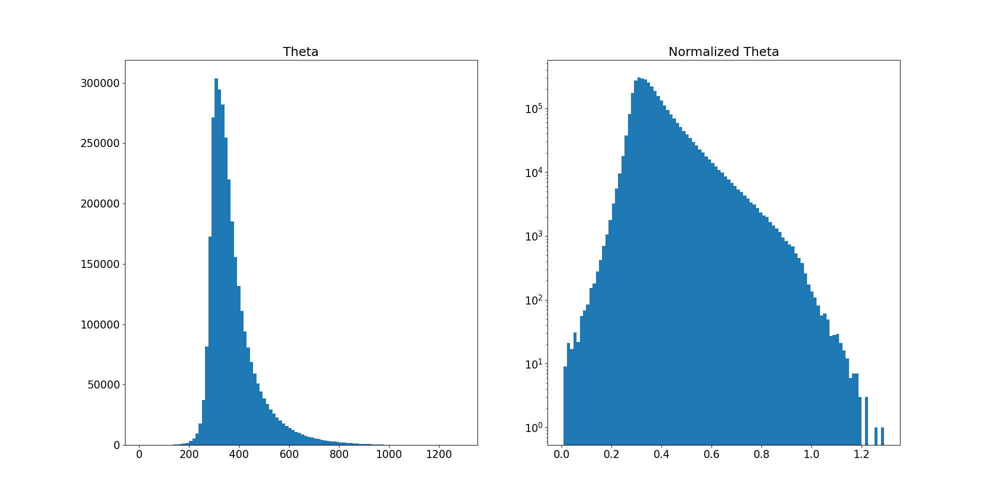

In [13]:
# Centroid Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_Centroid,bins=100)
ax[0].set_title('Theta')

normCentroid = All_Centroid/1000
ax[1].hist(normCentroid,bins=100)
ax[1].set_title('Normalized Theta')
ax[1].set_yscale('log')

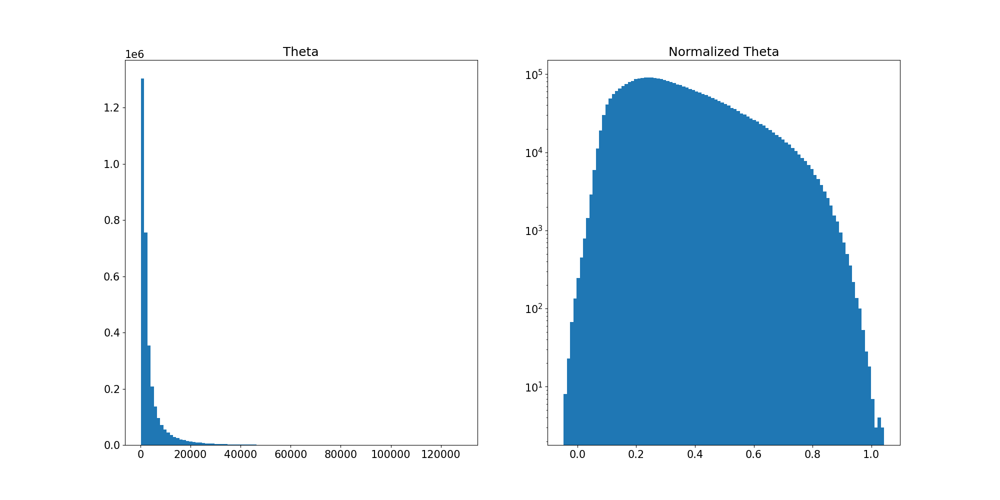

In [48]:
# Charge Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_Charge,bins=100)
ax[0].set_title('Theta')

normCharge = np.log10(All_Charge+1)/2.5 - 1
ax[1].hist(normCharge,bins=100)
ax[1].set_title('Normalized Theta')
ax[1].set_yscale('log')

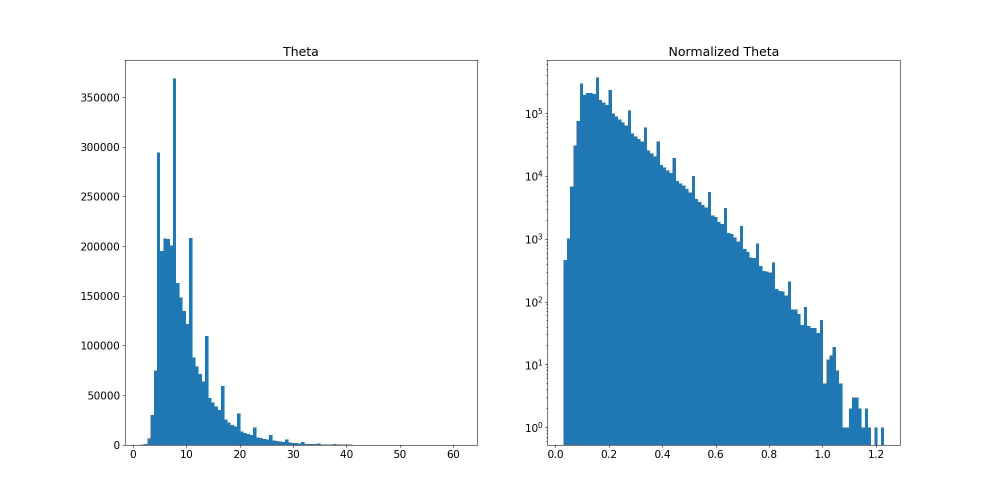

In [14]:
# Duration Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_Width,bins=100)
ax[0].set_title('Theta')

normWidth = All_Width/50
ax[1].hist(normWidth,bins=100)
ax[1].set_title('Normalized Theta')
plt.yscale('log')

In [42]:
All_AngDivs = []
All_TimeDivs = []

for graph in Graphs:
    All_AngDivs.append(graph[2][:,0])
    All_TimeDivs.append(graph[2][:,1])

All_AngDivs = torch.cat(All_AngDivs).numpy()
All_TimeDivs = torch.cat(All_TimeDivs).numpy()


/tmp/ipykernel_32198/2687694369.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2,figsize = [20,10])


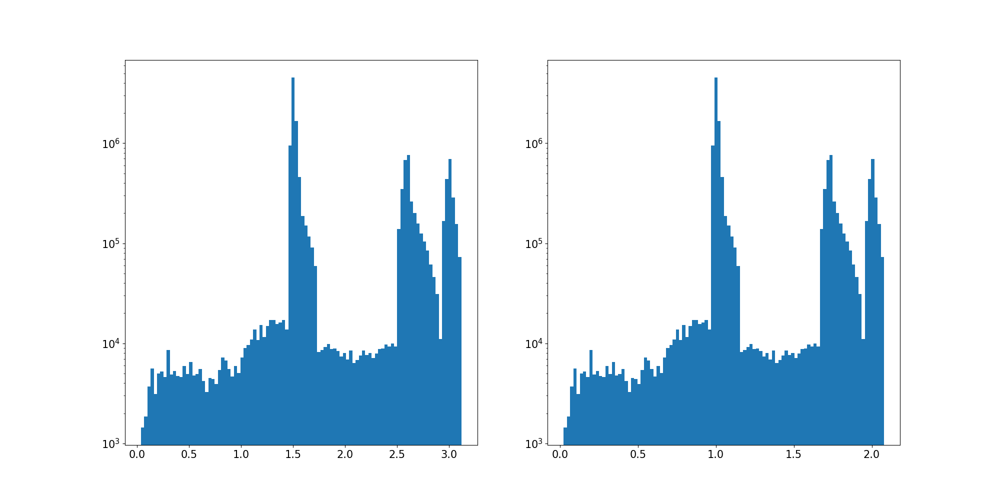

In [43]:
# Edge AngDiv Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_AngDivs,bins=100)
ax[0].set_yscale('log')

normAngDivs = All_AngDivs/1.5
ax[1].hist(normAngDivs,bins=100)
plt.yscale('log')

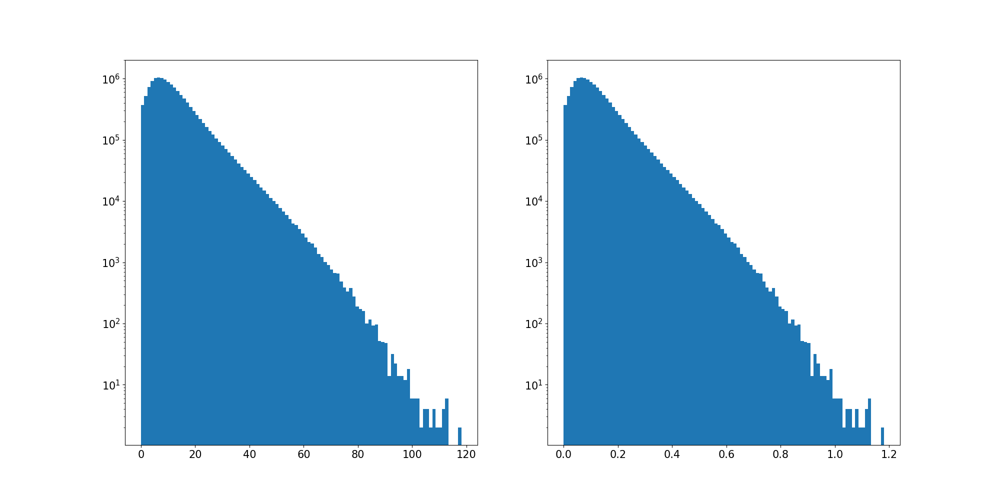

In [44]:
# Edge Time Div Normalisation
fig, ax = plt.subplots(1,2,figsize = [20,10])
ax[0].hist(All_TimeDivs,bins=100)
ax[0].set_yscale('log')

normTimeDivs = All_TimeDivs/100
ax[1].hist(normTimeDivs,bins=100)
plt.yscale('log')

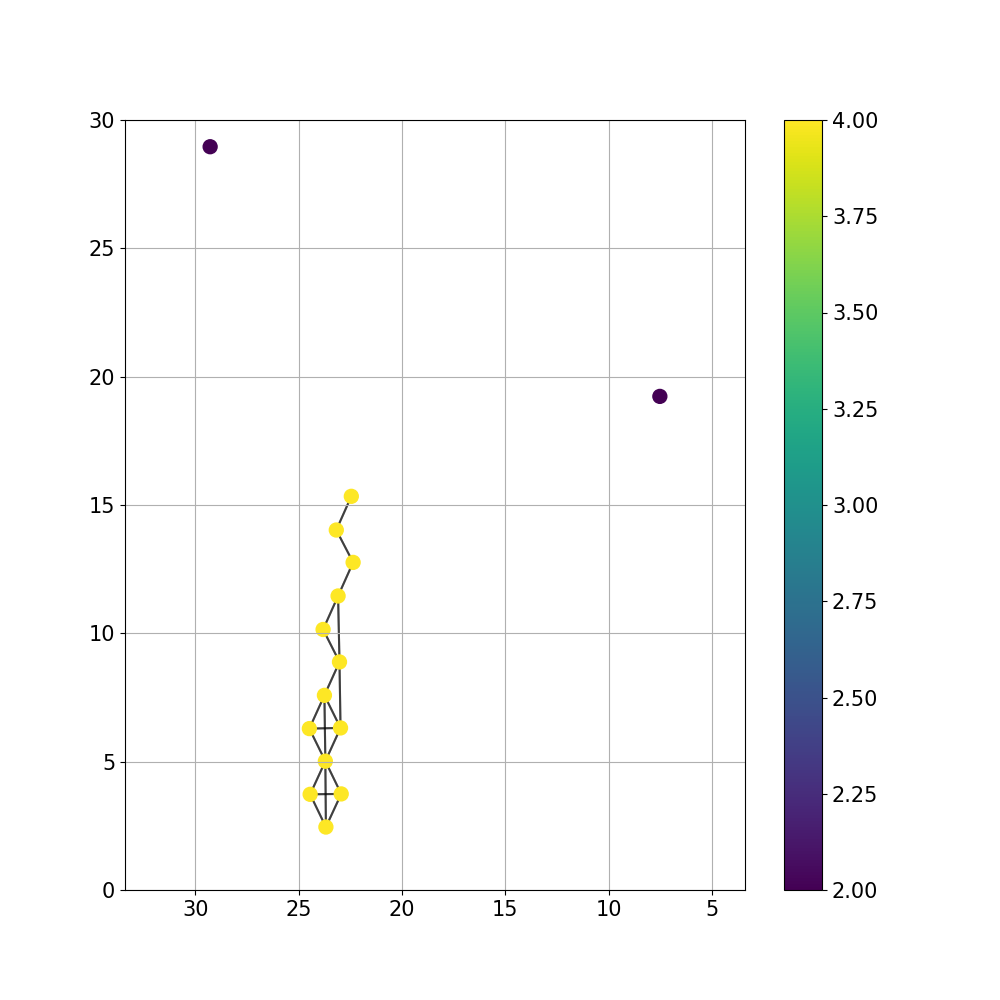

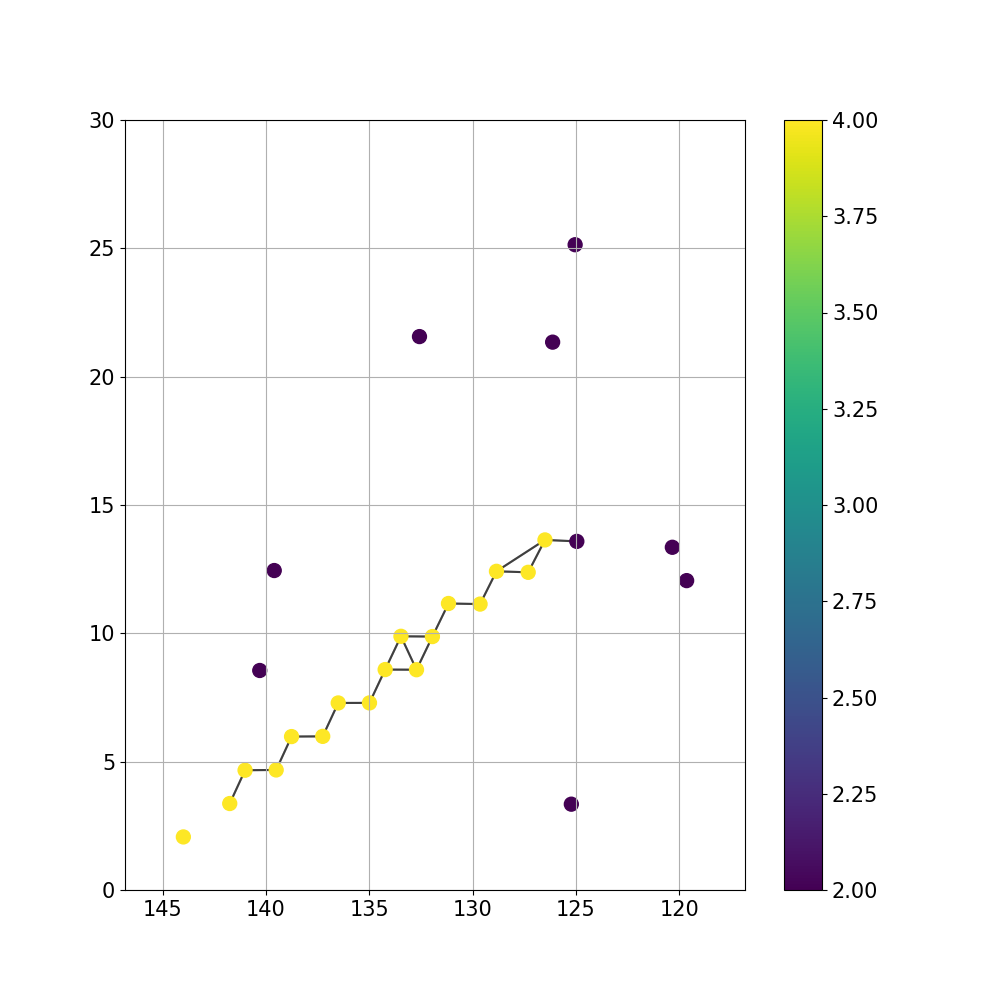

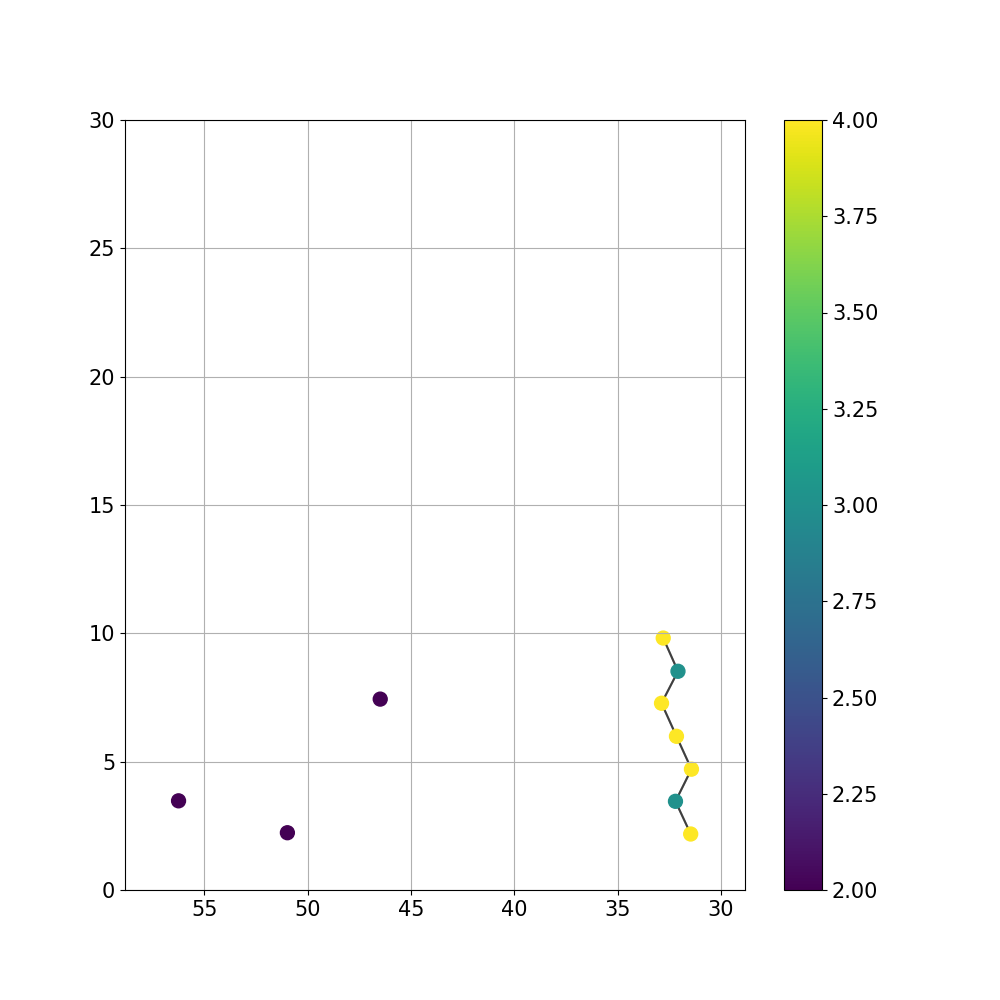

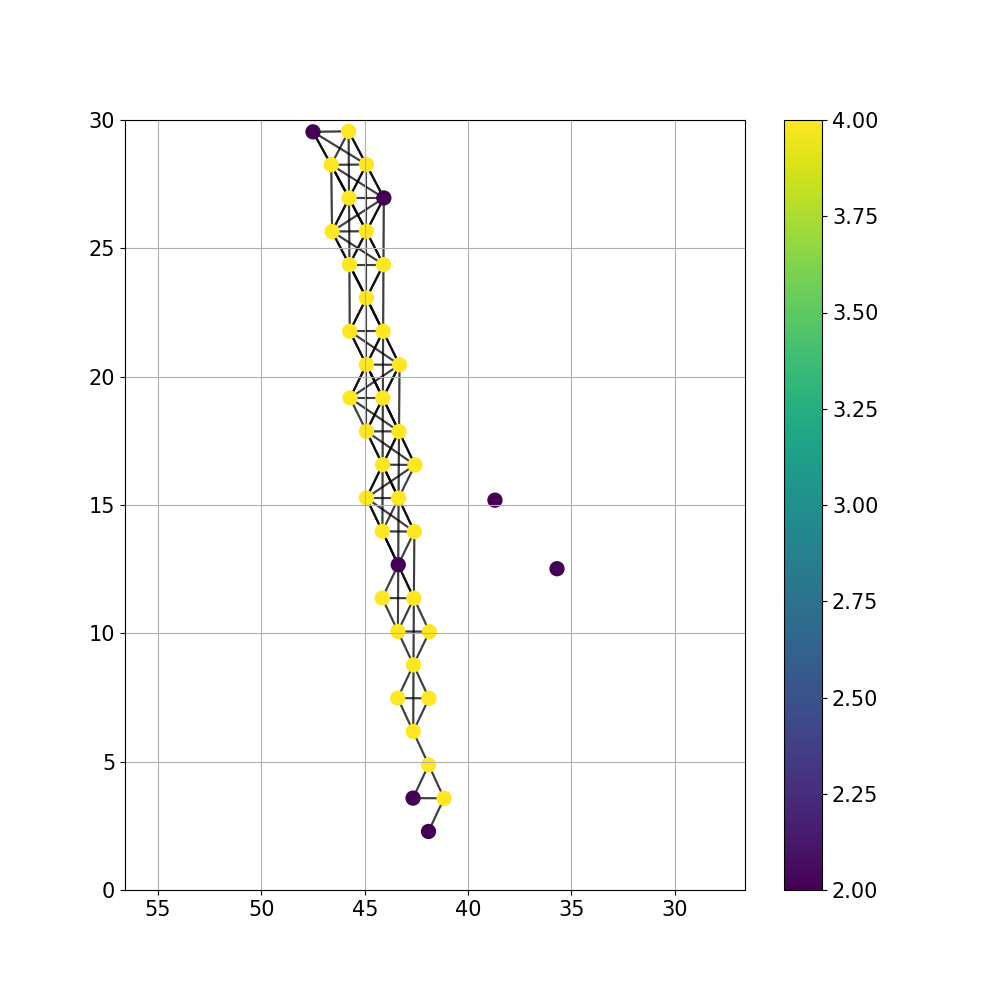

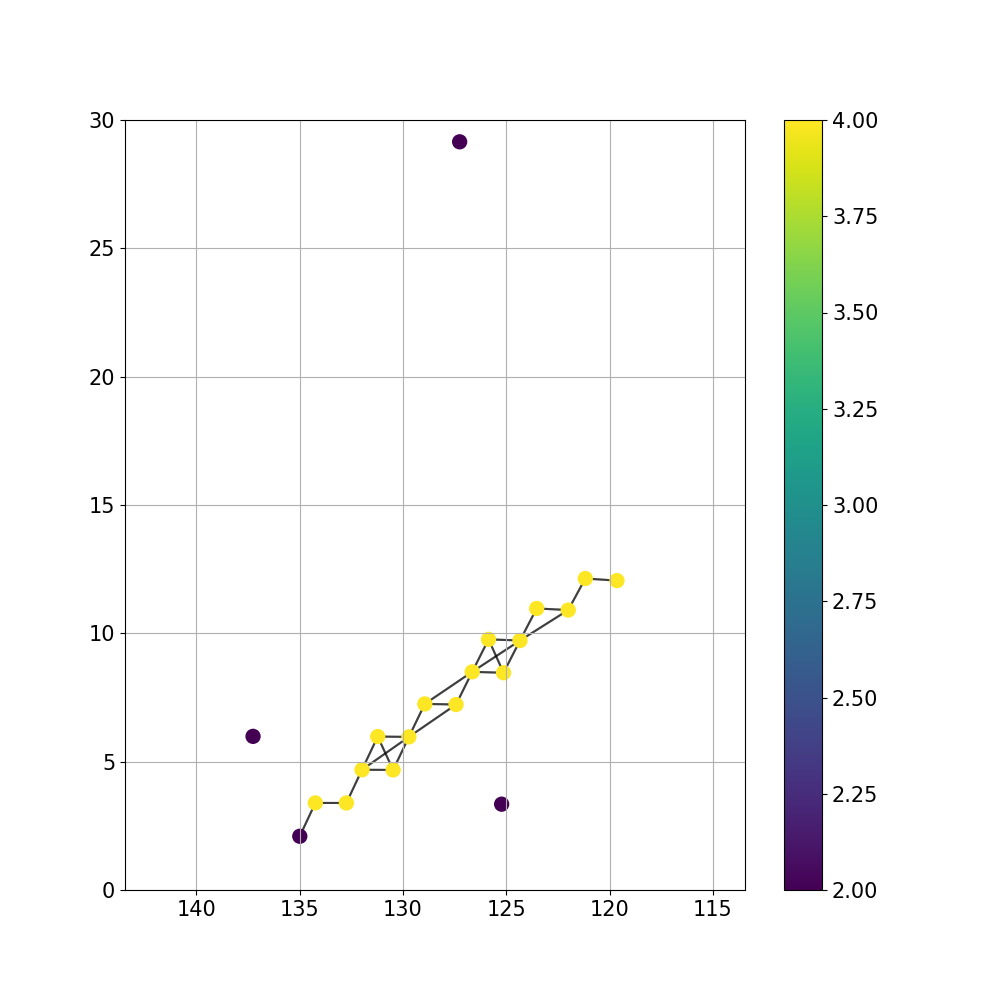

...

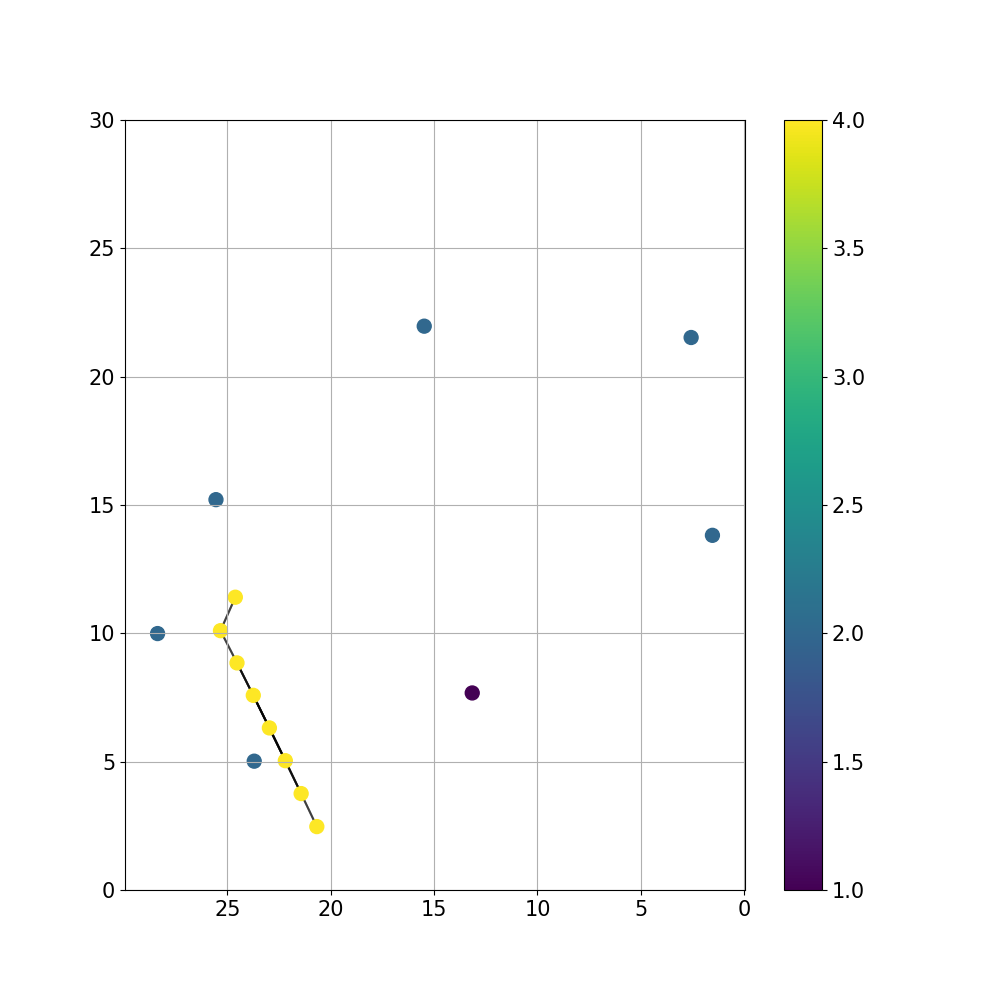

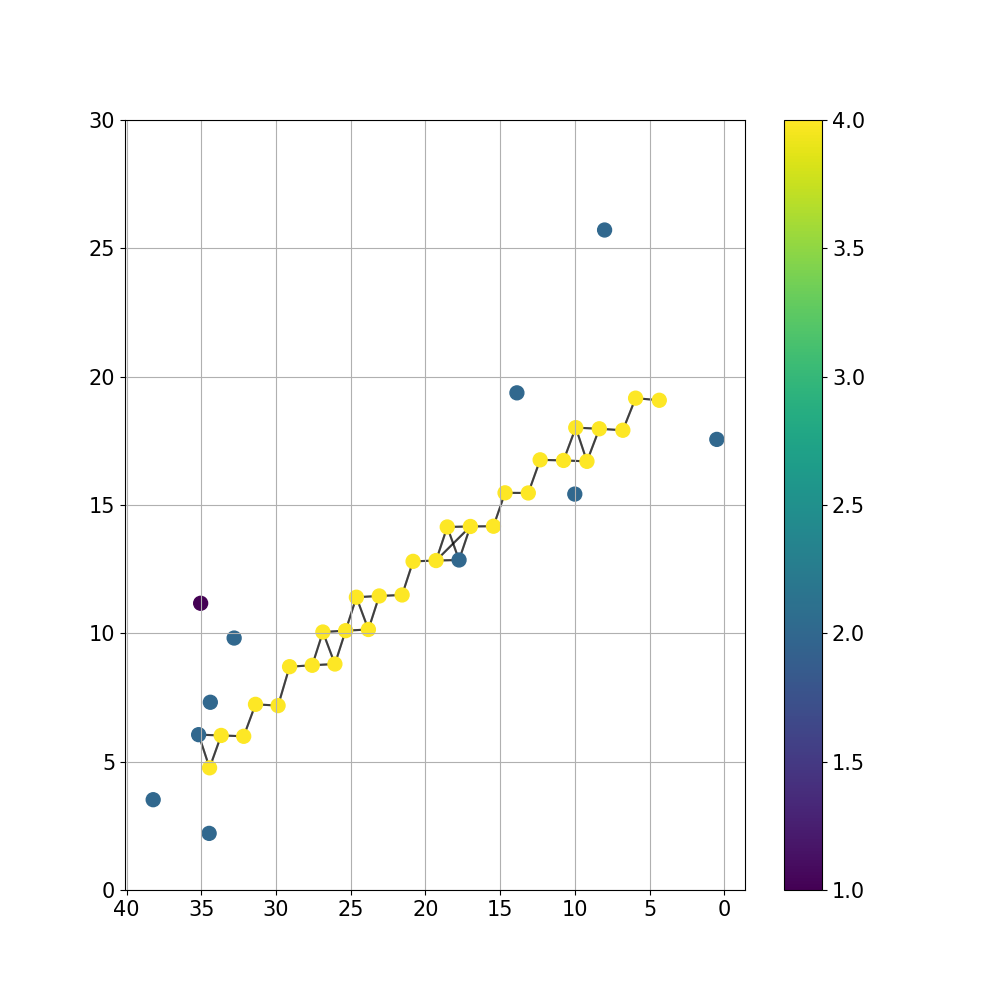

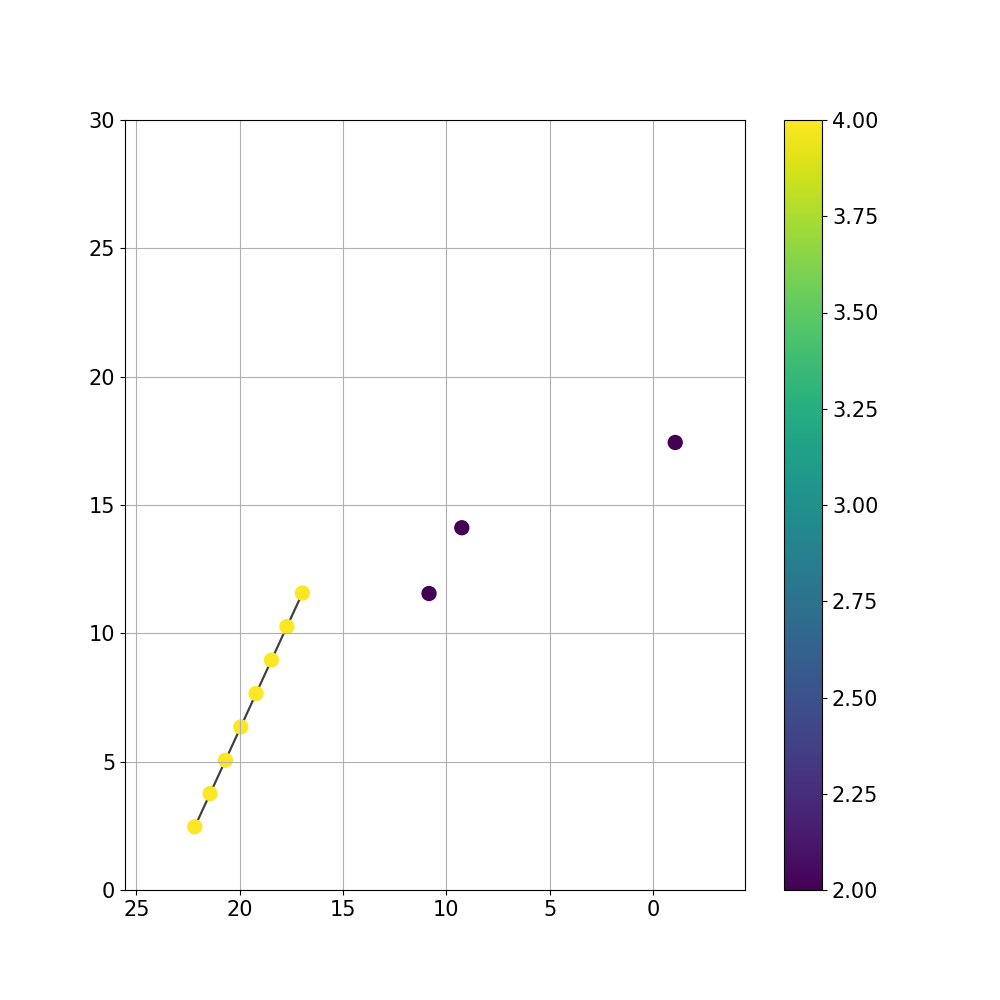

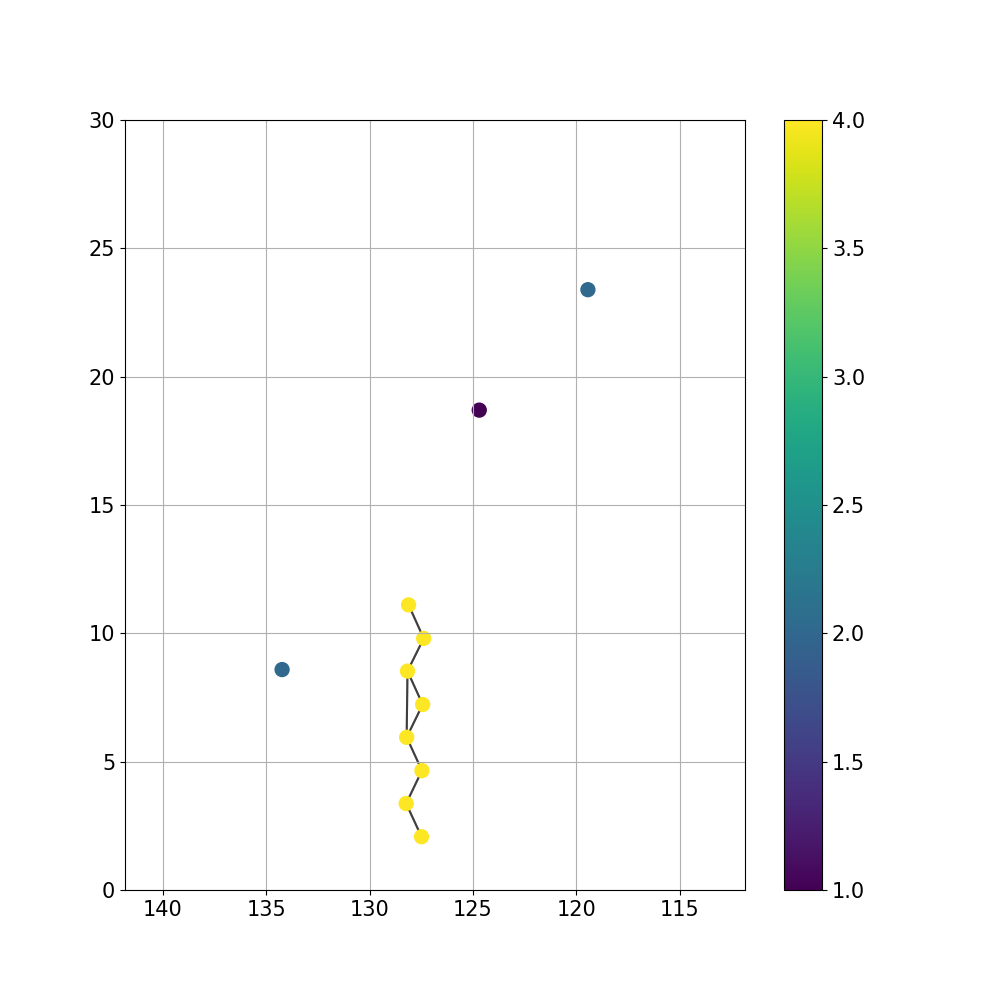

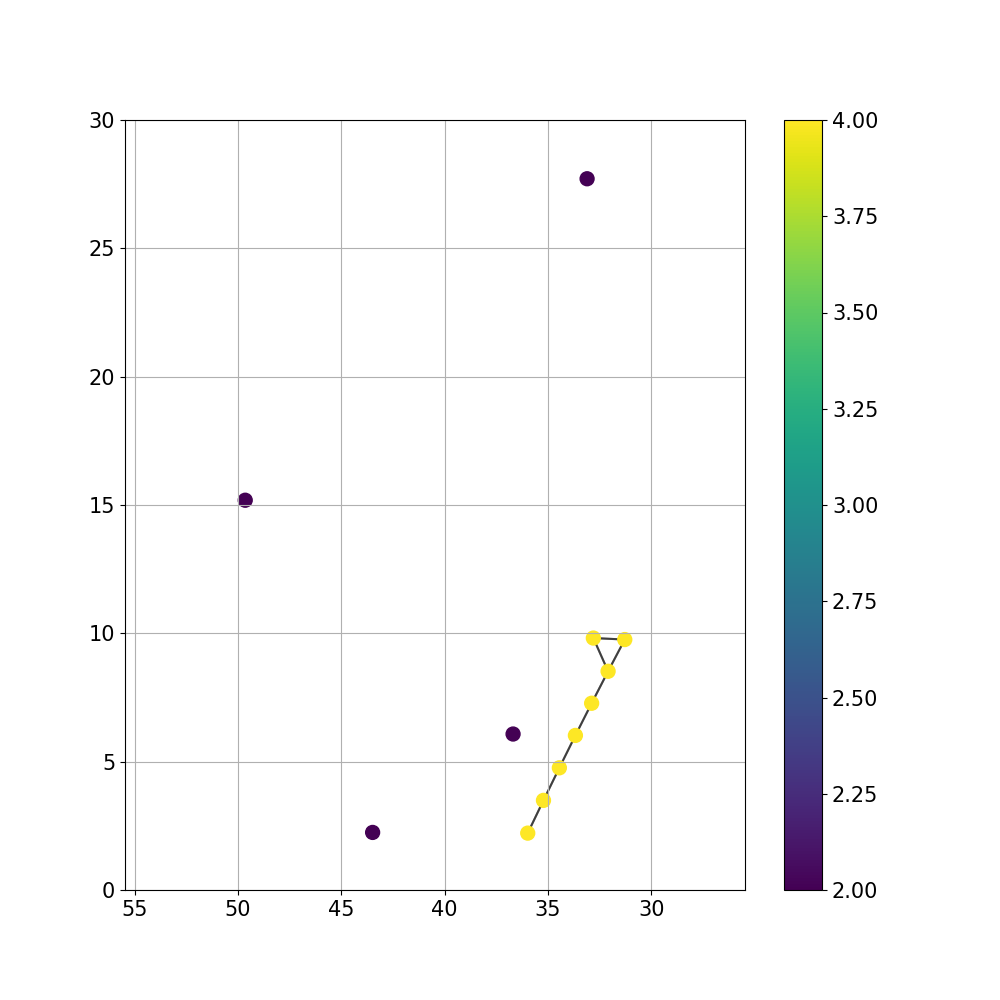

In [207]:
# [Pix_Theta,Pix_Phi,Pix_Centroid,Pix_Charge,Pix_PulseDuration]

for i,graph in enumerate(Graphs):
    Nodes = graph[0]
    Edges = graph[1]
    Edge_values = graph[2]

    # print(Edges)
    plt.figure(figsize=[10,10])
    plt.scatter(Nodes[:,1],90-Nodes[:,0],c=Nodes[:,5],s=100)
    plt.colorbar()
    for edge in Edges:
        edge_X = [Nodes[edge[0],1],Nodes[edge[1],1]]
        edge_Y = [90-Nodes[edge[0],0],90-Nodes[edge[1],0]]
        plt.plot(edge_X,edge_Y,'k',alpha=0.5,zorder = -1)

    # Check xlim of the axis
    xlim = plt.gca().get_xlim()
    # print(xlim)
    if xlim[1] - xlim[0] < 30:
        middle = (xlim[0] + xlim[1]) / 2
        plt.xlim(middle - 15, middle  + 15)
    plt.ylim([0,30])
    plt.gca().invert_xaxis()
    plt.grid()

    # plt.figure(figsize=[10,10])
    # for y,node in enumerate(Nodes):
    #     x = node[2]
    #     plt.errorbar(x,y,xerr=node[4],fmt='o')
    
    # plt.figure(figsize=[10,10])
    

        

    if i == 10: break

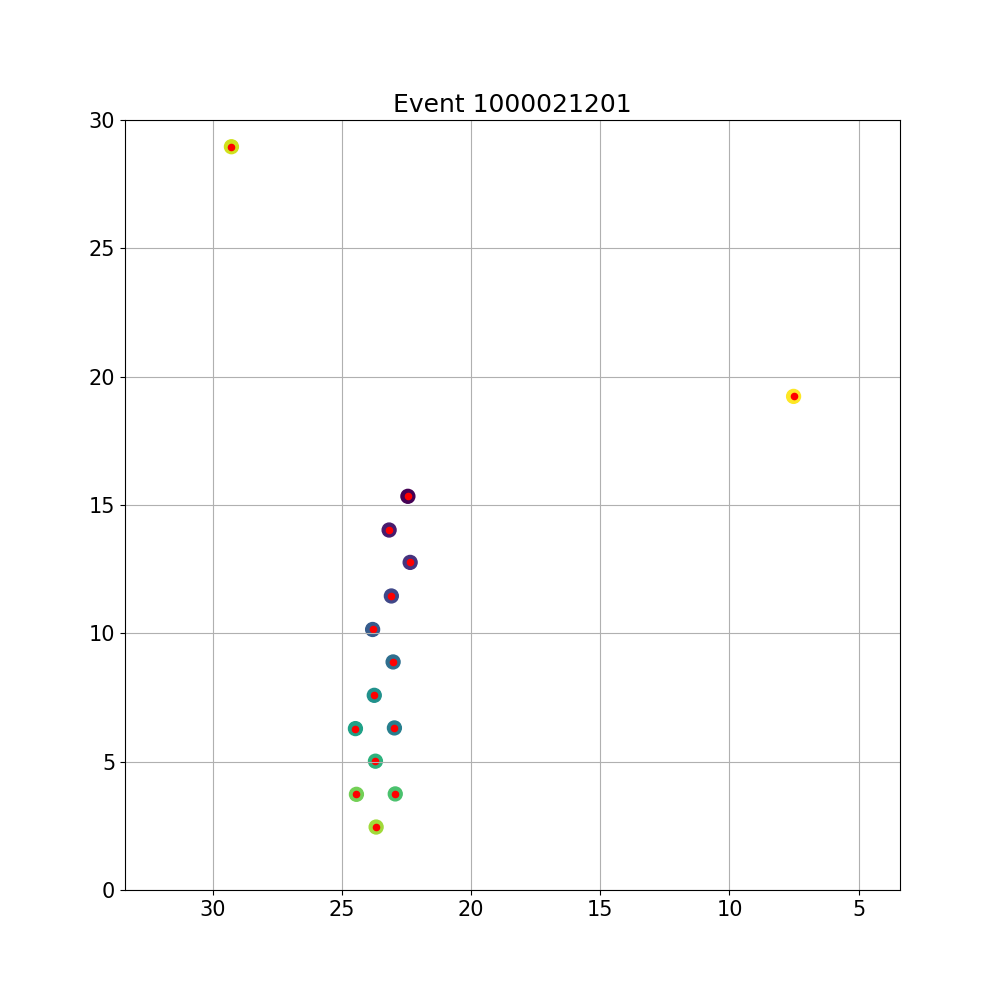

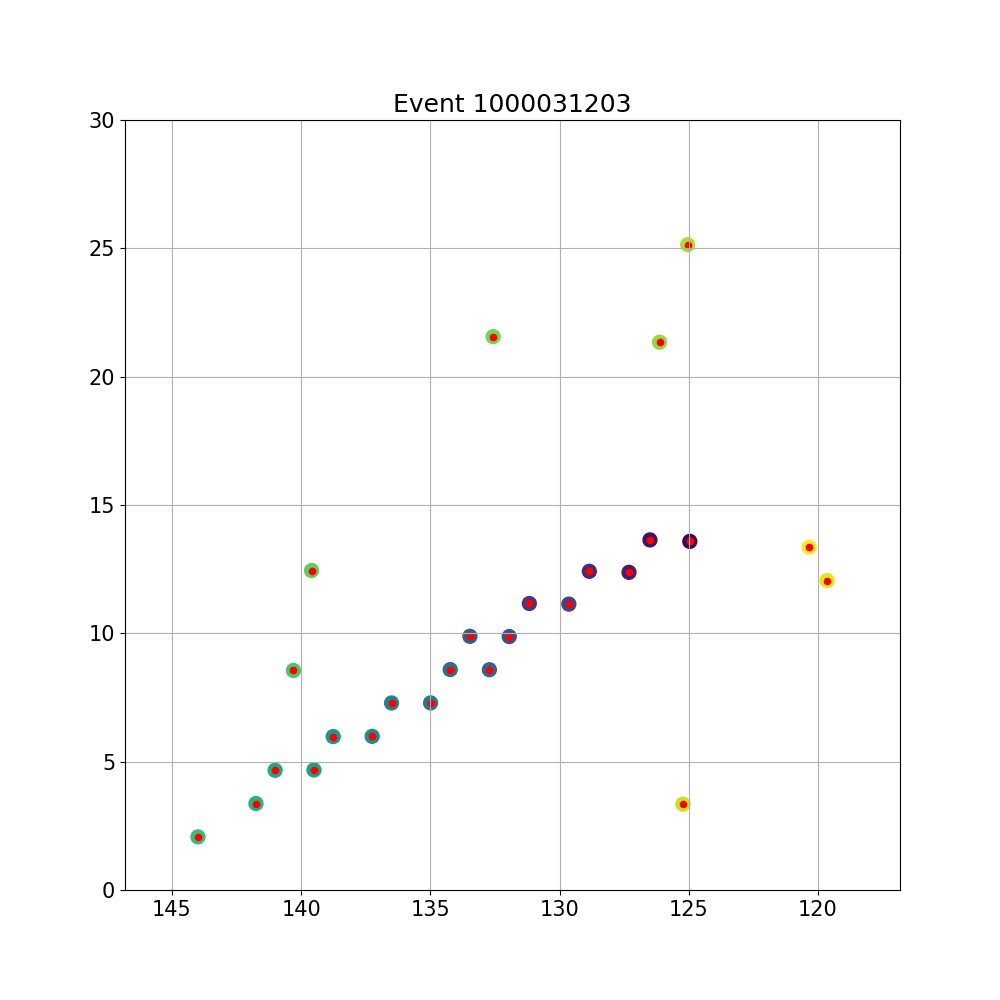

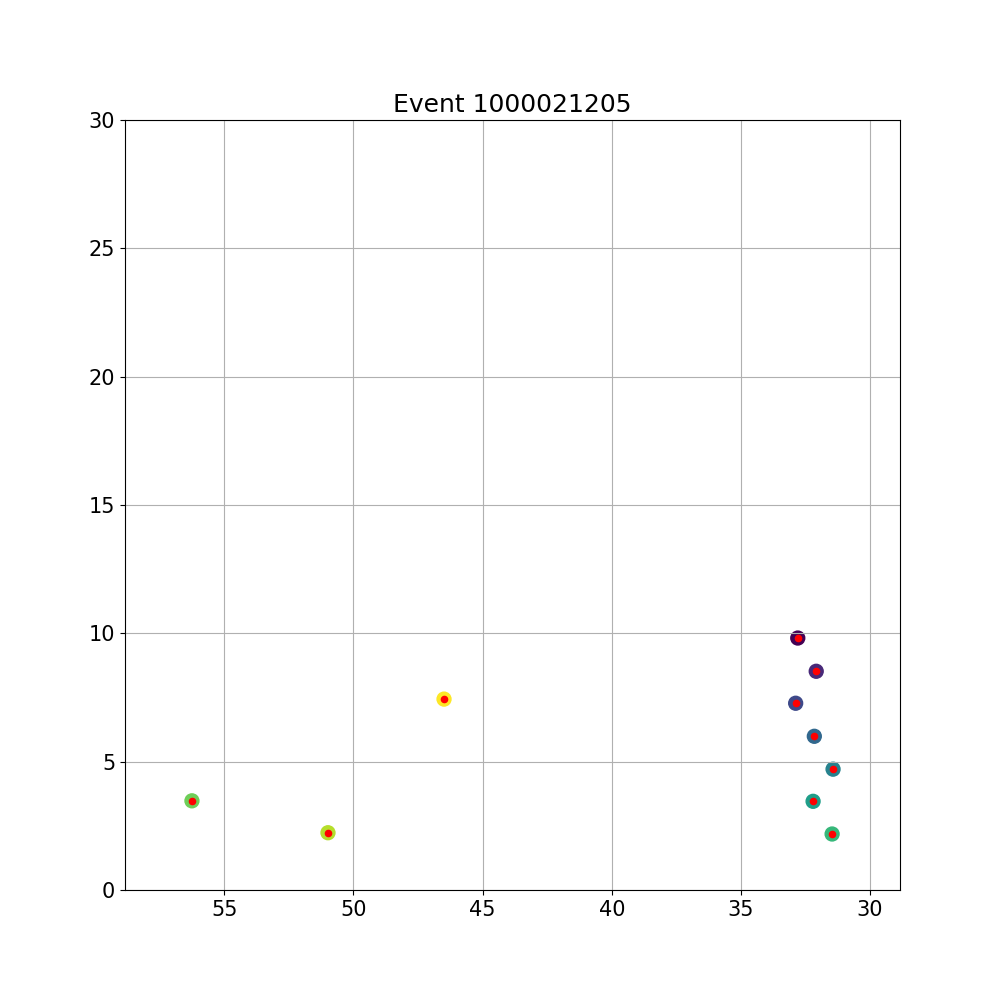

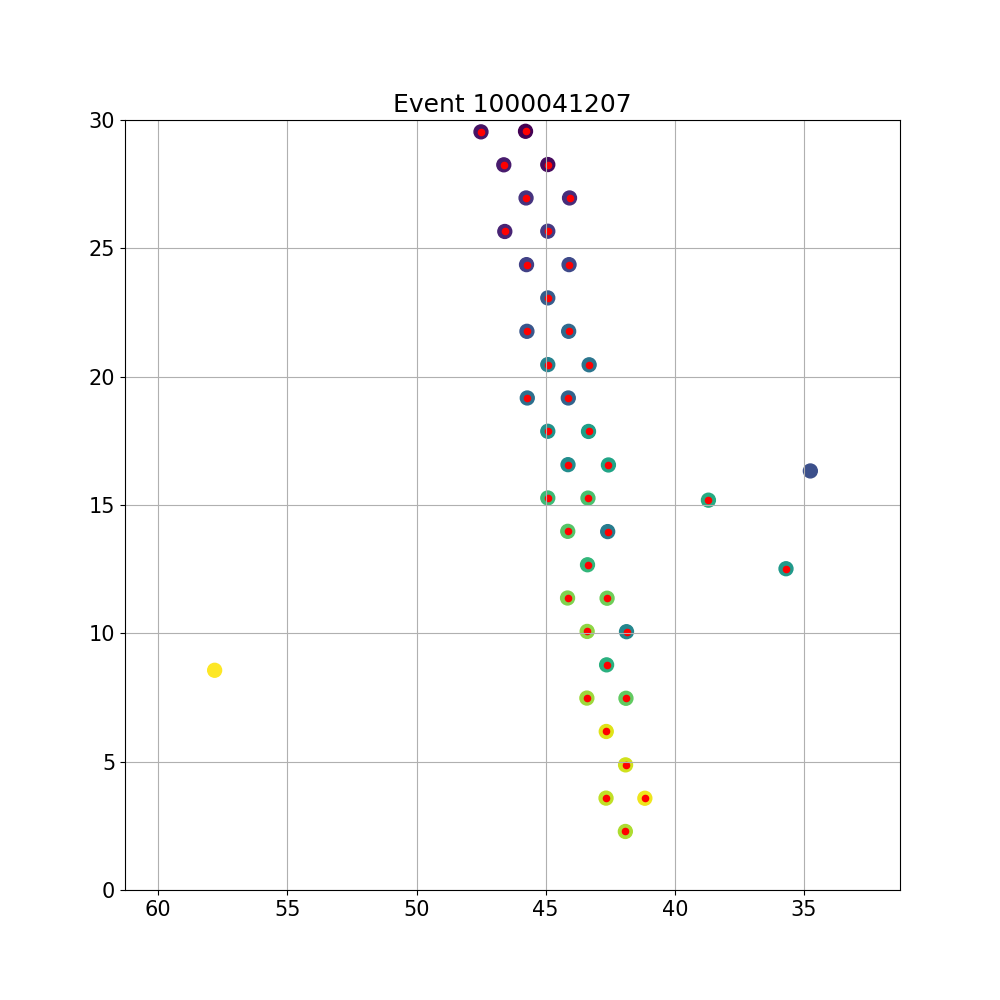

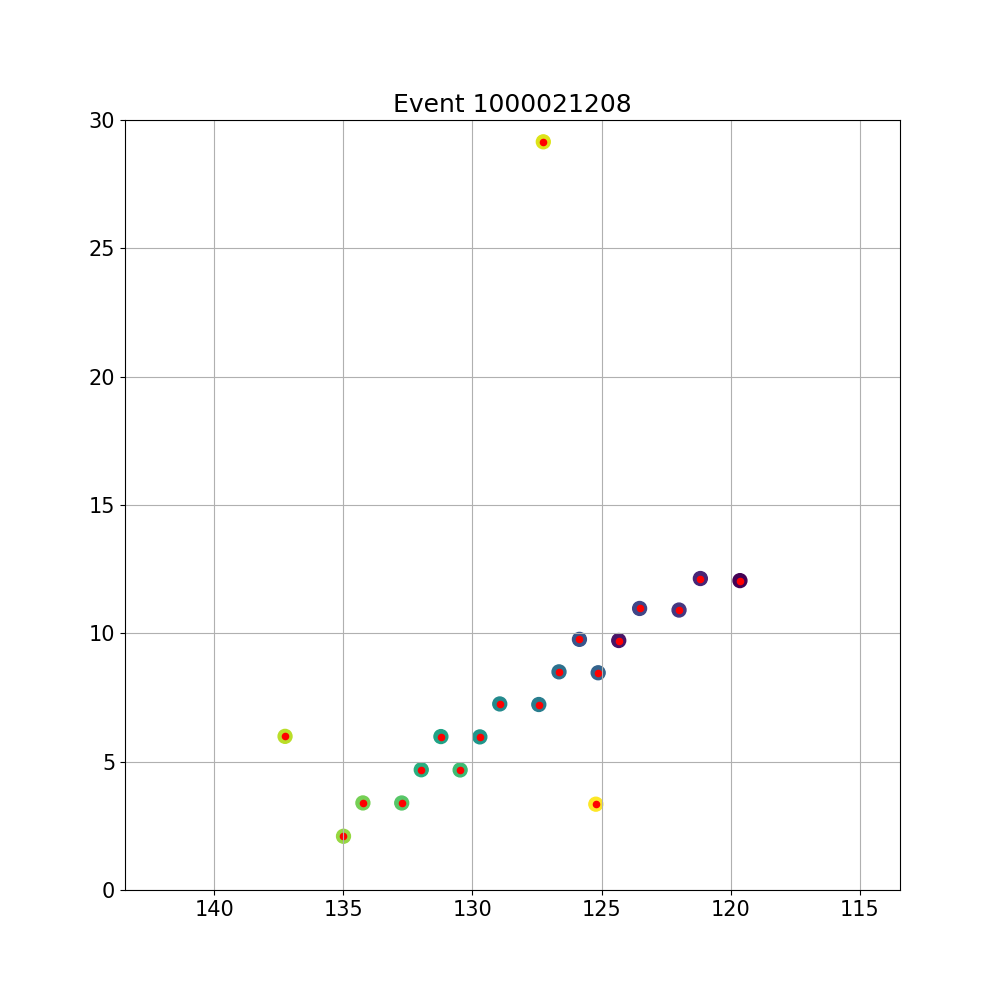

...

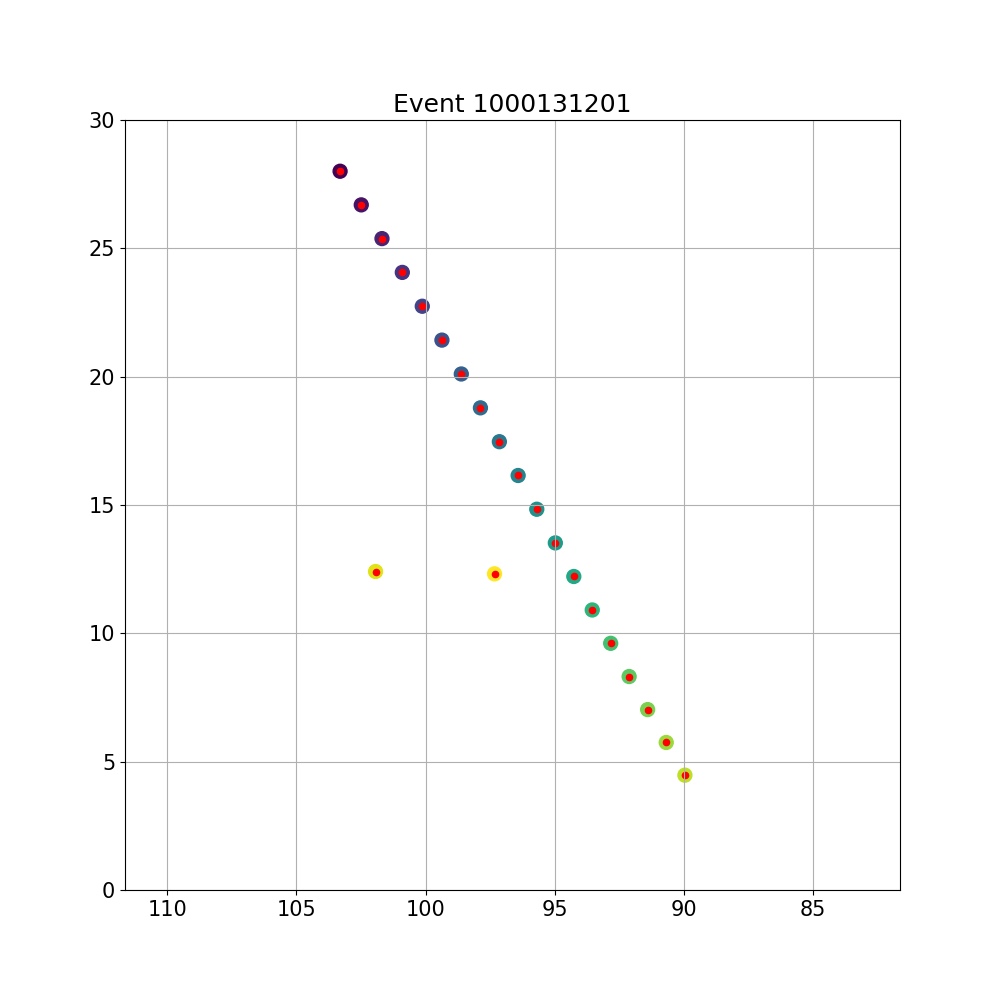

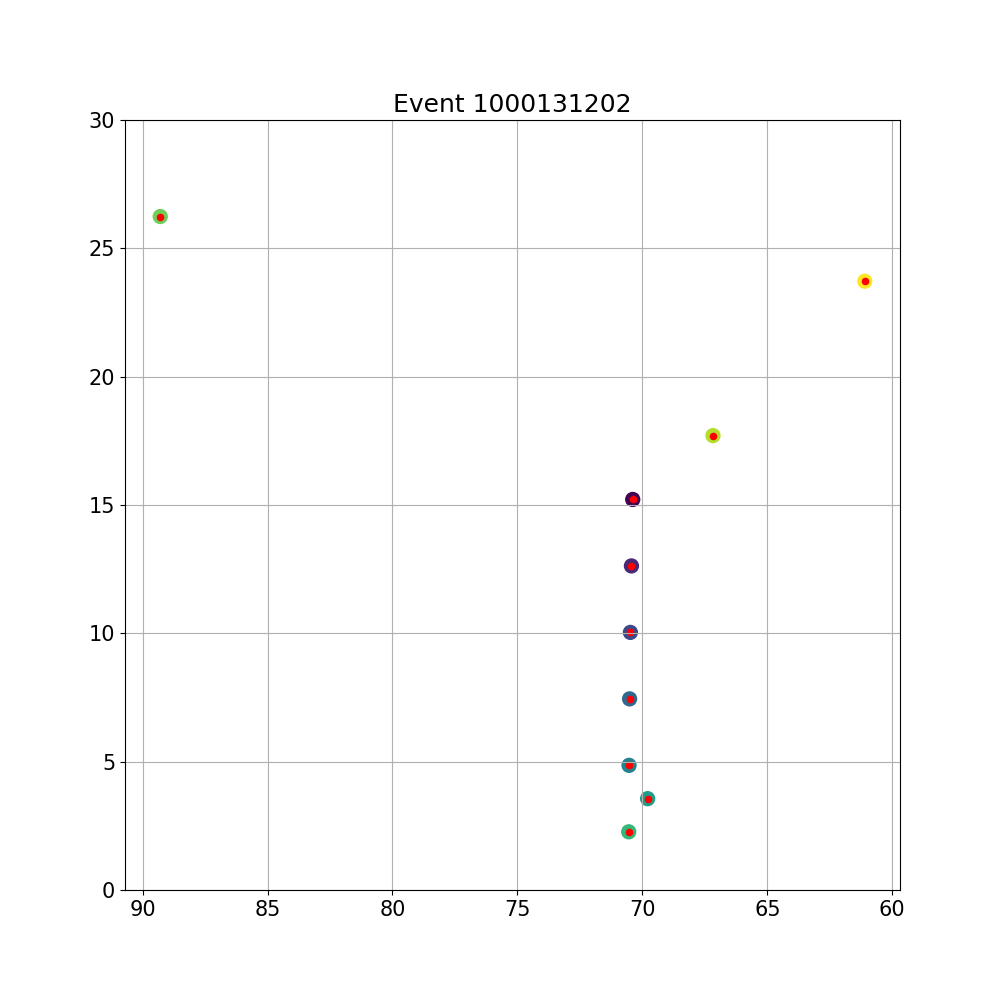

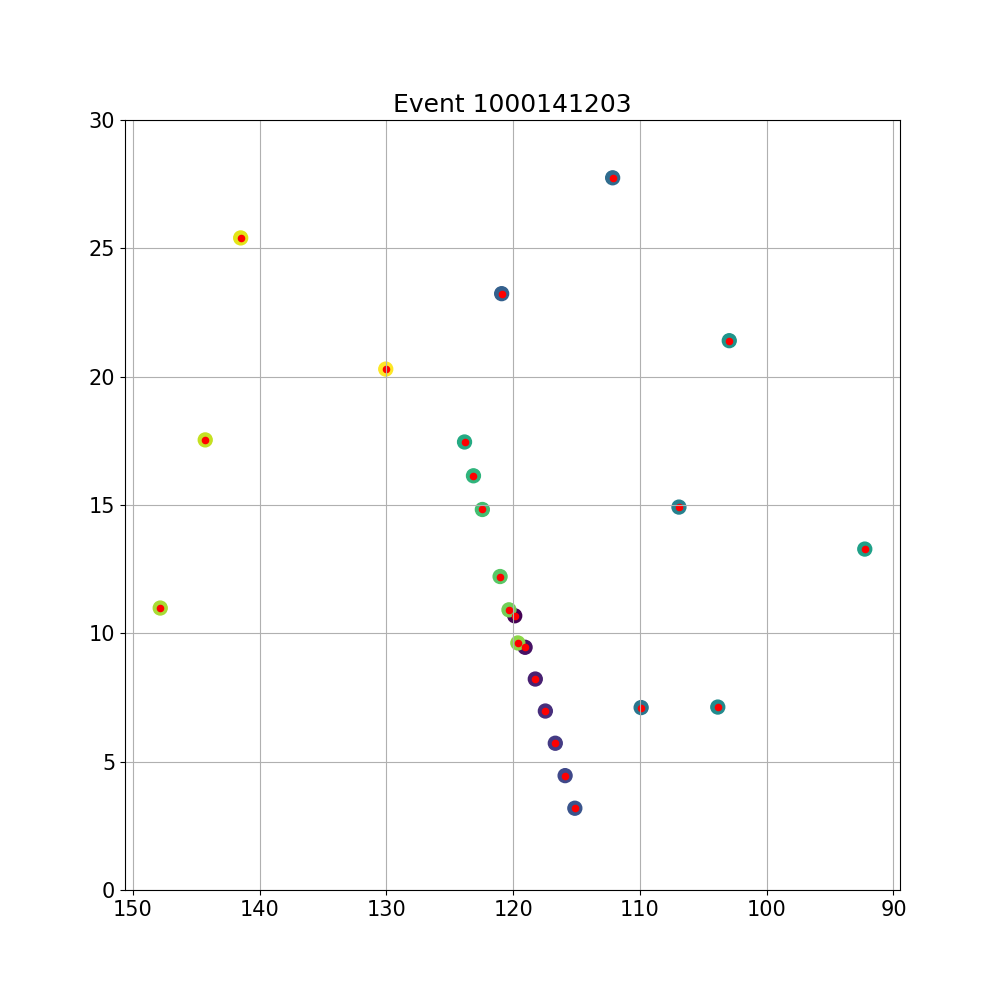

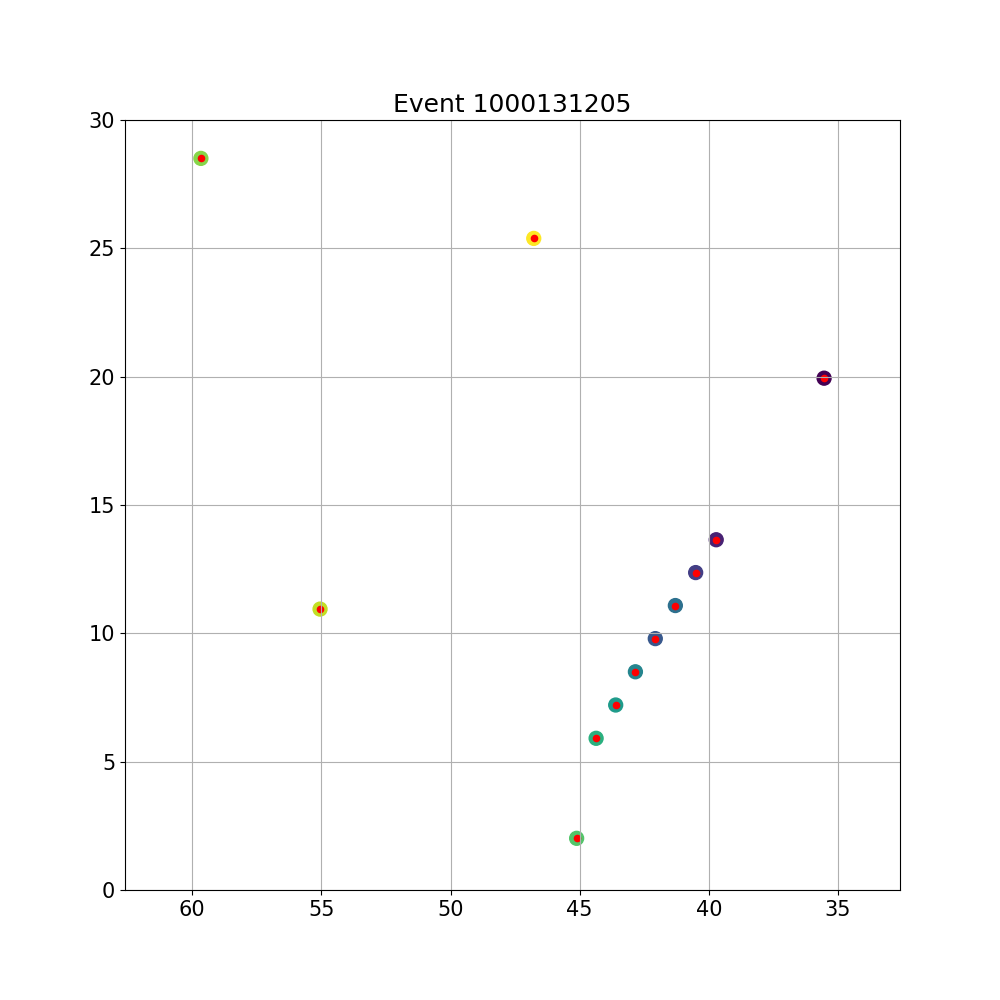

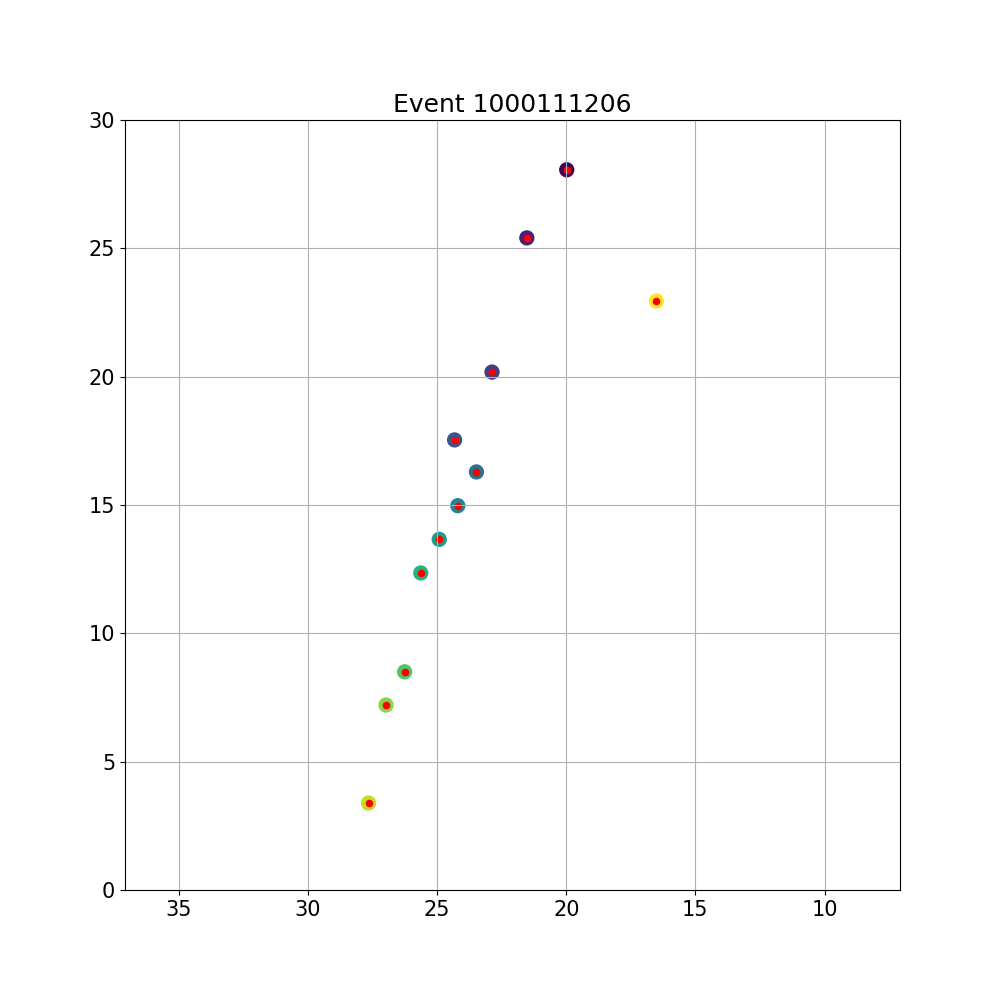

In [204]:
# Closest 40 pixels plots
Evs = 0
for i,event in enumerate(Dataset):
    status = event.get_pixel_values('Status')
    # if torch.sum(status==4)<=40: continue
    Pixel_Theta  = event.get_pixel_values('Theta')
    Pixel_Phi    = event.get_pixel_values('Phi')
    Pixel_Charge = event.get_pixel_values('Charge')
    SDP_Theta    = event.get_value('Gen_SDPTheta')
    SDP_Phi      = event.get_value('Gen_SDPPhi')
    
    cut = cut_pixels(Pixel_Theta/180*torch.pi,Pixel_Phi/180*torch.pi,SDP_Theta,SDP_Phi,pixel_count=40)
    

    Id = Run010.IDs[i]
    plt.figure(figsize=[10,10])
    plt.scatter(Pixel_Phi,90-Pixel_Theta,s=100,c=range(len(Pixel_Theta)))
    plt.scatter(Pixel_Phi[cut],90-Pixel_Theta[cut],c='r',s=20)
    plt.title(f'Event {Id}')

    # Check xlim of the axis
    xlim = plt.gca().get_xlim()
    # print(xlim)
    if xlim[1] - xlim[0] < 30:
        middle = (xlim[0] + xlim[1]) / 2
        plt.xlim(middle - 15, middle  + 15)
    plt.ylim([0,30])
    plt.gca().invert_xaxis()
    plt.grid()

    
    Evs+=1

    if Evs>25: break
    # break

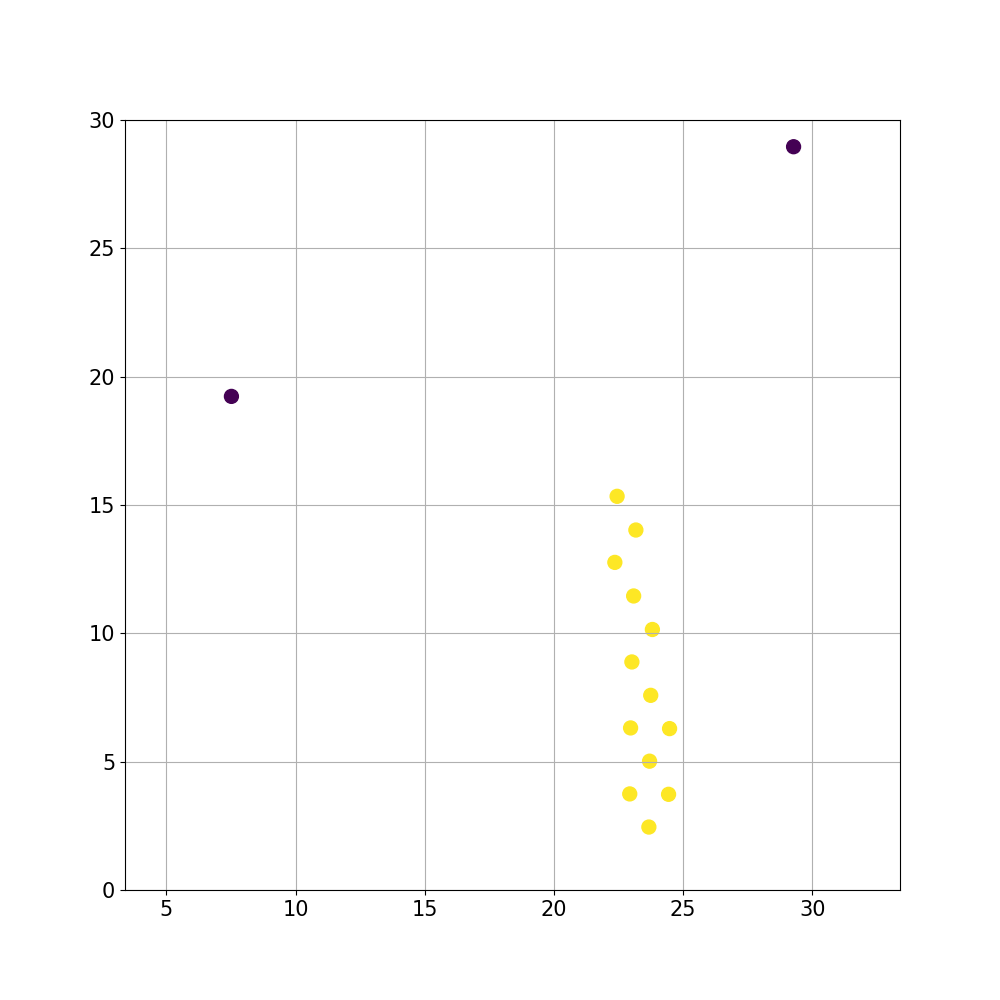

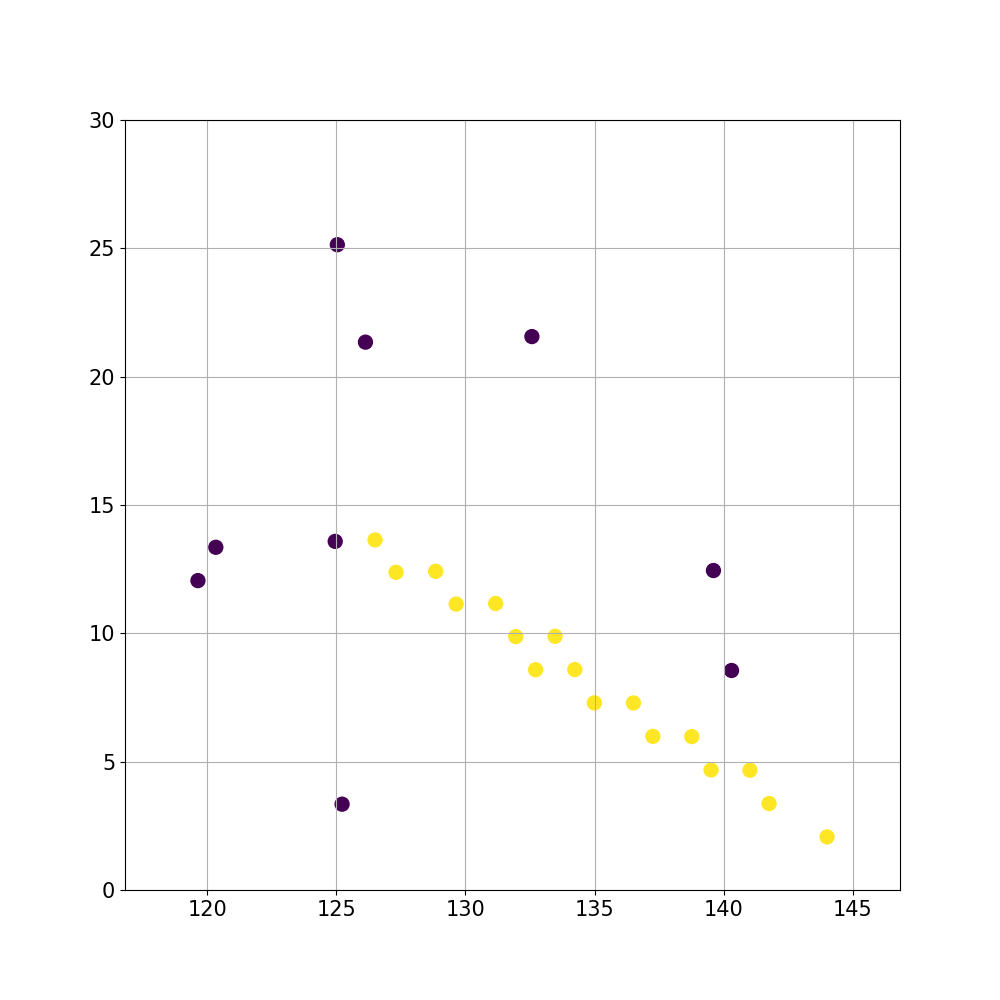

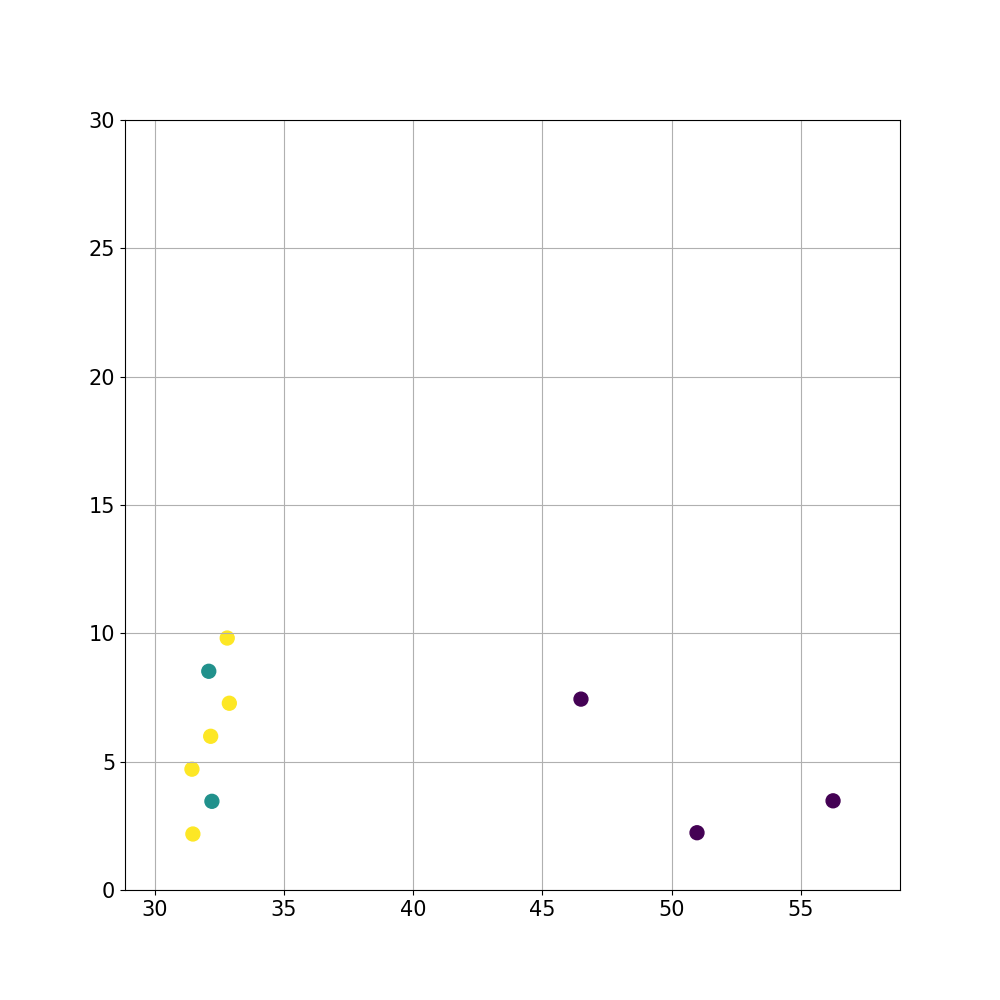

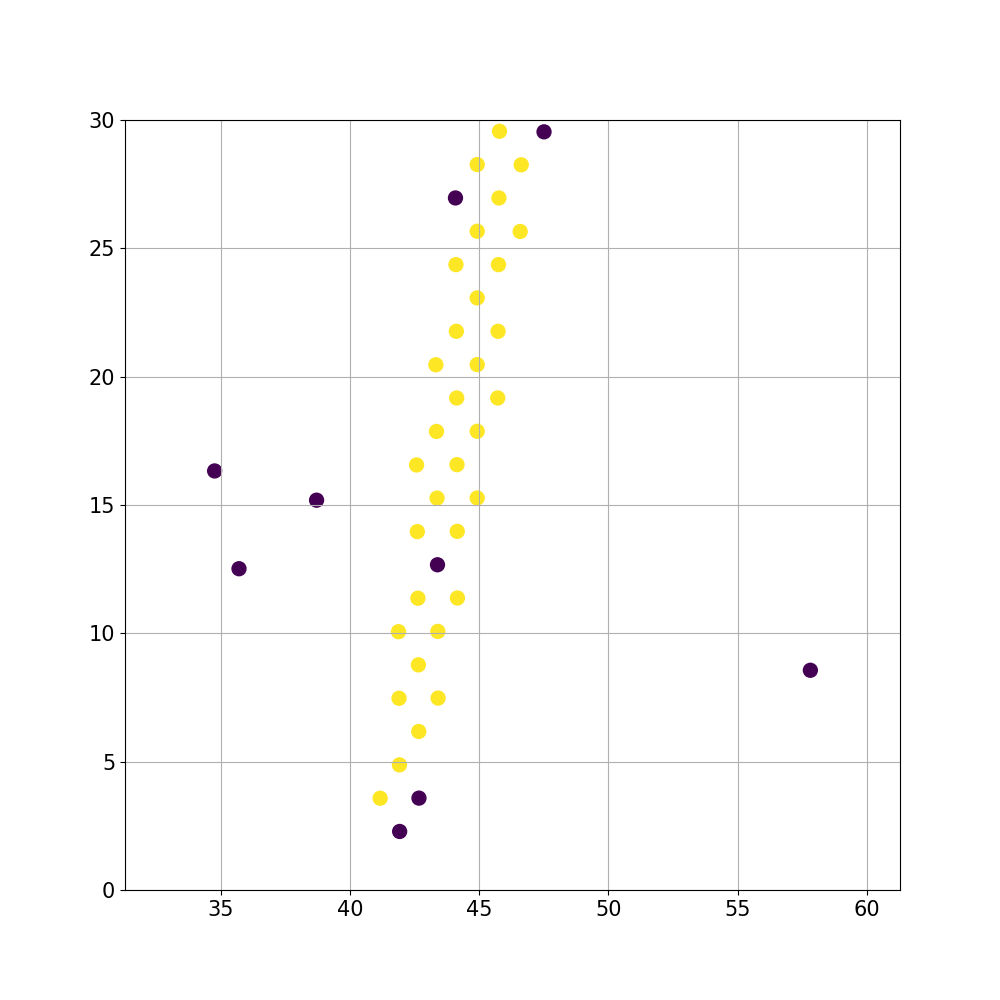

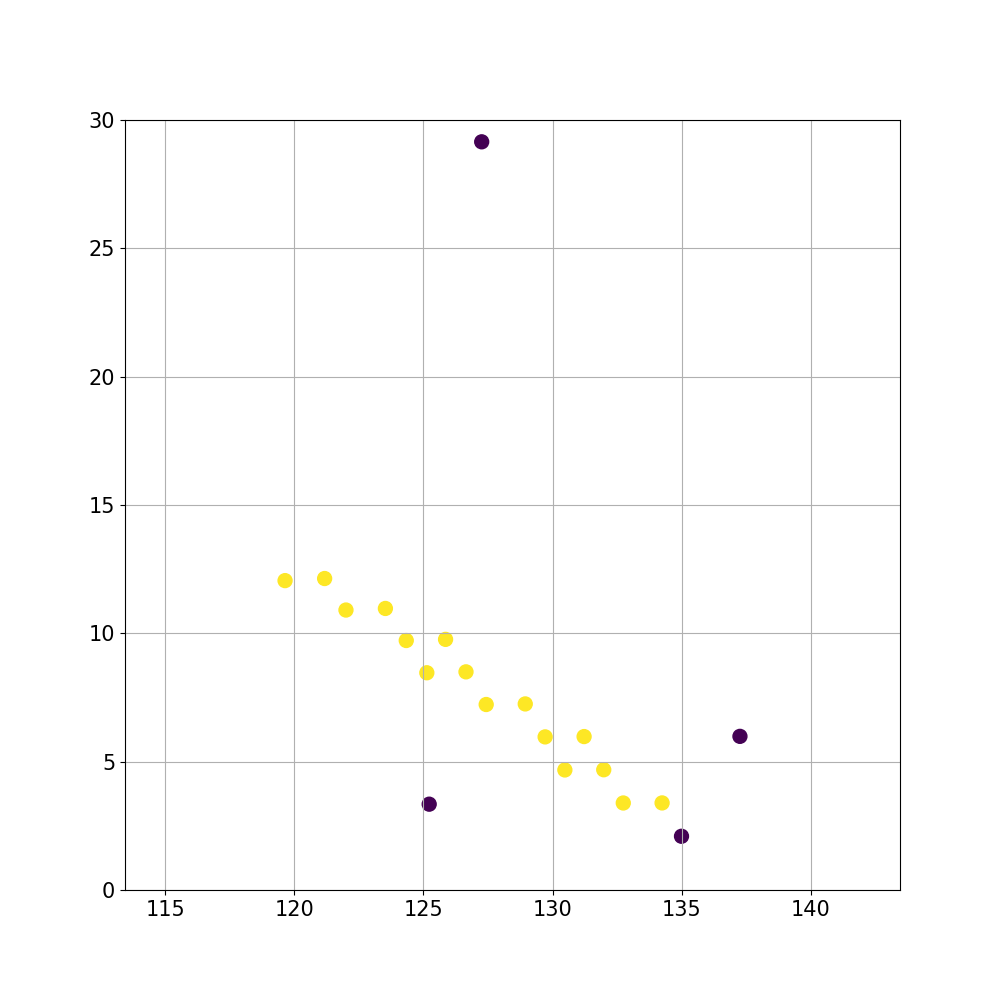

...

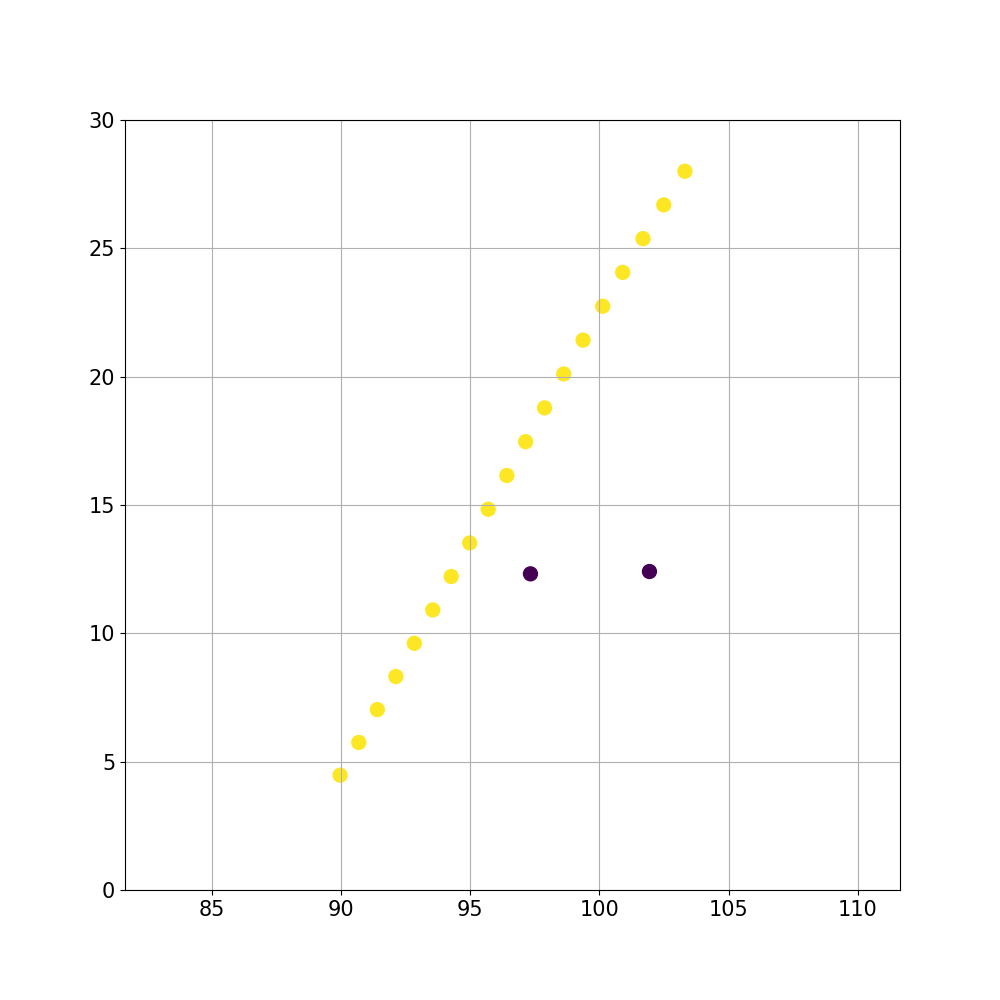

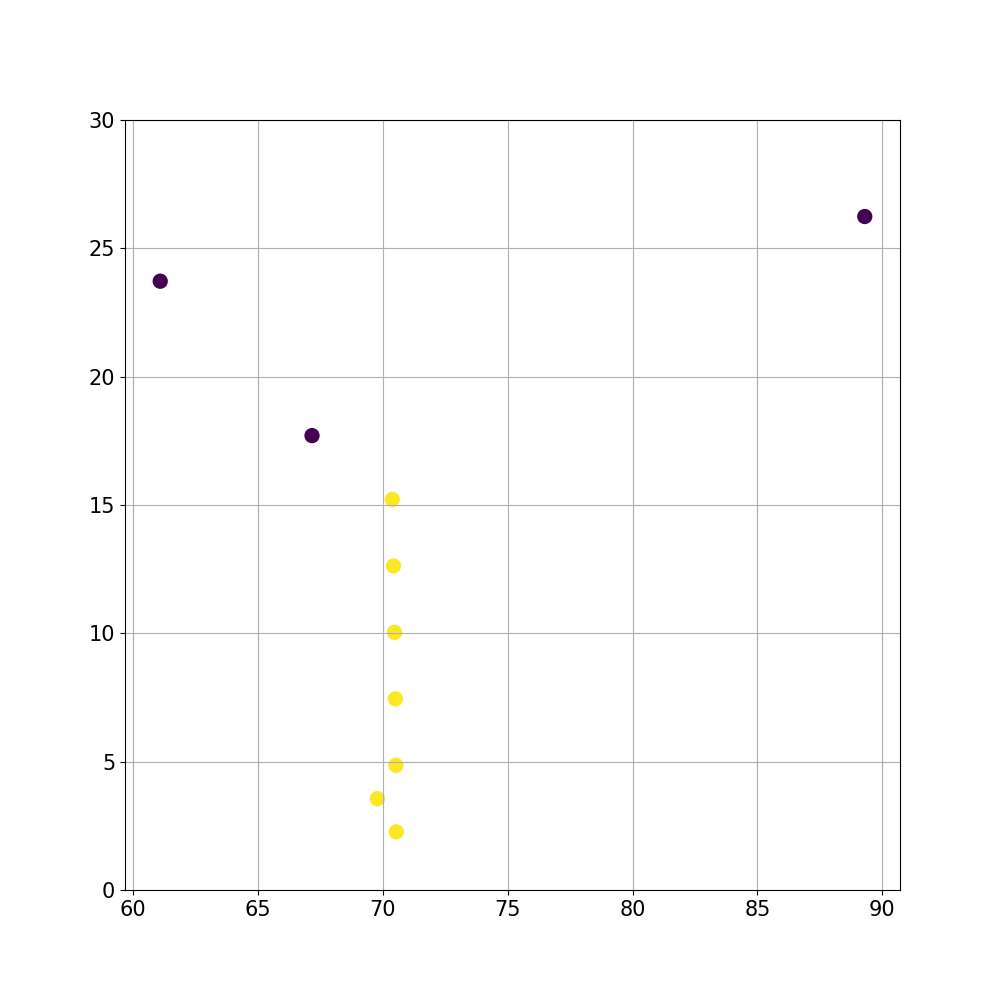

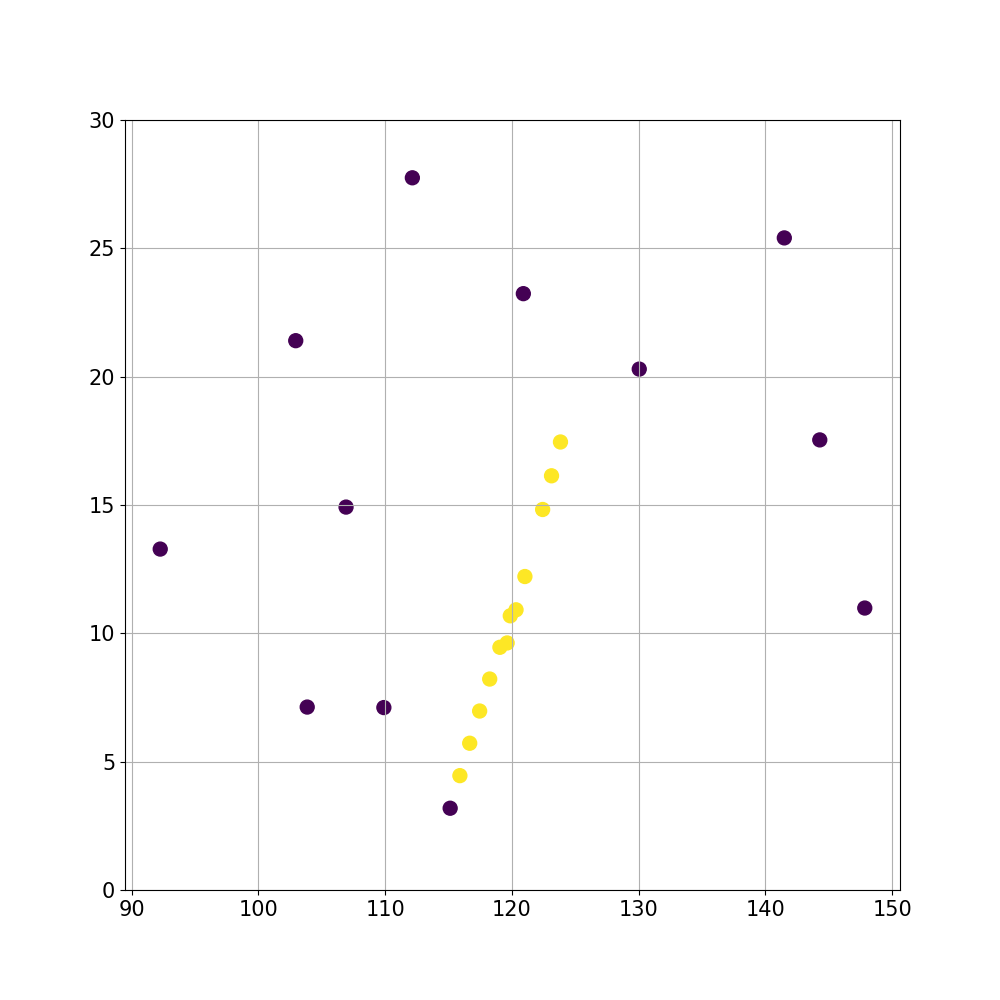

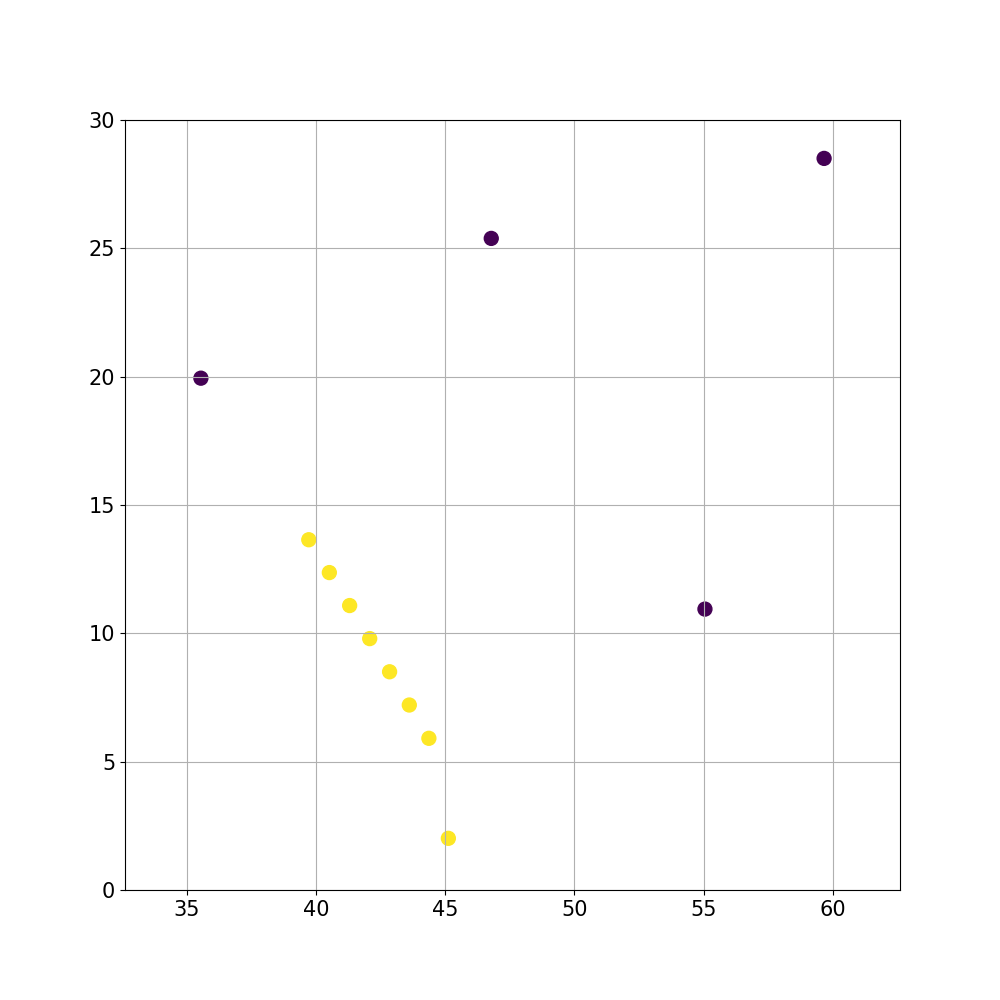

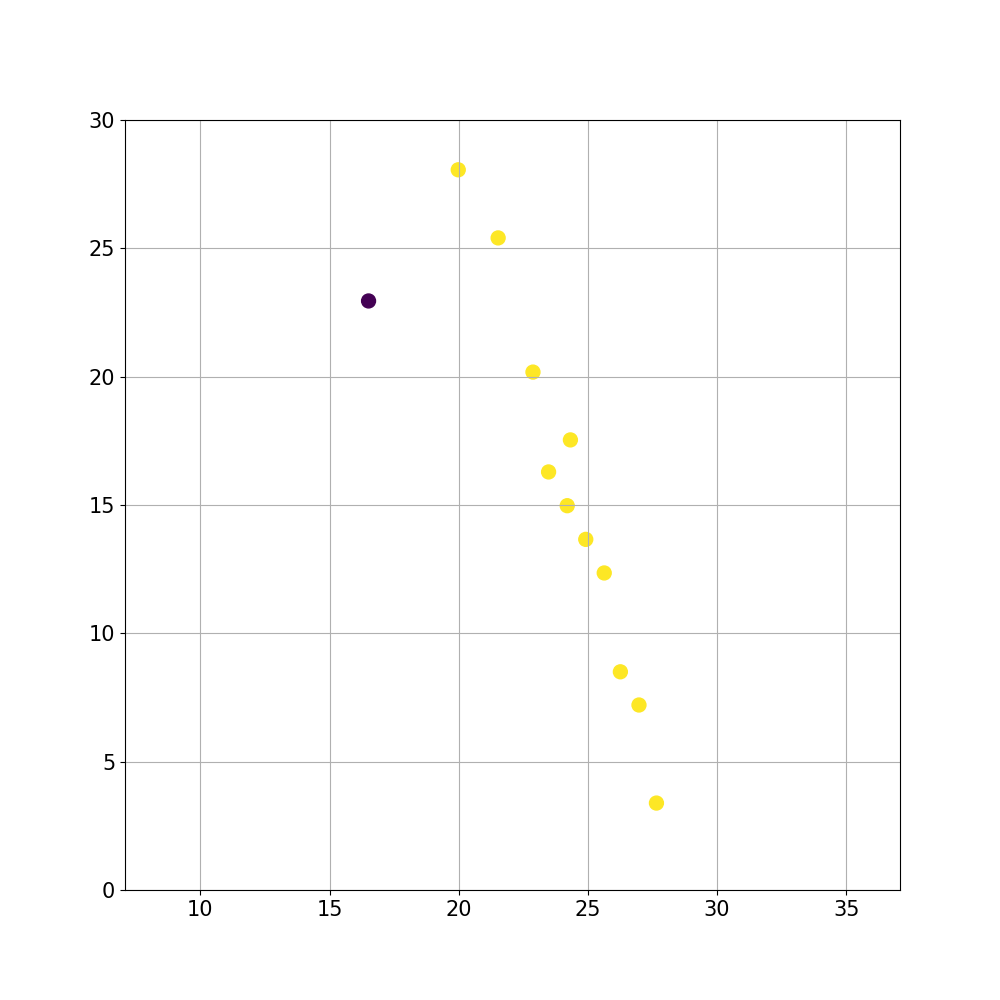

In [194]:
for event in Dataset:
    Pix_Phi   = event.get_pixel_values('Phi')
    Pix_Theta = event.get_pixel_values('Theta')
    status    = event.get_pixel_values('Status')
    plt.figure(figsize=[10,10])
    plt.scatter(Pix_Phi,90-Pix_Theta,s=100,c=status)
    plt.grid()
    plt.ylim([0,30])

    # Check xlim of the axis
    xlim = plt.gca().get_xlim()
    # print(xlim)
    if xlim[1] - xlim[0] < 30:
        middle = (xlim[0] + xlim[1]) / 2
        plt.xlim(middle - 15, middle  + 15)

    # plt.gca().invert_xaxis()
    plt.show()

# Xmax Axis Data Collect

In [6]:
# Invisible Energy Plots

# Gen_dEdX = Run010.get_values('Gen_dEdXmax')*10**17
# Primary  = Run010.get_values('Primary')
# LogE     = Run010.get_values('Gen_LogE')

# print(Primary.unique())

# Energy  = 10**LogE

# Ratio = Gen_dEdX/Energy

# plt.figure(figsize = [10,10])
# for i,primary in enumerate(torch.unique(Primary)):
#     plt.hist(Ratio[Primary==primary],bins=100,histtype='step',label=primary,range = [0.1,0.2])
#     plt.text(0.15,1000-i*200,f'mean for {primary} = {Ratio[Primary==primary].mean():.3f}')
# plt.legend()
# plt.yscale('log')


tensor([ 2004.,  2212.,  8016., 26056.])


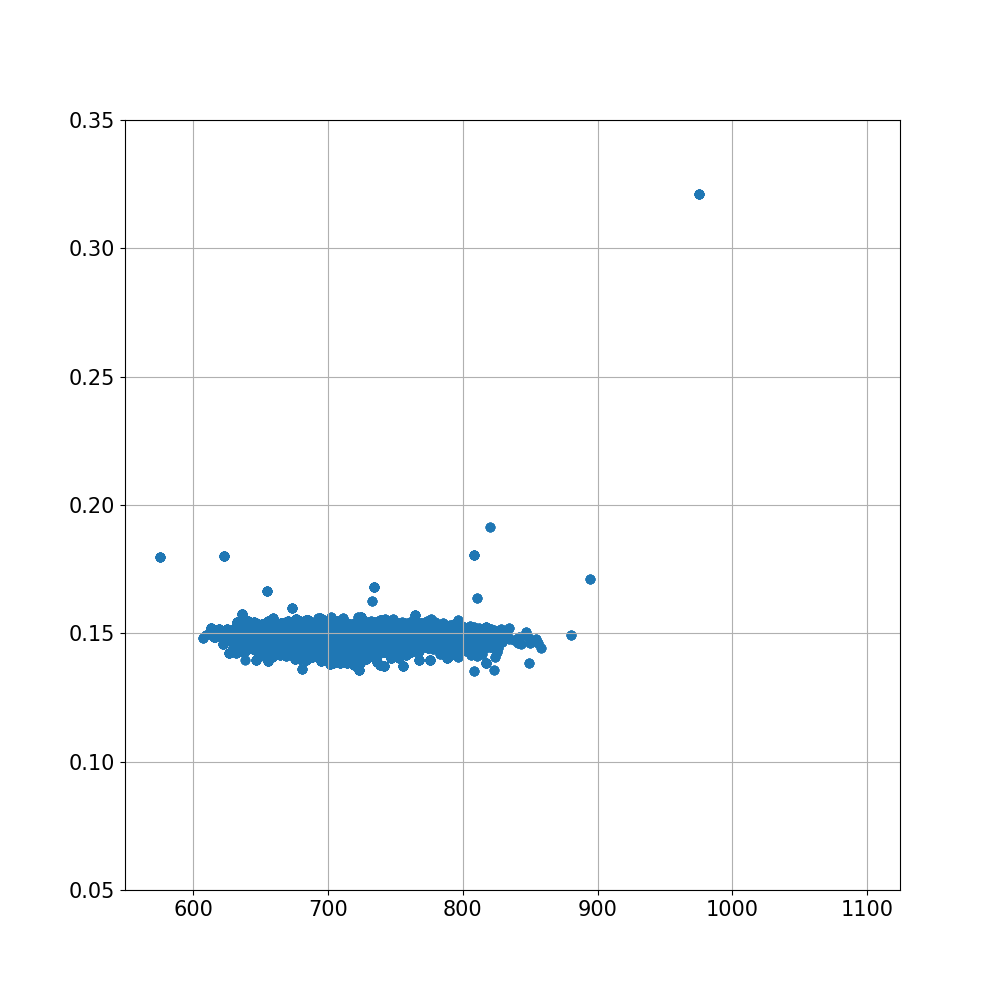

In [15]:
# Invisible Energy Plots

# Gen_dEdX = Run010.get_values('Gen_dEdXmax')*10**17
# Primary  = Run010.get_values('Primary')
# LogE     = Run010.get_values('Gen_LogE')
# Xmax     = Run010.get_values('Gen_Xmax')
# UspL     = Run010.get_values('Rec_UspL')
# UspR     = Run010.get_values('Rec_UspR')


# print(Primary.unique())

# Energy  = 10**LogE

# Ratio = Gen_dEdX/Energy
# Cut = Primary == 2212
# Cut = Primary == 26056
# plt.figure(figsize = [10,10])
# plt.scatter(Xmax[Cut],Ratio[Cut])
# plt.ylim(0.05,0.35)
# plt.grid()

In [6]:
def Unnormalise_Axis_Xmax_Energy(Data):
    # Data[:,0] = Data[:,0]
    # Data[:,1] = Data[:,1]
    # Data[:,2] = Data[:,2]
    Data[:,4] = torch.asin(Data[:,4])
    Data[:,5] = Data[:,5]*30000
    Data[:,5] = Data[:,6]*70+750
    Data[:,6] = Data[:,7]*19+19
    return Data


def Truth_Axis_Xmax_Energy(Dataset,ProcessingDataset):
    '''Converts geometry to axis data:
    Gets Xmax, and Energy
    
    '''
    IDsList = ()
    Offsets = {1:-75/180*torch.pi,2:-45/180*torch.pi,3:-15/180*torch.pi,4:15/180*torch.pi,5:45/180*torch.pi,6:75/180*torch.pi}

    Gen_SDPPhi   = torch.zeros(len(Dataset))
    Gen_SDPTheta = torch.zeros(len(Dataset))
    Gen_Chi0     = torch.zeros(len(Dataset))
    Gen_CEDist   = torch.zeros(len(Dataset))
    Gen_Xmax     = torch.zeros(len(Dataset))
    Gen_LogE     = torch.zeros(len(Dataset))

    Rec_SDPPhi   = torch.zeros(len(Dataset))
    Rec_SDPTheta = torch.zeros(len(Dataset))
    Rec_Chi0     = torch.zeros(len(Dataset))
    Rec_CEDist   = torch.zeros(len(Dataset))
    Rec_Xmax     = torch.zeros(len(Dataset))
    Rec_LogE     = torch.zeros(len(Dataset))



    SelectedTelescopes = torch.zeros(len(Dataset))
    for i,Event in enumerate(Dataset):
        # ID Checks
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)

        if i%100 == 0:
            print(f'    Processing Truth {i} / {len(Dataset)}',end='\r')
        TelIDs        = Event.get_pixel_values('TelID')
        EyeIDs        = Event.get_pixel_values('EyeID')
        # Check if only HEAT (Check if any EyeID is not equal to 5)
        if torch.sum(EyeIDs != 5) == 0:
            continue

        Mask = (TelIDs != 7)*(TelIDs != 8)*(TelIDs != 9)
        if torch.sum(Mask) == 0: # Should be impossible cause of the above but who knows?
            continue
        SelectedTelescopeID   = TelIDs[Mask].int().bincount().argmax()
        SelectedTelescopes[i] = SelectedTelescopeID
        Gen_SDPPhi  [i]       = Event.get_value('Gen_SDPPhi')
        Gen_SDPTheta[i]       = Event.get_value('Gen_SDPTheta')
        Gen_Chi0    [i]       = Event.get_value('Gen_Chi0')
        Gen_CEDist  [i]       = Event.get_value('Gen_CoreEyeDist')
        Gen_Xmax    [i]       = Event.get_value('Gen_Xmax')
        Gen_LogE    [i]       = Event.get_value('Gen_LogE')
        
        Rec_SDPPhi  [i]       = Event.get_value('Rec_SDPPhi')
        Rec_SDPTheta[i]       = Event.get_value('Rec_SDPTheta')
        Rec_Chi0    [i]       = Event.get_value('Rec_Chi0')
        Rec_CEDist  [i]       = Event.get_value('Rec_CoreEyeDist')
        Rec_Xmax    [i]       = Event.get_value('Rec_Xmax')
        Rec_LogE    [i]       = Event.get_value('Rec_LogE')


    print()

    # Normalise Phi
    Gen_SDPPhi   = Gen_SDPPhi+2*torch.pi*(Gen_SDPPhi<0)
    Gen_SDPPhi   -= torch.pi
    Rec_SDPPhi   = Rec_SDPPhi+2*torch.pi*(Rec_SDPPhi<0)
    Rec_SDPPhi   -= torch.pi
    for i in range(1,7): # Apply offsets
        print(f'Sum of SelectedTelescopes == {i} is {torch.sum(SelectedTelescopes == i)}')
        Gen_SDPPhi[SelectedTelescopes == i] -= Offsets[i]
        Rec_SDPPhi[SelectedTelescopes == i] -= Offsets[i]
    
    Gen_SDPPhi   = torch.sin(Gen_SDPPhi)
    Rec_SDPPhi   = torch.sin(Rec_SDPPhi)

    # Normalise x,y,z
    Gen_SDPTheta -= torch.pi/2
    Gen_Chi0     -= torch.pi/2
    Rec_SDPTheta -= torch.pi/2
    Rec_Chi0     -= torch.pi/2

    Gen_x = torch.sin(Gen_Chi0)*torch.cos(Gen_SDPTheta)
    Gen_y = torch.sin(Gen_SDPTheta)
    Gen_z = torch.cos(Gen_Chi0)*torch.cos(Gen_SDPTheta)

    Rec_x = torch.sin(Rec_Chi0)*torch.cos(Rec_SDPTheta)
    Rec_y = torch.sin(Rec_SDPTheta)
    Rec_z = torch.cos(Rec_Chi0)*torch.cos(Rec_SDPTheta)

    # Normalise CE Distance
    Gen_CEDist /= 30000
    Rec_CEDist /= 30000

    # Normalise Xmax
    Gen_Xmax -= 750
    Rec_Xmax -= 750

    Gen_Xmax /=70
    Rec_Xmax /=70

    # Normalise LogE

    Gen_LogE -= 19
    Rec_LogE -= 19

    

    if ProcessingDataset != None:

        ProcessingDataset._Truth = torch.stack((Gen_x,Gen_y,Gen_z,Gen_SDPPhi,Gen_CEDist,Gen_Xmax,Gen_LogE),dim=1)
        ProcessingDataset._Rec   = torch.stack((Rec_x,Rec_y,Rec_z,Rec_SDPPhi,Rec_CEDist,Rec_Xmax,Rec_LogE),dim=1)

        ProcessingDataset.Unnormalise_Truth = Unnormalise_Axis_Xmax_Energy
        ProcessingDataset.Truth_Keys = ('x','y','z','SDPPhi','CEDist','Xmax','LogE')
        ProcessingDataset.Truth_Units =('','','','rad','m','g/cm^2','')
        if ProcessingDataset._EventIds is None:
            ProcessingDataset._EventIds = IDsList
        else:
            assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'
    
    else:
        return torch.stack((Gen_x,Gen_y,Gen_z,Gen_SDPPhi,Gen_CEDist,Gen_Xmax,Gen_LogE),dim=1),torch.stack((Rec_x,Rec_y,Rec_z,Rec_SDPPhi,Rec_CEDist,Rec_Xmax,Rec_LogE),dim=1),IDsList
    

Gen_Truth,Rec_Truth,IDsList = Truth_Axis_Xmax_Energy(Run010,None)





    Processing Truth 185500 / 185582
Sum of SelectedTelescopes == 1 is 20142
Sum of SelectedTelescopes == 2 is 34132
Sum of SelectedTelescopes == 3 is 39205
Sum of SelectedTelescopes == 4 is 40173
Sum of SelectedTelescopes == 5 is 33409
Sum of SelectedTelescopes == 6 is 18255


In [43]:
# # CEDist = Gen_Truth[:,4].clone()
# # Xmax   = Gen_Truth[:,5].clone()

# # print(torch.mean(Xmax))
# # print(torch.std( Xmax))


# # CEDist /= 30000
# # plt.figure(figsize=[10,10])
# # plt.hist(CEDist.numpy(),bins=100)


# # Xmax -= 750
# # Xmax /= 70
# # plt.figure(figsize=[10,10])
# # plt.hist(Xmax.numpy(),bins=100)


# X = Gen_Truth[:,0].clone()
# Y = Gen_Truth[:,1].clone()
# Z = Gen_Truth[:,2].clone()
# plt.figure(figsize=[10,10])
# # plt.scatter(X.numpy(),Y.numpy(),s=1)
# r = X**2 + Y**2
# r = torch.sqrt(r)
# plt.scatter(r,Z,s=1)

In [8]:
def Graph_Conv3d_Traces(Dataset,ProcessingDataset):
    '''Will just provide 1 mirror array of pixel traces'''
    IDsList = ()
    Graph = [] # Will have Event in dim1, [Trace,X,Y,PulseStart] in dim2, values of dim2 in dim3
    for i,Event in enumerate(Dataset):
        print(f'    Processing Main {i} / {len(Dataset)}',end='\r')
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)

        Traces = Event.get_trace_values()
        Pstart = Event.get_pixel_values('PulseStart')
        # Pstop  = Event.get_pixel_values('PulseStop')

        EyeID = Event.get_pixel_values('EyeID'  )
        TelID = Event.get_pixel_values('TelID'  )
        PixID = Event.get_pixel_values('PixelID')
        PixStatus = Event.get_pixel_values('Status')

        if torch.sum(EyeID != 5) == 0 or torch.sum(TelID<7) == 0:
            Mask = torch.zeros(len(EyeID)).bool()
        else:
            Mask =(EyeID != 5) * (TelID==torch.mode(TelID[TelID<7]).values.item()) * (PixStatus == 4)

        Traces = Traces[Mask]
        Pstart = Pstart[Mask]
        PixID  = PixID[Mask]

        Xs,Ys = IndexToXY(PixID,return_tensor=True)

        # Traces normalised Here
        Traces = torch.log1p((Traces).clip(min=0))
        # Pstart normalised Here
        if len(Pstart)>0 : Pstart = Pstart - torch.min(Pstart)
        # Append to the GraphData
        Graph.append([Traces,Xs,Ys,Pstart])
        
        
    
    if ProcessingDataset is None:
        return Graph
    ProcessingDataset._Graph = Graph
    ProcessingDataset.GraphData = True
    if ProcessingDataset._EventIds is None:
        ProcessingDataset._EventIds = IDsList
    else:
        assert ProcessingDataset._EventIds == IDsList, 'EventIDs do not match'    

GraphData = Graph_Conv3d_Traces(Run010,None)

In [7]:
def Graph_Conv3d_Traces_Distances(Dataset,ProcessingDataset):
    '''Will just provide 1 mirror array of pixel traces and also each pixel will have the distance to shower axis and height at shower axis'''
    EyeHeights = {1:1416,2:1416,3:1476,4:1712,5:1707,6:1710}
    
    IDsList = ()
    Graph = [] # Will have Event in dim1, [Traces,Distances,X,Y,PulseStart] in dim2, values of dim2 in dim3

    for i,Event in enumerate(Dataset):
        print(f'    Processing Main {i} / {len(Dataset)}',end='\r')
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)
        
        Traces = Event.get_trace_values()
        Pstart = Event.get_pixel_values('PulseStart')
        # Pstop  = Event.get_pixel_values('PulseStop')

        EyeID = Event.get_pixel_values('EyeID'  )
        TelID = Event.get_pixel_values('TelID'  )
        PixID = Event.get_pixel_values('PixelID')
        PixStatus = Event.get_pixel_values('Status')
        PixelChi_i = Event.get_pixel_values('Chi_i')

        Event_Chi0     = Event.get_value('Rec_Chi0')
        Event_RP       = Event.get_value('Rec_Rp')
        Event_SDPTheta = Event.get_value('Rec_SDPTheta')



        if torch.sum(EyeID != 5) == 0 or torch.sum(TelID<7) == 0:
            Mask = torch.zeros(len(EyeID)).bool()
            EventEye = 5
        else:
            EventEye = torch.mode(EyeID[EyeID != 5]).values.item()
            Mask     =(EyeID != 5) * (TelID==torch.mode(TelID[TelID<7]).values.item()) * (PixStatus == 4)

        Distances = Event_RP / torch.sin(Event_Chi0 - PixelChi_i)
        Heights   = - Distances * torch.sin(PixelChi_i) / torch.sin(PixelChi_i - Event_Chi0) * torch.sin(Event_SDPTheta) + EyeHeights[EventEye]

        Traces = Traces[Mask]
        Pstart = Pstart[Mask]
        PixID  = PixID[Mask]
        Distances = Distances[Mask]
        Heights = Heights[Mask]

        Xs,Ys = IndexToXY(PixID,return_tensor=True)

        # Traces normalised Here
        Traces = torch.log1p((Traces).clip(min=0))
        # Pstart normalised Here
        if len(Pstart)>0 : Pstart = Pstart - torch.min(Pstart)
        # Distances normalised Here
        Distances = Distances.clamp(min=0,max = 60000)
        Distances = torch.log10(Distances**2+1) -5.2393
        # Heights normalised Here
        Heights = Heights.clamp(min=1,max=1e5)
        Heights = torch.log10(Heights)/5

        # Append to the GraphData
        Graph.append([Traces,Distances,Heights,Xs,Ys,Pstart])
        
        
    
    if ProcessingDataset is None:
        return Graph, IDsList
    ProcessingDataset._Graph = Graph
    ProcessingDataset.GraphData = True
    if ProcessingDataset._EventIds is None:
        ProcessingDataset._EventIds = IDsList
    else:
        assert ProcessingDataset._EventIds == IDsList, 'EventIDs do not match'    

GraphData, IDsList = Graph_Conv3d_Traces_Distances(Dataset,None)

Event 1006004401


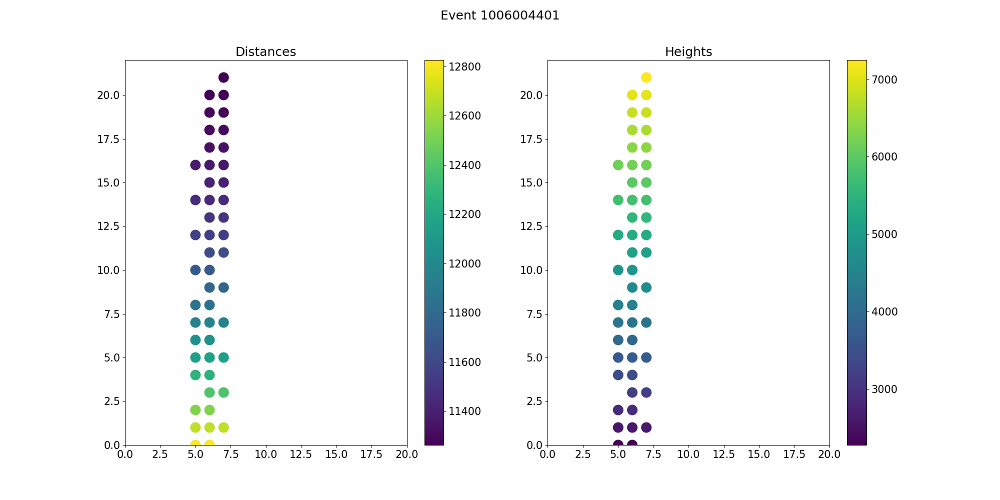

Event 1007104401


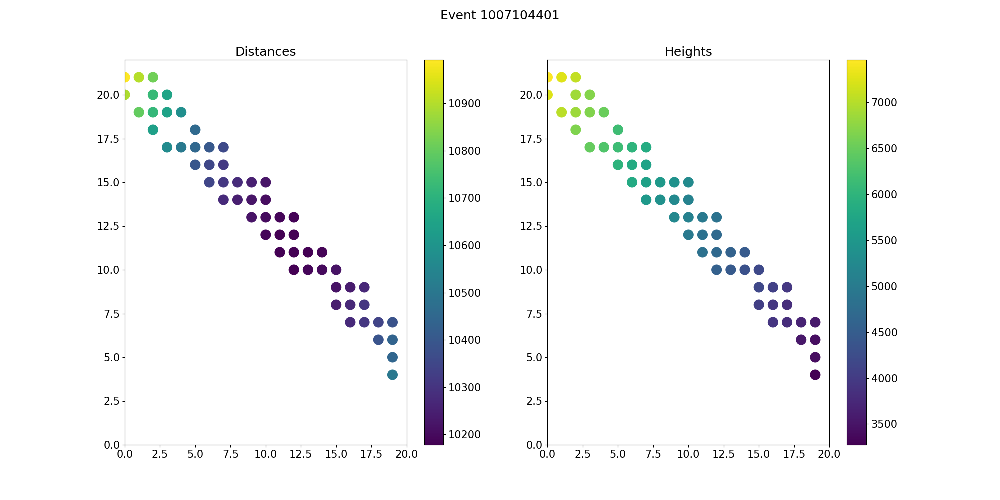

Event 1009504405


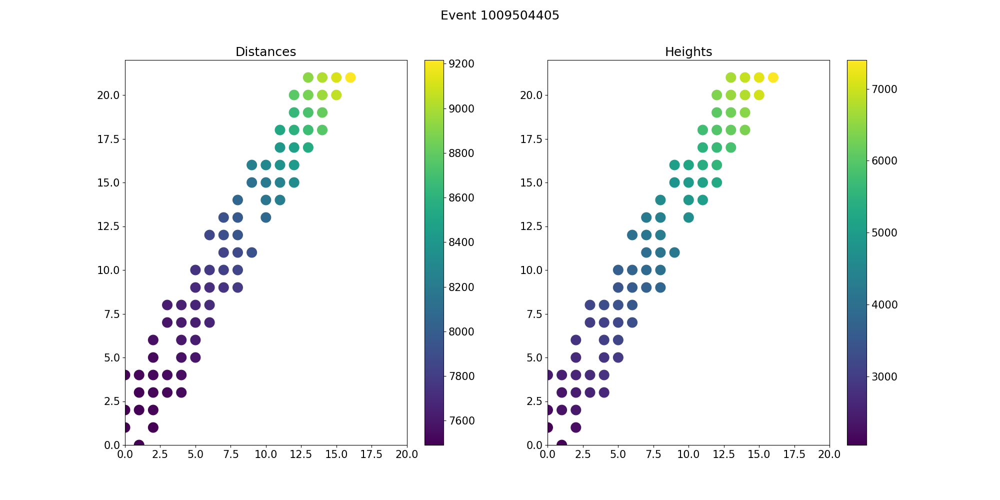

Event 1010904404


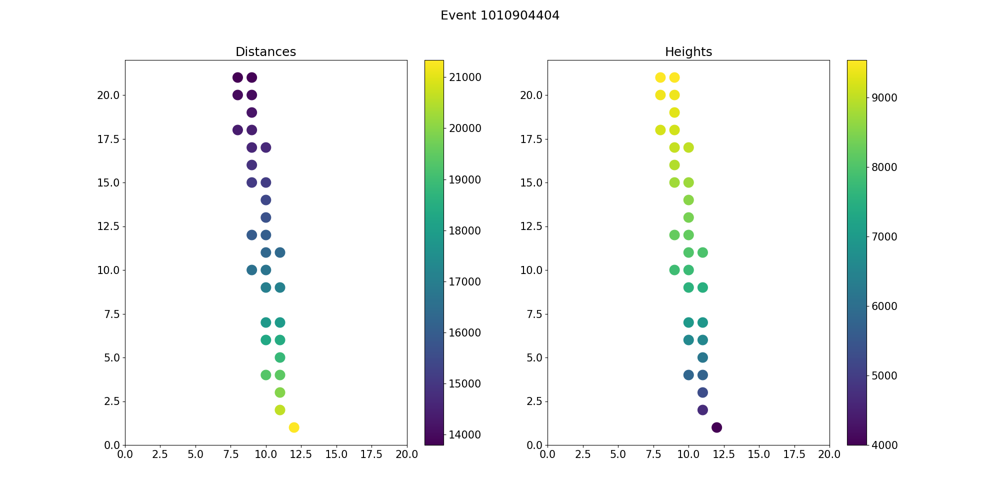

Event 1011604401


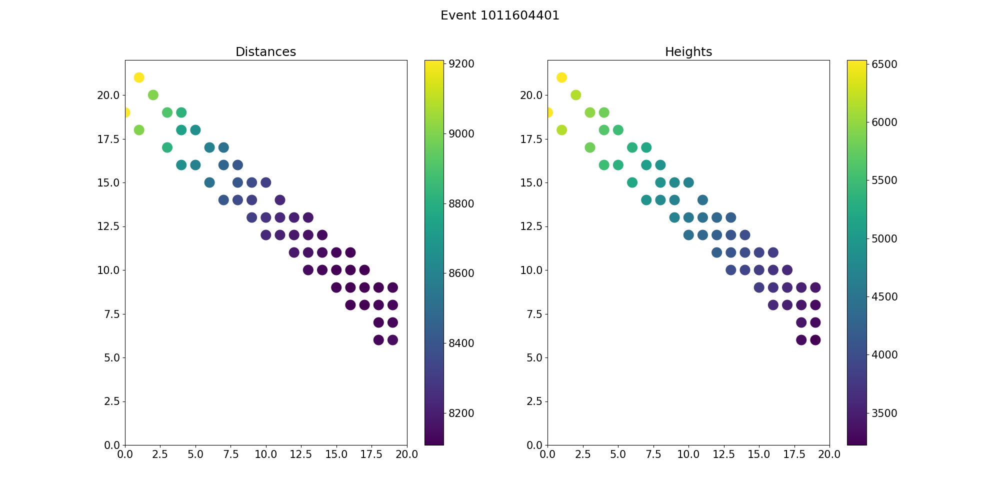

Event 1015804402


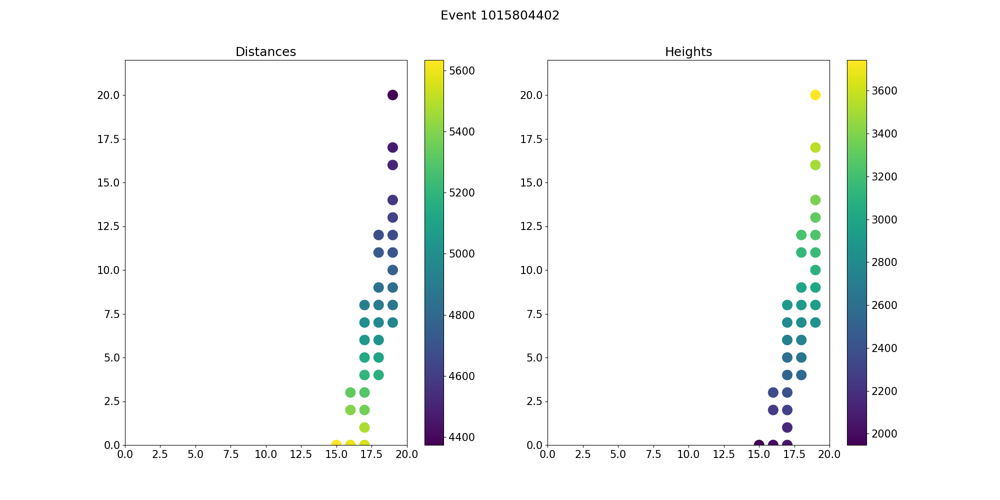

Event 1005604401


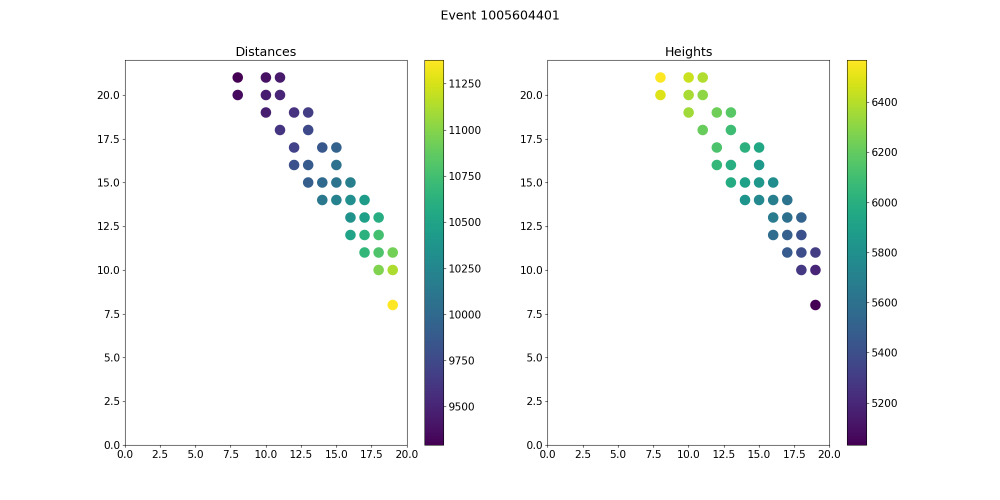

Event 1024004401


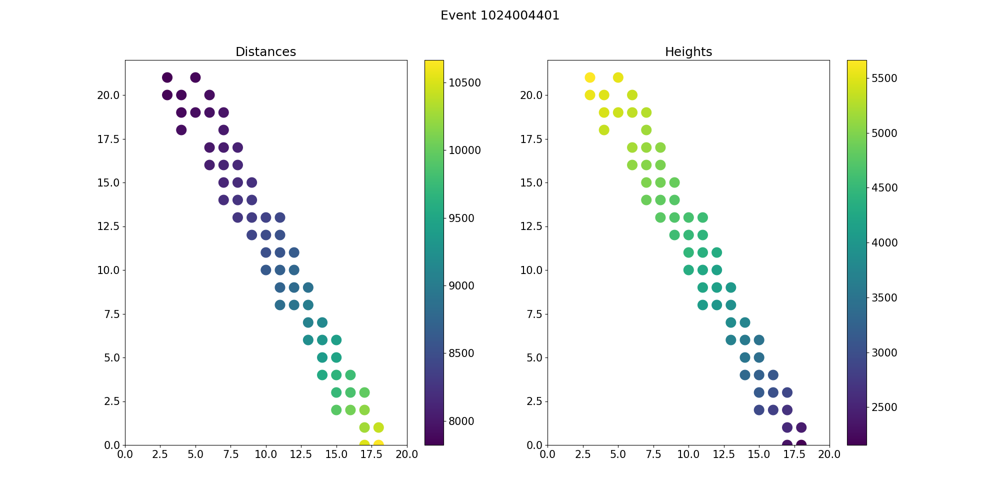

Event 1031604404


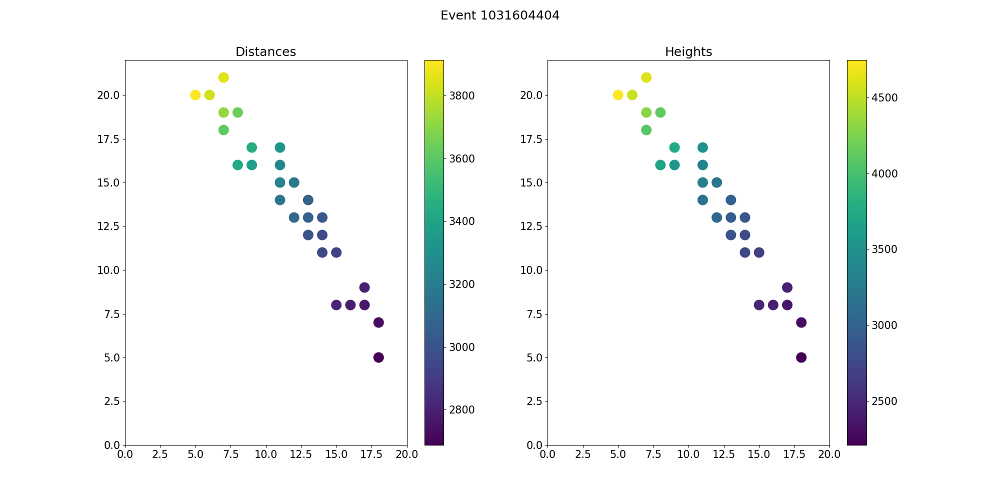

Event 1000001122


/tmp/ipykernel_26570/3176424901.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=[20, 10])


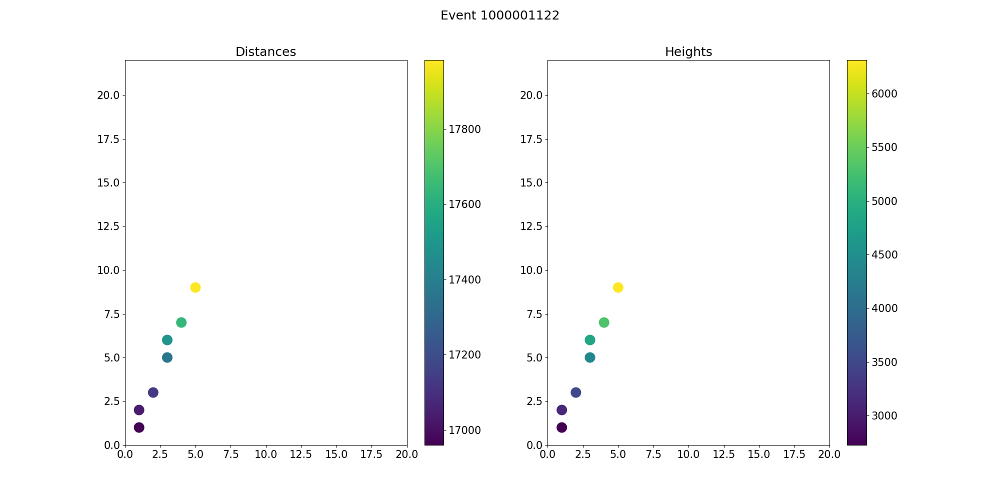

Event 1121304405


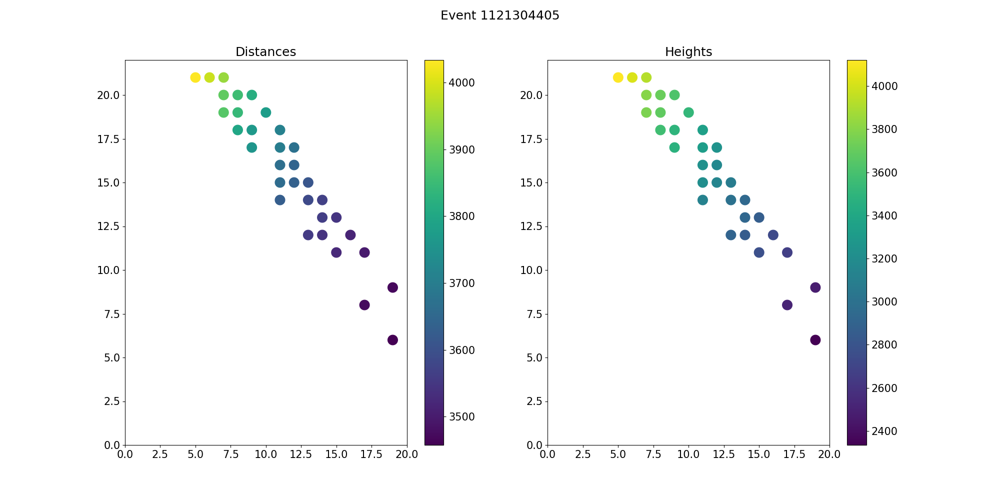

Event 1002504403


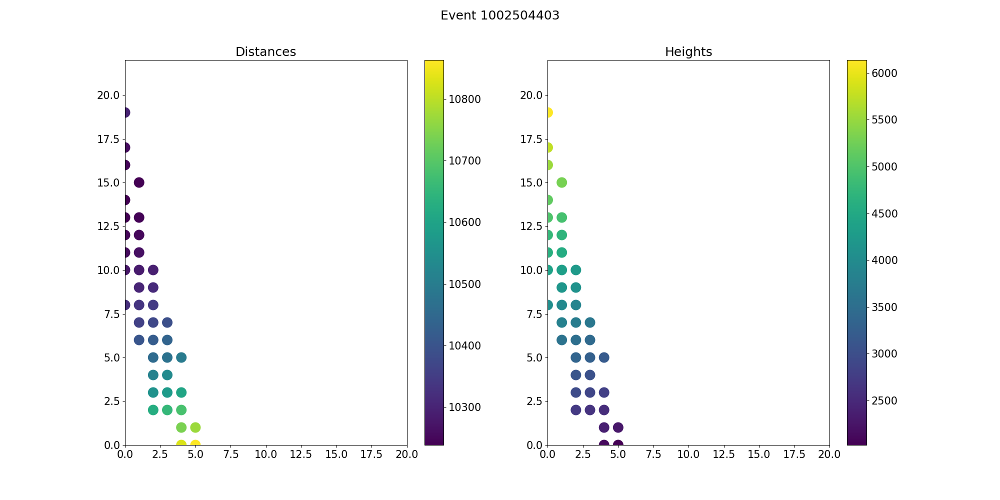

Event 1000001123


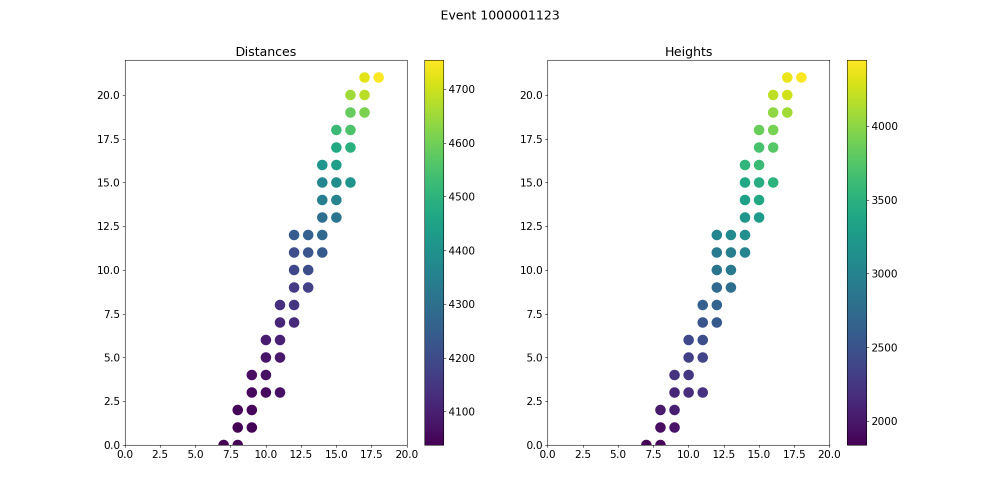

Event 1000001127


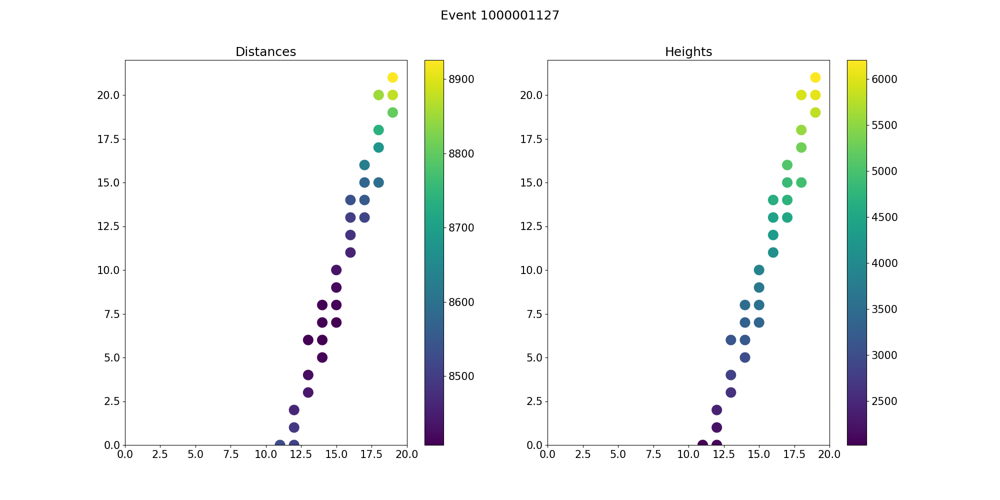

Event 1000201104


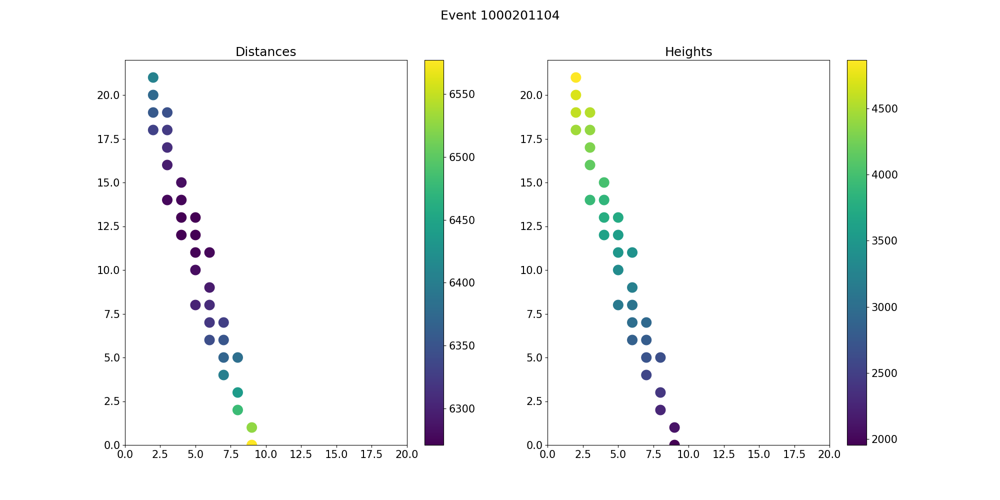

Event 1000501114


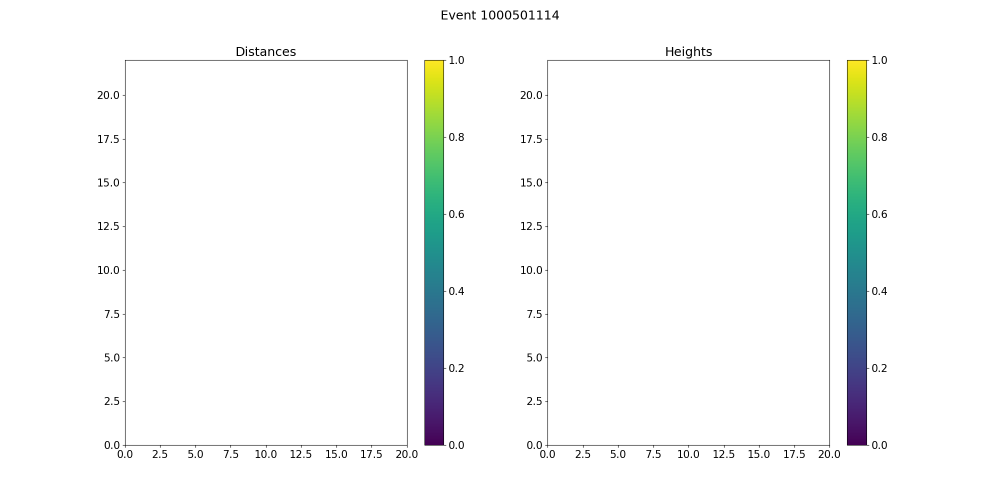

Event 1000501117


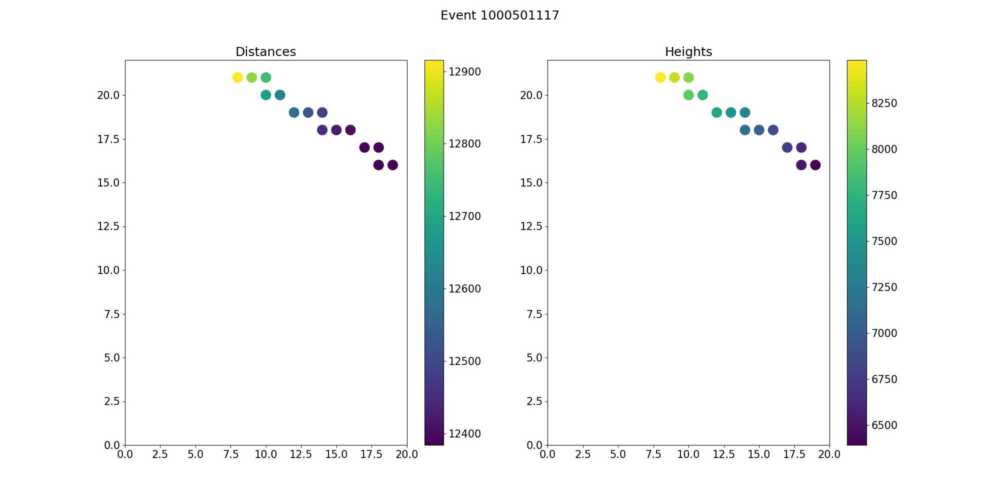

Event 1000601124


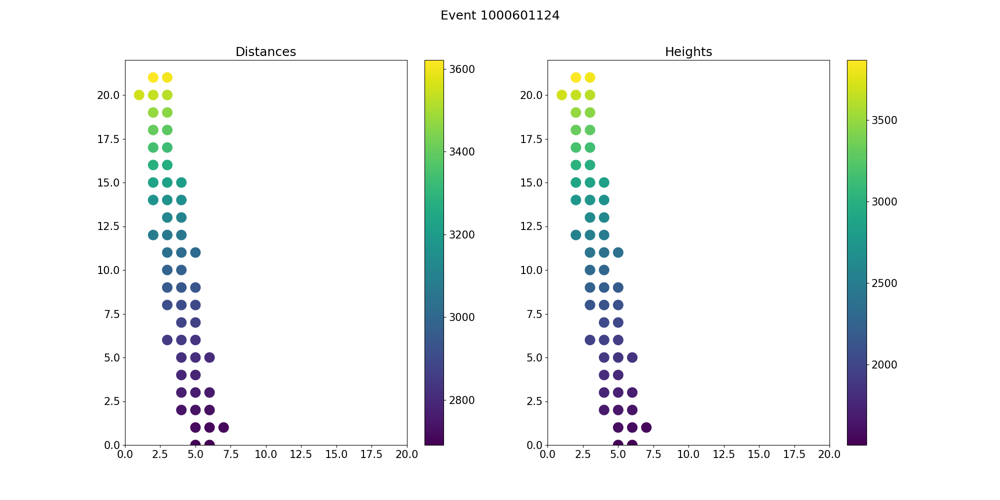

Event 1000304402


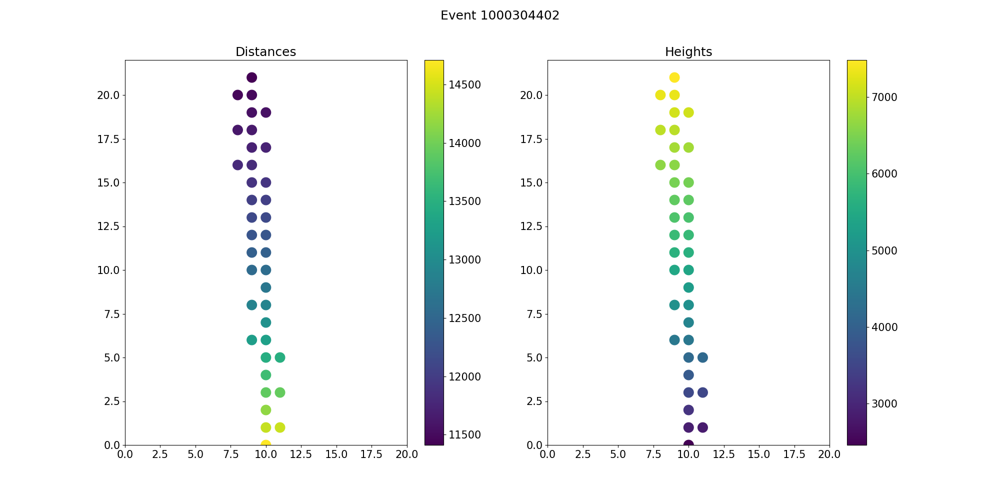

Event 1000404403


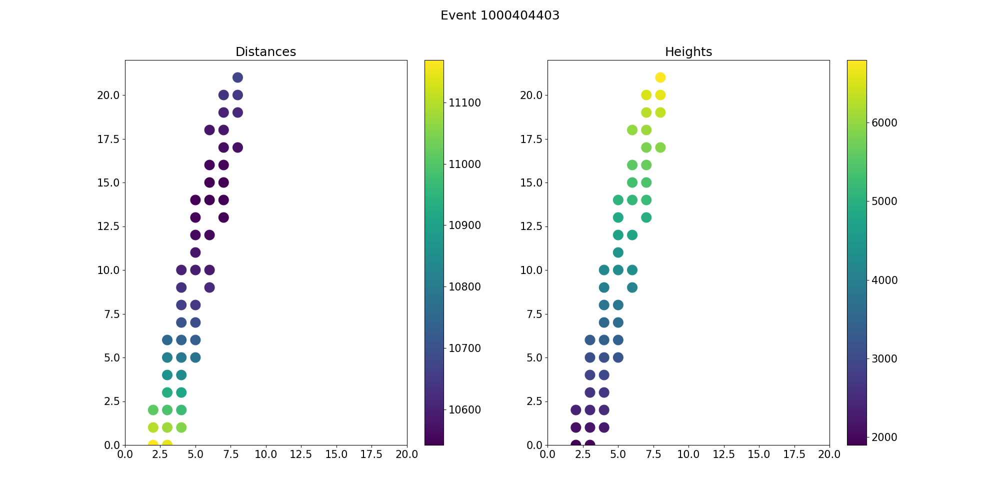

Event 1000501424


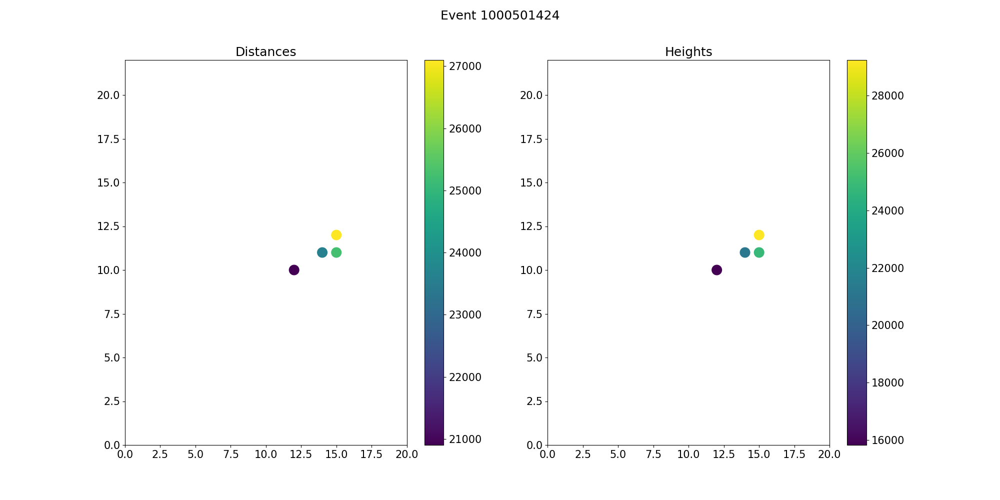

Event 1000001401


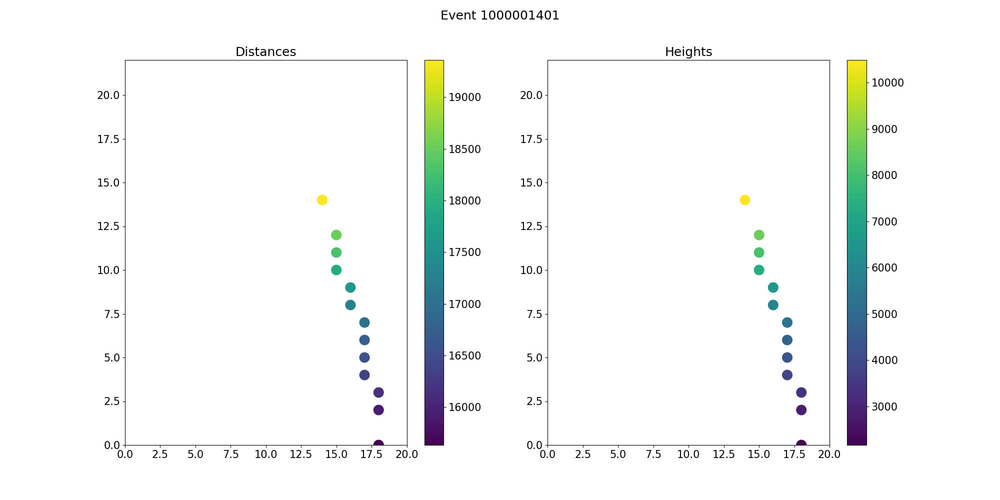

Event 1000001403


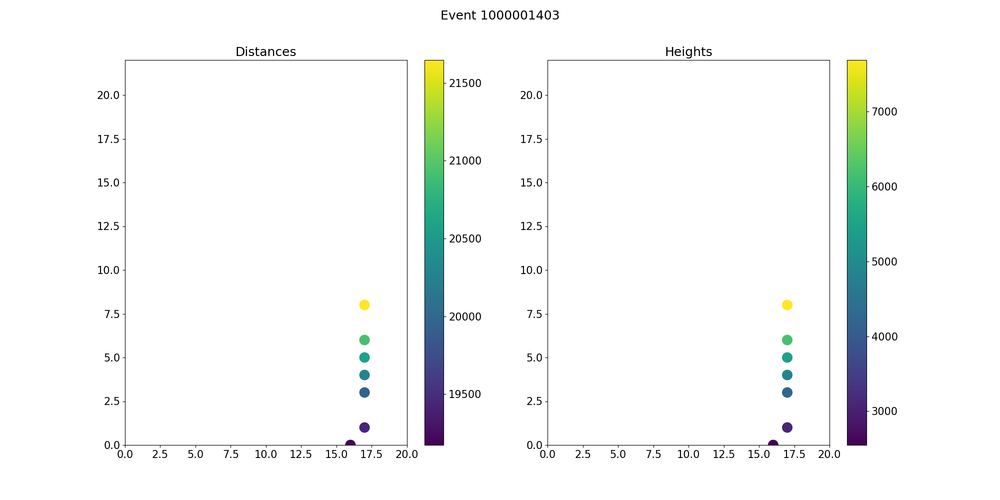

Event 1000001405


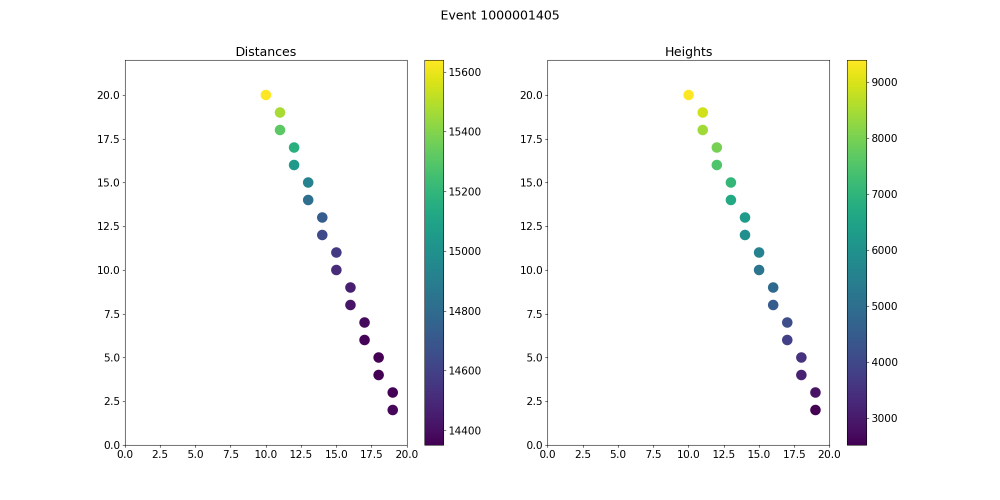

Event 1000001417


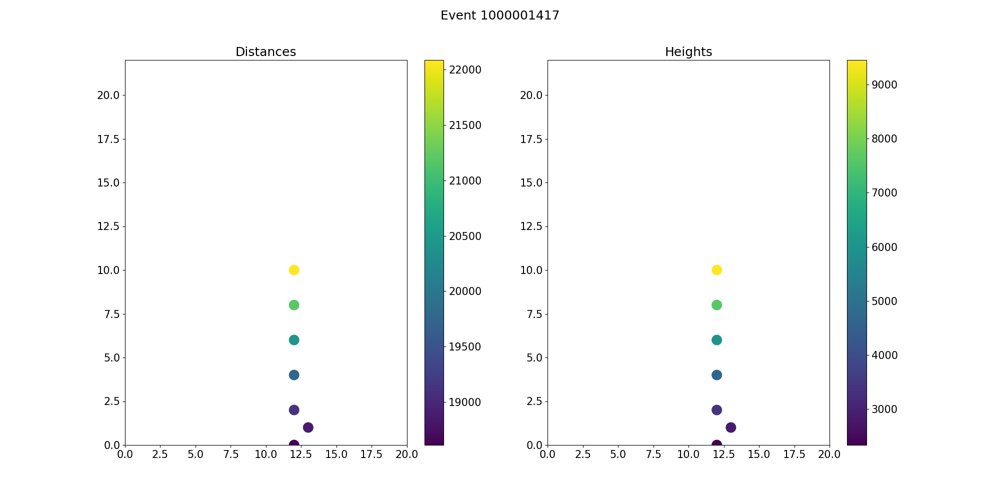

Event 1000001427


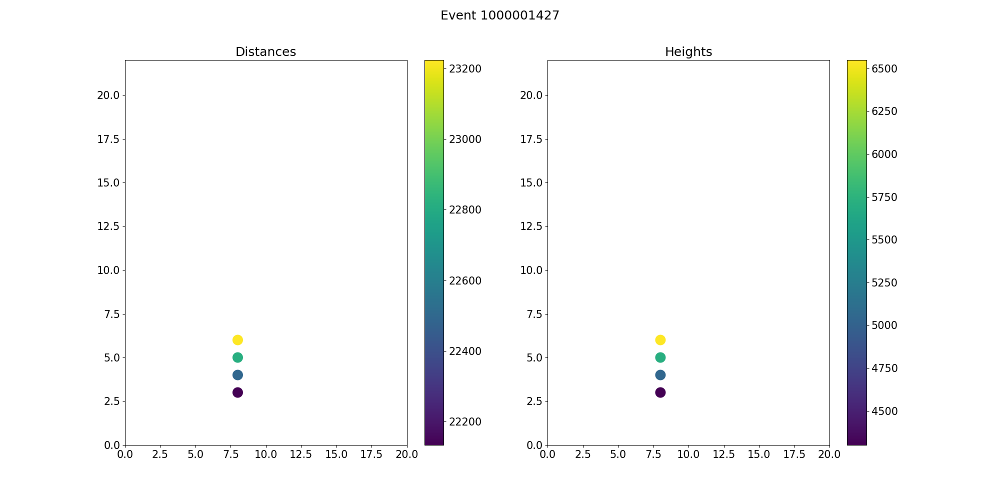

Event 1000101408


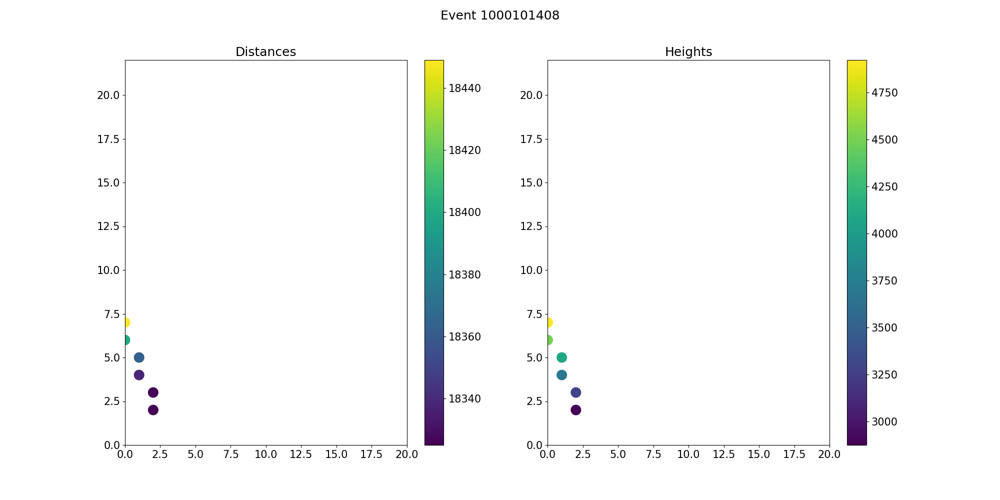

Event 1000101417


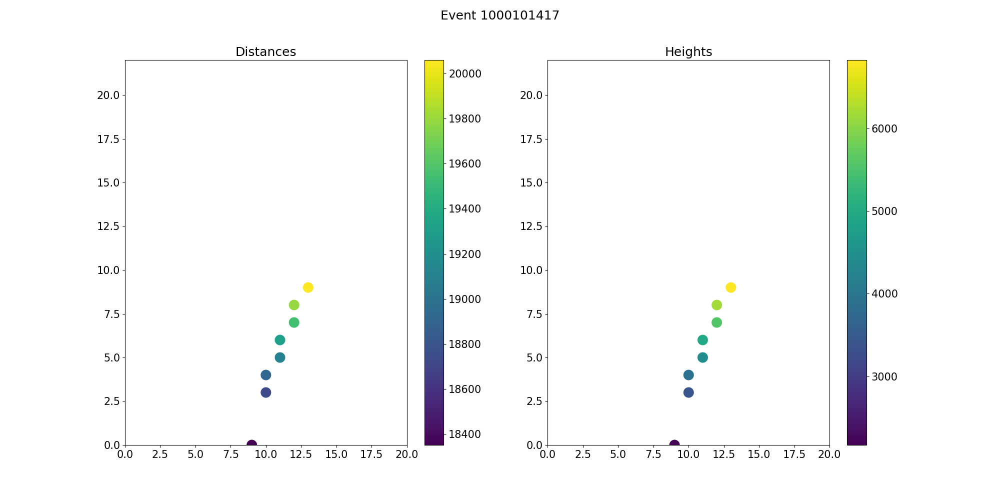

Event 1000401404


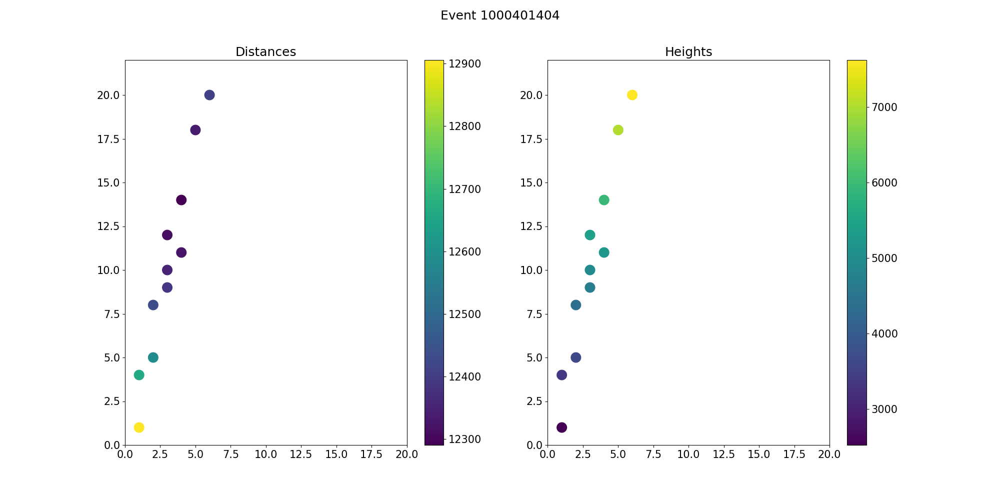

Event 1000501405


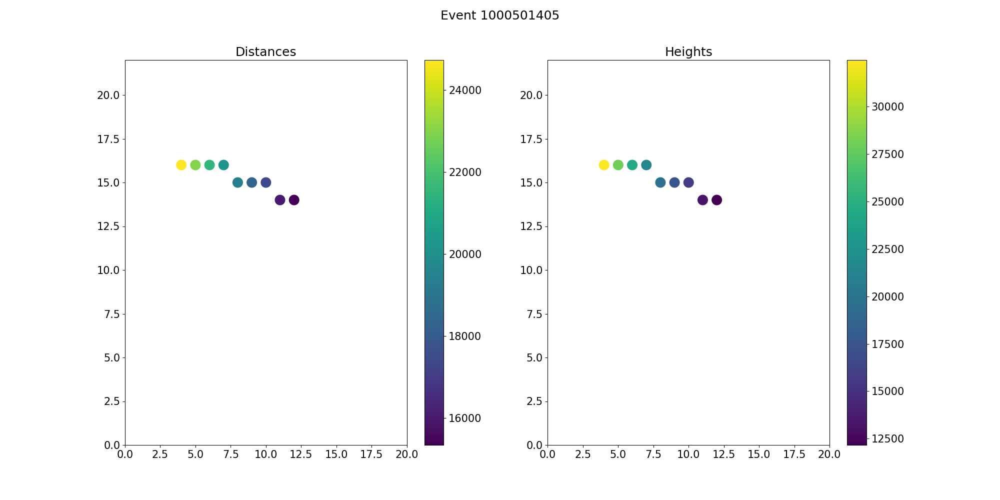

In [26]:
for i,(OneGraph,EventId) in enumerate(zip(GraphData,IDsList)):
    
    print(f'Event {EventId}')
    Traces    = OneGraph[0]
    Distances = OneGraph[1]
    Heights   = OneGraph[2]
    Xs        = OneGraph[3]
    Ys        = OneGraph[4]
    Pstart    = OneGraph[5]

    Distances_U = torch.sqrt(10**(Distances+5.2393))-1
    Heights_U   = 10**(Heights*5)
    fig, ax = plt.subplots(1, 2, figsize=[20, 10])
    scatter1 = ax[0].scatter(Xs, Ys, c=Distances_U, s=200)
    ax[0].set_title('Distances')
    ax[0].set_ylim(0, 22)
    ax[0].set_xlim(0, 20)
    cbar1 = plt.colorbar(scatter1, ax=ax[0])

    scatter2 = ax[1].scatter(Xs, Ys, c=Heights_U, s=200)
    ax[1].set_title('Heights')
    ax[1].set_ylim(0, 22)
    ax[1].set_xlim(0, 20)
    cbar2 = plt.colorbar(scatter2, ax=ax[1])
    # add event number into the whole plot title
    fig.suptitle(f'Event {EventId}')
    plt.show()
    # break


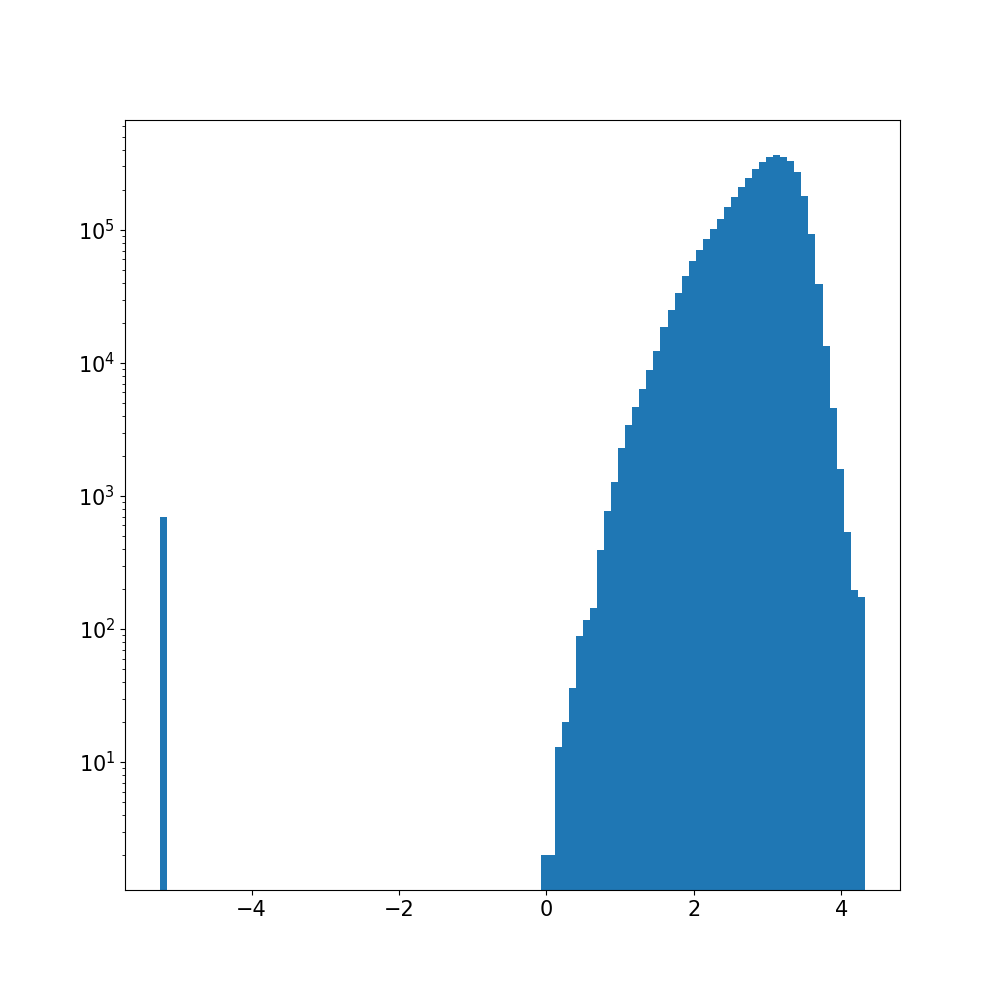

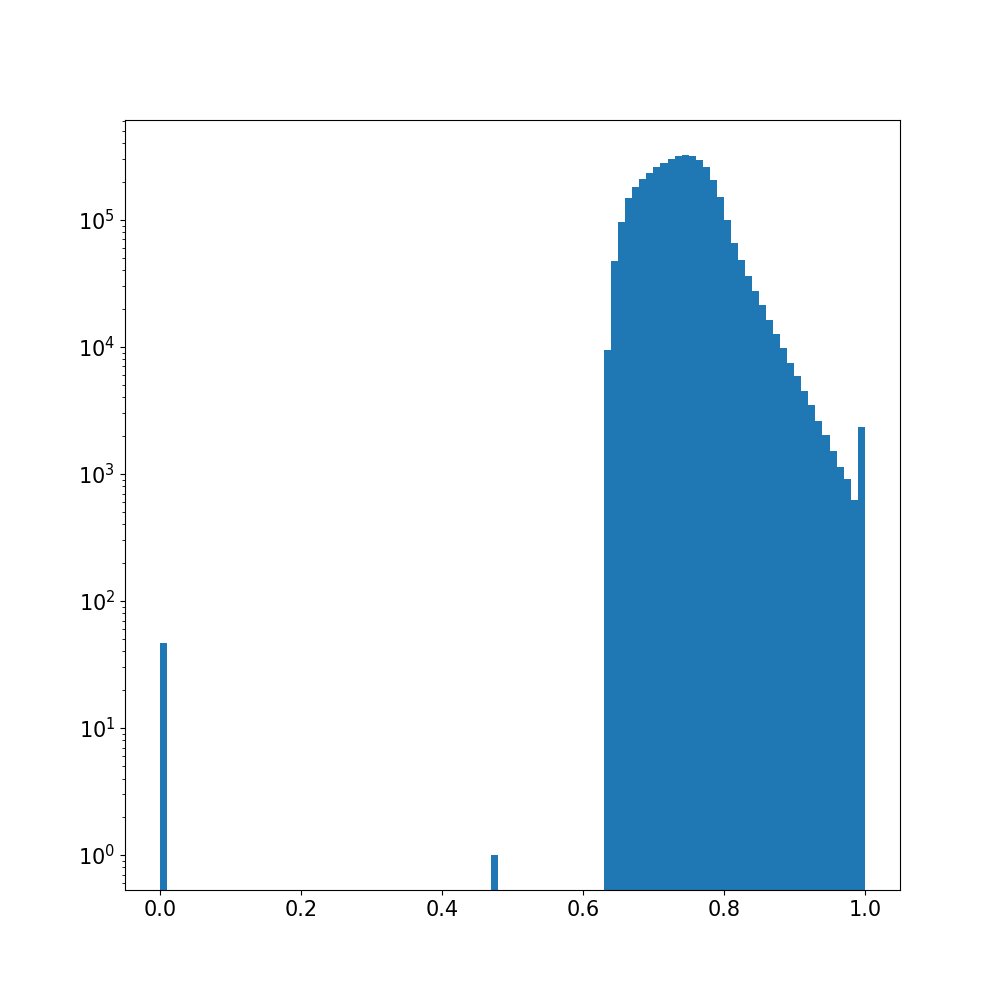

In [50]:
# Normalisations

Distances = torch.cat(list(map(lambda x: x[1],GraphData)))
Heights   = torch.cat(list(map(lambda x: x[2],GraphData)))

Distances = Distances.clamp(min=0,max = 60000)
Distances = torch.log10(Distances**2+1) -5.2393
plt.figure(figsize=[10,10])
plt.hist(Distances.numpy(),bins=100)
plt.yscale('log')
# plt.xscale('log')

# Heights = torch.log10(Heights+1)
Heights = Heights.clamp(min=1,max=1e5)
Heights = torch.log10(Heights)/5

plt.figure(figsize = [10,10])
plt.hist(Heights.numpy(),bins=100)
plt.yscale('log')



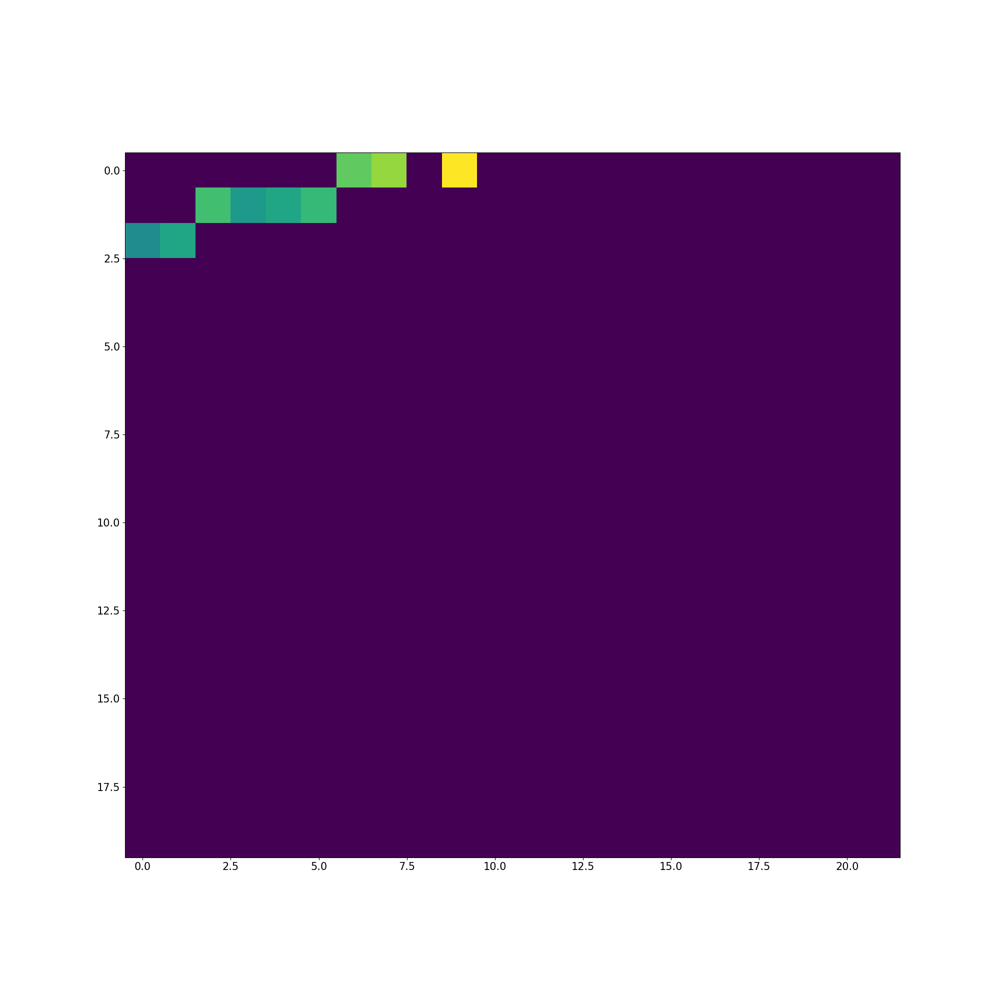

In [61]:
# Unpacking GraphData
device = torch.device('cpu')
Graph = [GraphData[i] for i in range(10)]

NEvents = len(Graph)
TracesMain      = torch.zeros(NEvents,100 ,20,22)
DistancesMain  = torch.zeros(NEvents,100 ,20,22)
HeightsMain    = torch.zeros(NEvents,100 ,20,22)
StartMain      = torch.zeros(NEvents,1   ,20,22)

Main_Traces    = torch.zeros(NEvents,1100,20,22)
Main_Distances = torch.zeros(NEvents,1100,20,22)
Main_Heights   = torch.zeros(NEvents,1100,20,22)
N_pixels_in_event = torch.tensor(list(map(len,map(lambda x : x[0], Graph)))).int()

EventIndices      = torch.repeat_interleave(torch.arange(NEvents),N_pixels_in_event).int()

Traces    = torch.cat(list(map(lambda x : x[0], Graph)))
Distances = torch.cat(list(map(lambda x : x[1], Graph)))
Heights   = torch.cat(list(map(lambda x : x[2], Graph)))
Xs        = torch.cat(list(map(lambda x : x[3], Graph)))
Ys        = torch.cat(list(map(lambda x : x[4], Graph)))
Pstart    = torch.cat(list(map(lambda x : x[5], Graph)))

TracesMain    [EventIndices,:,Xs,Ys] = Traces
StartMain     [EventIndices,0,Xs,Ys] = Pstart
DistancesMain [EventIndices,:,Xs,Ys] = Distances.repeat_interleave(100).reshape(Traces.shape)
HeightsMain   [EventIndices,:,Xs,Ys] = Heights  .repeat_interleave(100).reshape(Traces.shape)

DistancesMain = DistancesMain*(TracesMain>0).float()
HeightsMain   = HeightsMain  *(TracesMain>0).float()

indices = (torch.arange(100).reshape(1,-1,1,1)+StartMain).long()
Main_Traces   .scatter_(1,indices,TracesMain)
Main_Distances.scatter_(1,indices,DistancesMain)
Main_Heights  .scatter_(1,indices,HeightsMain)

Main_Traces    = Main_Traces   .unfold(1,10,10)
Main_Distances = Main_Distances.unfold(1,10,10)
Main_Heights   = Main_Heights  .unfold(1,10,10)

Main_Traces    = Main_Traces   .sum(-1)
Main_Distances = Main_Distances.max(-1)
Main_Heights   = Main_Heights  .max(-1)

Main_Traces    = Main_Traces          [:,:80,:,:].unsqueeze(1).to(device)
Main_Distances = Main_Distances.values[:,:80,:,:].unsqueeze(1).to(device)
Main_Heights   = Main_Heights.values  [:,:80,:,:].unsqueeze(1).to(device)

Main_Traces   [torch.isnan(Main_Traces)]    = -1
Main_Distances[torch.isnan(Main_Distances)] = -1
Main_Heights  [torch.isnan(Main_Heights)]   = -1



Main = torch.cat((Main_Traces,Main_Distances,Main_Heights),dim=1)


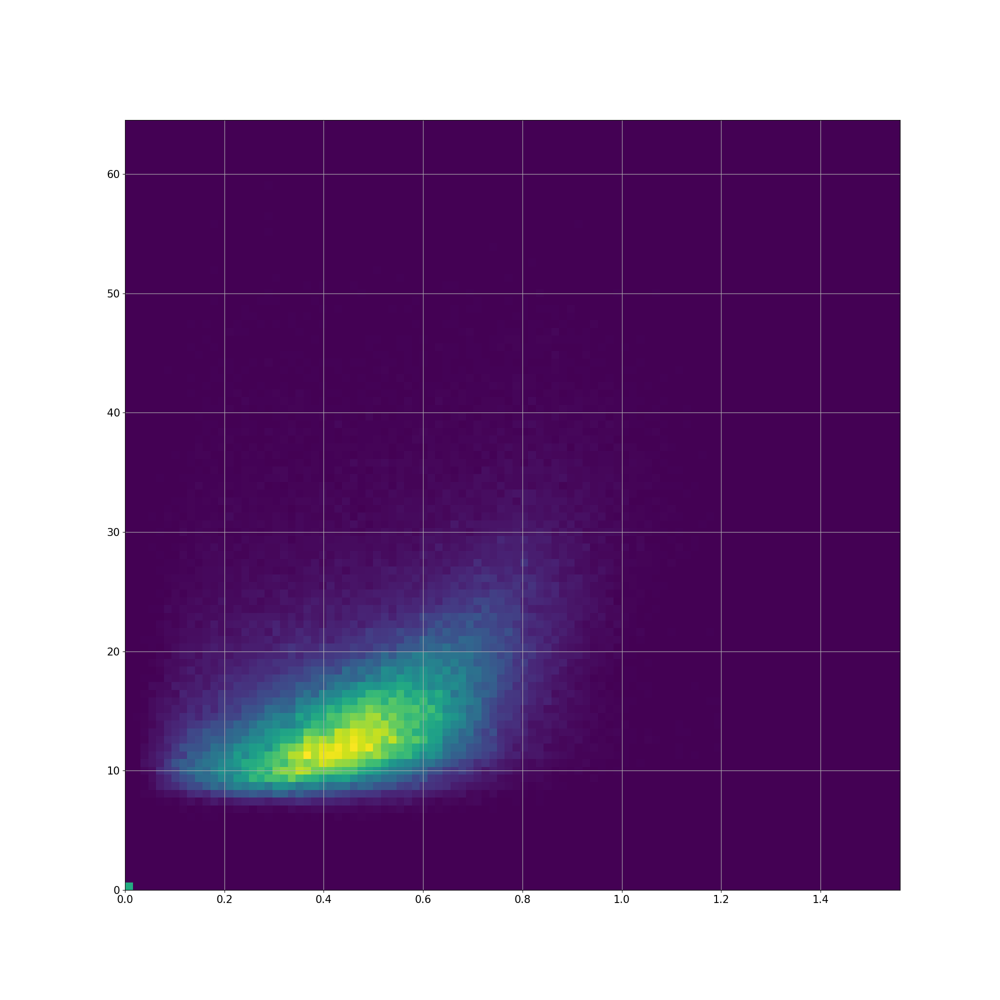

In [25]:
PulseDurations = []
for i in range(len(GraphData)):
    # print(f'    Processing Traces {i} / {len(GraphData)}',end='\r')
    Traces = GraphData[i][0].to(torch.float32)
    if Traces.numel()>0:
        # print(TraceLengths)
        TraceLengths = torch.sum(Traces>0,dim=1)
        PulseDurations.append(torch.mean(TraceLengths.float()).item())
    else: PulseDurations.append(0)

PulseDurations = torch.tensor(PulseDurations)
Traces = torch.cat(list(map(lambda x : x[0], GraphData)))
Xs     = torch.cat(list(map(lambda x : x[1], GraphData)))
Ys     = torch.cat(list(map(lambda x : x[2], GraphData)))
Pstart = torch.cat(list(map(lambda x : x[3], GraphData)))


CEDist = Gen_Truth[:,4].clone()

TraceLengths = torch.sum(Traces>0,dim=1)
TraceEnds    = Pstart + TraceLengths
plt.figure()
# plt.hist(TraceLengths.numpy(),bins=100)
# plt.hist(Pstart.numpy()   ,bins=100,label='PulseStart')
# plt.hist(TraceEnds.numpy(),bins=100,alpha=0.5,label='TraceEnds')
# plt.scatter(Pstart.numpy(),TraceEnds.numpy(),s=1)
# plt.hist2d(Pstart.numpy(),TraceEnds.numpy(),bins=100)
plt.hist2d(CEDist.numpy(),PulseDurations.numpy(),bins = 100)
# plt.yscale('log')
# plt.axvline(10,color='r')
plt.grid()
plt.show()

In [42]:
def Aux_Station(Dataset,ProcessingDataset):
    '''Basically just all station information'''

    IDsList = ()
    StationData = torch.zeros(len(Dataset),3)

    for i,Event in enumerate(Dataset):
        print(f'    Processing Aux {i} / {len(Dataset)}',end='\r')
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)

        StationData[i,0] = Event.get_value('Station_Time')
        StationData[i,1] = Event.get_value('Station_TotalSignal')
        StationData[i,2] = Event.get_value('Station_Distance')
    
    StationData[:,0] -= 300
    StationData[:,0] /= 700

    StationData[:,1] = torch.log10(StationData[:,1]+1)
    StationData[:,1] /= 4

    StationData[:,2] /= 30000


    if ProcessingDataset is None:
        return StationData
    ProcessingDataset._Aux = StationData
    if ProcessingDataset._EventIds is None:
        ProcessingDataset._EventIds = IDsList
    else:
        assert ProcessingDataset._EventIds == IDsList, 'EventIDs do not match'

AuxData = Aux_Station(Run010,None)

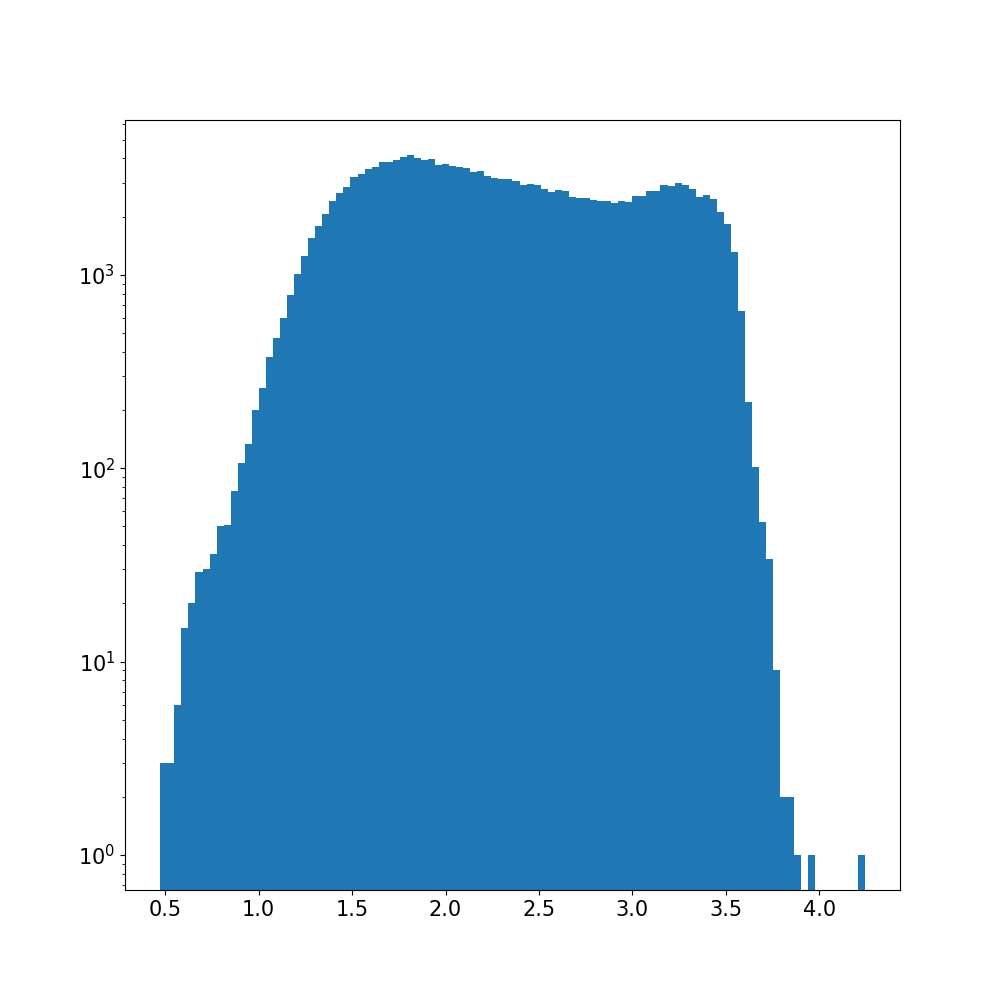

In [51]:
# Time = AuxData[:,0].clone()
# TotS = AuxData[:,1].clone()
# Dist = AuxData[:,2].clone()



# plt.figure(figsize=[10,10]) 
# # plt.hist((Time.numpy()),bins=100)
# plt.hist((TotS.numpy()*4),bins=100)
# # plt.hist((Dist.numpy()),bins=100)
# plt.yscale('log')
# plt.show()

In [6]:
# def Meta_Primary_Eye_Tel(Dataset,ProcessingDataset):
#     '''Just the primary eye and telescope'''
#     IDsList = ()
#     MetaData = torch.zeros(len(Dataset),3)

#     for i,Event in enumerate(Dataset):
#         print(f'    Processing Meta {i} / {len(Dataset)}',end='\r')
#         ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
#         IDsList += (ID,)
#         EyeID = Event.get_pixel_values('EyeID'  )
#         TelID = Event.get_pixel_values('TelID'  )
#         if torch.sum(EyeID != 5) == 0 or torch.sum(TelID<7) == 0:
#             MetaData[i,1] = 5
#         else:
            
#             SelectedTelID = torch.mode(TelID[(TelID<7)*(EyeID!=5)]).values.item()
#             SelectedEyeID = torch.mode(EyeID[(TelID<7)*(EyeID!=5)]).values.item()



#         MetaData[i,0] = Event.get_value('Primary')
#         MetaData[i,1] = SelectedEyeID
#         MetaData[i,2] = SelectedTelID

    
    
#     if ProcessingDataset is None:
#         return MetaData
#     ProcessingDataset._Meta = MetaData
#     if ProcessingDataset._EventIds is None:
#         ProcessingDataset._EventIds = IDsList
#     else:
#         assert ProcessingDataset._EventIds == IDsList, 'EventIDs do not match'

# MetaData = Meta_Primary_Eye_Tel(Run010,None)

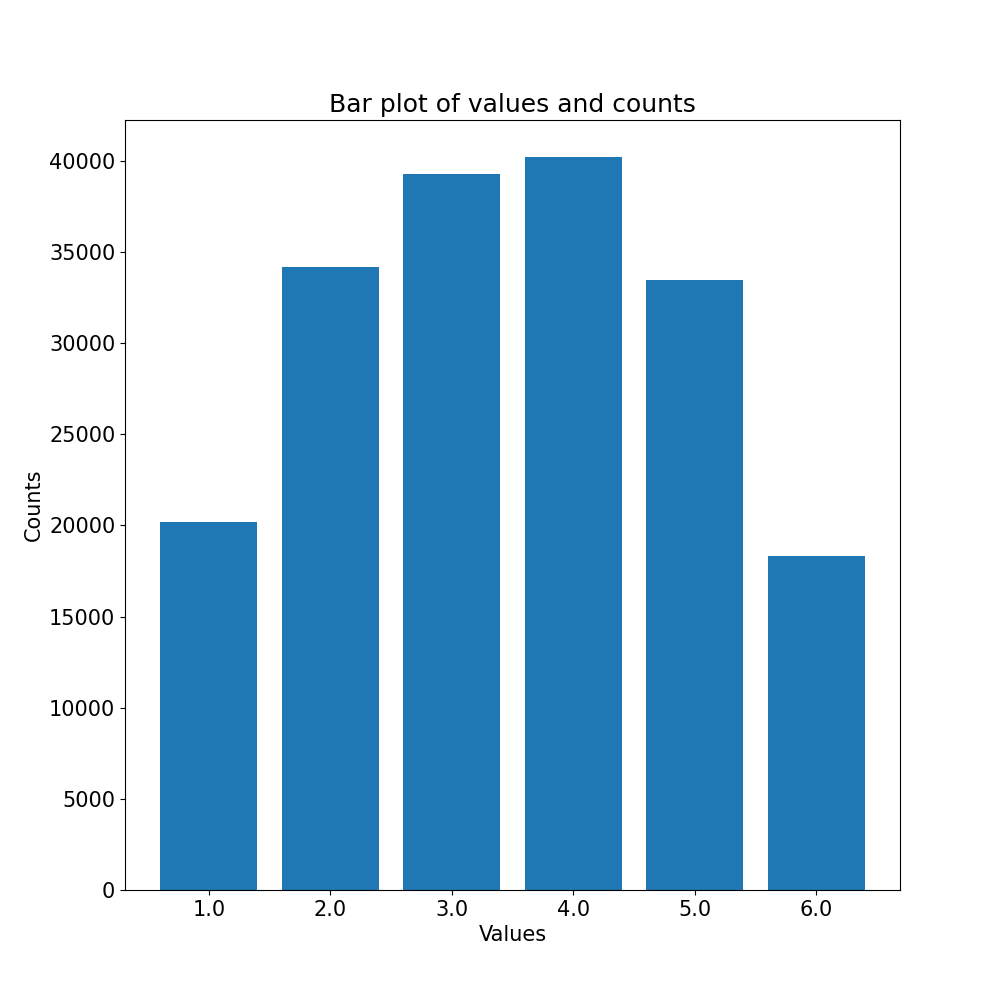

In [12]:
# values, counts = torch.unique(MetaData[:,2], return_counts=True)

# plt.figure(figsize=[10, 10])
# plt.bar(range(len(values)), counts.numpy())

# # Set x-ticks
# plt.xticks(range(len(values)), values.numpy())

# plt.xlabel('Values')
# plt.ylabel('Counts')
# plt.title('Bar plot of values and counts')
# plt.show()

# The Following is for the Graph Networks

In [6]:
# # Just Plotting First

# Event = Dataset.get_event_by_index(0)
# ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
# print(ID)


# X = Event.get_pixel_values('Phi')
# Y = Event.get_pixel_values('Theta')
# S = Event.get_pixel_values('Charge')
# C = Event.get_pixel_values('PulseCentroid')

# S = torch.log10(S+1)*15

# # plt.subplots(1,1,figsize=[10,10])
# # plt.scatter(X,Y,s=S,c=C)
# # plt.grid()

# # Actual Event Data


# Phi     = Event.get_pixel_values('Phi')
# Theta   = Event.get_pixel_values('Theta')
# TOffset = Event.get_pixel_values('TimeOffset')
# PulseStart = Event.get_pixel_values('PulseStart')

# HEAT = (Event.get_pixel_values('TelID') == 7)+(Event.get_pixel_values('TelID') == 8)+(Event.get_pixel_values('TelID') == 9)+(Event.get_pixel_values('EyeID') == 5)
# PulseStart[HEAT]= 0.5 * PulseStart[HEAT]



# Signals = Event.get_trace_values()
# Mask = Signals>0
# Signals = torch.log10(Signals+1)
# Times   = torch.arange(100).repeat(len(Signals),1)+TOffset.unsqueeze(1)+PulseStart.unsqueeze(1)

# Xvals =  Phi  .repeat_interleave(100).view(-1, 100)
# Yvals = -Theta.repeat_interleave(100).view(-1, 100)+90


# # now make 3d scatter plot of the event, use time as the z axis and color the points by the signal value

# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(Xvals[Mask], Yvals[Mask], Times[Mask], c=Signals[Mask], cmap='viridis')
# ax.set_xlabel('Azimuth')
# ax.set_ylabel('Elevation')
# ax.set_zlabel('Time Slot')
# # invert x axist
# ax.invert_xaxis()
# plt.show()




In [7]:
# # UnReBinned code

# def Graph_Graph_All(Dataset,ProcessingDataset = None):
#     # NeighboursLevel = 1
#     # 1 =     connect all nodes in the same time slot
#     # 2 = 1 + connect to  their own         next and previous time slot
#     # 3 = 2 + connect to  adjacent pixel's  next and previous time slot

    
#     # Setup some required things
#     def Get_Ang_Diff(PhiA,ThetaA,PhiB,ThetaB):
#         return torch.acos(torch.cos(ThetaA)*torch.cos(ThetaB) + torch.sin(ThetaA)*torch.sin(ThetaB)*torch.cos(PhiA-PhiB))

#     PhiOffsets = {1:-75/180*torch.pi,2:-45/180*torch.pi,3:-15/180*torch.pi,4:15/180*torch.pi,5:45/180*torch.pi,6:75/180*torch.pi}


#     IDsList = ()
#     Graph   = []
    
#     for i,Event in enumerate(Dataset):
#         print(f'Processing Graph {i+1}/{len(Dataset)}',end='\r')
#         ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        
#         IDsList += (ID,)

#         Phi        = Event.get_pixel_values('Phi'       )
#         Theta      = Event.get_pixel_values('Theta'     )
#         TOffset    = Event.get_pixel_values('TimeOffset')
#         PulseStart = Event.get_pixel_values('PulseStart')
#         PulseStop  = Event.get_pixel_values('PulseStop' )
#         TelID      = Event.get_pixel_values('TelID'     )
#         PixelID    = Event.get_pixel_values('PixelID'   )


#         HEAT = (TelID == 7)+(TelID == 8)+(TelID == 9)+(Event.get_pixel_values('EyeID') == 5)
#         if not HEAT.all():
#             PulseStart[HEAT]= 0.5 * PulseStart[HEAT]
#             PulseStop[HEAT] = 0.5 * PulseStop[HEAT]

#             PulseDuration = PulseStop - PulseStart
#             HottestTel = TelID[~HEAT].mode().values.item()
            
#             Signals = Event.get_trace_values()
#             indices = torch.arange(100).expand(Signals.shape[0], -1)
#             Mask = (indices < PulseDuration.unsqueeze(1)).flatten()
#             # Mask = (indices < 1).flatten()            # For testing Get_Ang_Diff
            
#             Signals = Signals.flatten()
#             Times   = (torch.arange(100).repeat(len(Phi),1)+TOffset.unsqueeze(1)+PulseStart.unsqueeze(1)).flatten().round()
#             Xvals   = Phi    .repeat_interleave(100)/180*torch.pi - PhiOffsets[HottestTel] - np.pi/2
#             Yvals   = Theta  .repeat_interleave(100)/180*torch.pi
#             PixelID = PixelID.repeat_interleave(100)

#             # Normalisation
#             Signals = torch.log10(torch.clamp(Signals+1,min=1))
#             # Xvals   = Xvals # Consider already normalised
#             Yvals   = torch.pi/2 - Yvals
#             # Times   = Times # Consider already normalised

#             NodeValues = torch.stack([Xvals,Yvals,Times,Signals,PixelID],dim=1)
#             NodeValues = NodeValues[Mask]


#             # Vectorised approach
#             time_diffs = torch.abs(NodeValues[:,2].unsqueeze(1) - NodeValues[:,2].unsqueeze(0))
#             pix_diffs  = torch.abs(NodeValues[:,4].unsqueeze(1) - NodeValues[:,4].unsqueeze(0))
#             ang_diffs  = torch.abs(Get_Ang_Diff(NodeValues[:,0].unsqueeze(1),NodeValues[:,1].unsqueeze(1),NodeValues[:,0].unsqueeze(0),NodeValues[:,1].unsqueeze(0)))
            
#             NB_L1 = (time_diffs == 0) & (pix_diffs > 0)
#             NB_L2 = (time_diffs == 1) & (pix_diffs == 0)
#             NB_L3 = (time_diffs == 1) & (ang_diffs < 2/180*torch.pi) & (pix_diffs > 0)

#             NB_L1_I = torch.nonzero(NB_L1)
#             NB_L2_I = torch.nonzero(NB_L2)
#             NB_L3_I = torch.nonzero(NB_L3)
#             print(NB_L1_I.shape)
#             print(NB_L2_I.shape)
#             print(NB_L3_I.shape)
#             Edges     = torch.cat([NB_L1_I,NB_L2_I,NB_L3_I])
#             NBH_level = torch.cat([torch.ones(len(NB_L1_I)),2*torch.ones(len(NB_L2_I)),3*torch.ones(len(NB_L3_I))])
#             edge_values = torch.stack([NBH_level,ang_diffs[NB_L1|NB_L2|NB_L3]],dim=1)
            

#             EventGraphData = [NodeValues,Edges,edge_values]
#             Graph.append(EventGraphData)
            
            
#         else:
#             NodeValues = torch.tensor([[0],[0],[0],[0],[0]])  
#             Edges = torch.tensor([[0,0]])
#             edge_values = torch.tensor([[0,0]])

#             EventGraphData = [NodeValues,Edges,edge_values]
#             Graph.append(EventGraphData)

#         # break
#     # Slap into Dataset
#     if ProcessingDataset is None:
#         return Graph
#     else:
#         ProcessingDataset._Graph = Graph
#         ProcessingDataset.GraphData = True
#         if ProcessingDataset._EventIds is None:
#             ProcessingDataset._EventIds = IDsList
#         else:
#             assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'


# Graph = Graph_Graph_All(Dataset)



In [7]:
# ProcDS = torch.load('/remote/tychodata/ftairli/work/Projects/ProfileReconstruction/Data/Geom_Graph_Dataset.pt')
# ProcDS.AssignIndices()

In [8]:
# ProcDS.State = 'Val'
# ProcDS.BatchSize = 1
# for i,(EvIDs, Graph, Aux,Truth,Rec) in enumerate(ProcDS):
#     if i == 2:
#         NodeVals = Graph[0][0]
#         Edges    = Graph[0][1]
#         EdgeVals = Graph[0][2]
        
#         # print(NodeVals)
#         # print(Edges)
#         # print(EdgeVals)
#         print()
#         print(NodeVals.shape)
#         print(Edges.shape)
#         print(EdgeVals.shape)

#         break
# # ProcDS._Graph

In [9]:
# # ReBinned code

# def Graph_Graph_All(Dataset,ProcessingDataset = None):
#     # NeighboursLevel = 1
#     # 1 =     connect all nodes in the same time slot
#     # 2 = 1 + connect to  their own         next and previous time slot
#     # 3 = 2 + connect to  adjacent pixel's  next and previous time slot

    
#     # Setup some required things
#     def Get_Ang_Diff(PhiA,ThetaA,PhiB,ThetaB):
#         return torch.acos(torch.cos(ThetaA)*torch.cos(ThetaB) + torch.sin(ThetaA)*torch.sin(ThetaB)*torch.cos(PhiA-PhiB))

#     PhiOffsets = {1:-75/180*torch.pi,2:-45/180*torch.pi,3:-15/180*torch.pi,4:15/180*torch.pi,5:45/180*torch.pi,6:75/180*torch.pi}


#     IDsList = ()
#     Graph   = []
#     TotalNValues = 0
#     TotalSkippedEvents = 0
#     for i,Event in enumerate(Dataset):
#         # AverageEdgeSize = np.sum(list(map(lambda x: len(x[1]),Graph)))/len(Graph)
#         # AverageEdgeSizeL3 = np.sum(list(map(lambda x: len(x[1][x[2][:,0]==3]),Graph)))/len(Graph)
#         AverageValues = TotalNValues/(i+1)
        
#         # print(f'Processing Graph {i+1}/{len(Dataset)}',end='\r')
#         # print(f'Processing Graph {i+1}/{len(Dataset)} with average edge number {AverageEdgeSize}',end='\r')
#         # print(f'Processing Graph {i+1}/{len(Dataset)} with average L3 edge number {AverageEdgeSizeL3}',end='\r')
#         # print(f'Processing Graph {i+1}/{len(Dataset)} with average values {AverageValues}',end='\r')
#         print(f'Processing Graph {i+1}/{len(Dataset)} with {100*TotalSkippedEvents/(i+1)}% skipped events',end='\r')
#         # print(f'Processing Graph {i+1}/{len(Dataset)}')

#         ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        
#         IDsList += (ID,)

#         Phi        = Event.get_pixel_values('Phi'       )
#         Theta      = Event.get_pixel_values('Theta'     )
#         TOffset    = Event.get_pixel_values('TimeOffset')
#         PulseStart = Event.get_pixel_values('PulseStart')
#         PulseStop  = Event.get_pixel_values('PulseStop' )
#         TelID      = Event.get_pixel_values('TelID'     )
#         PixelID    = Event.get_pixel_values('PixelID'   )


#         HEAT = (TelID == 7)+(TelID == 8)+(TelID == 9)+(Event.get_pixel_values('EyeID') == 5)
#         PulseStart[HEAT]= 0.5 * PulseStart[HEAT]
#         PulseStop[HEAT] = 0.5 * PulseStop[HEAT]

#         PulseDuration = PulseStop - PulseStart
#         NNodes = PulseDuration.int().sum()//2
#         # print(f'Number of nodes: {NNodes.item()}')
#         if (not HEAT.all()) & (NNodes <900):
#             HottestTel = TelID[~HEAT].mode().values.item()
            
#             Signals = Event.get_trace_values()

#             # Sum up adjacent time bins
            
#             Signals = Signals[:,::2] + Signals[:,1::2]
            
#             PulseDuration = PulseDuration/2
#             indices = torch.arange(50).expand(Signals.shape[0], -1)
#             Mask = (indices < PulseDuration.unsqueeze(1)).flatten()
            
#             Signals = Signals.flatten()
#             Times   = (torch.arange(50).repeat(len(Phi),1)*2+TOffset.unsqueeze(1)+PulseStart.unsqueeze(1)).flatten().round() # *2 to keep bins in sync
#             Xvals   = Phi    .repeat_interleave(50)/180*torch.pi - PhiOffsets[HottestTel] - np.pi/2
#             Yvals   = Theta  .repeat_interleave(50)/180*torch.pi
#             PixelID = PixelID.repeat_interleave(50)

#             # Normalisation
#             Signals = torch.log10(torch.clamp(Signals+1,min=1))
#             # Xvals   = Xvals # Consider already normalised
#             Yvals   = torch.pi/2 - Yvals
#             # Times   = Times # Consider already normalised

#             NodeValues = torch.stack([Xvals,Yvals,Times,Signals,PixelID],dim=1)
#             NodeValues = NodeValues[Mask]


#             # Vectorised approach
#             time_diffs = torch.abs(NodeValues[:,2].unsqueeze(1) - NodeValues[:,2].unsqueeze(0))
#             pix_diffs  = torch.abs(NodeValues[:,4].unsqueeze(1) - NodeValues[:,4].unsqueeze(0))
#             ang_diffs  = torch.abs(Get_Ang_Diff(NodeValues[:,0].unsqueeze(1),NodeValues[:,1].unsqueeze(1),NodeValues[:,0].unsqueeze(0),NodeValues[:,1].unsqueeze(0)))
            
#             NB_L1 = (time_diffs == 0) & (pix_diffs > 0)
#             NB_L2 = (time_diffs == 2) & (pix_diffs == 0) # 2 is now adjacent time bins cause of the rebinning
#             NB_L3 = (time_diffs == 2) & (ang_diffs < 2/180*torch.pi) & (pix_diffs > 0)

#             NB_L1_I = torch.nonzero(NB_L1)
#             NB_L2_I = torch.nonzero(NB_L2)
#             NB_L3_I = torch.nonzero(NB_L3)
#             # print(NB_L1_I.shape)
#             # print(NB_L2_I.shape)
#             # print(NB_L3_I.shape)
#             Edges     = torch.cat([NB_L1_I,NB_L2_I,NB_L3_I])
#             NBH_level = torch.cat([torch.ones(len(NB_L1_I)),2*torch.ones(len(NB_L2_I)),3*torch.ones(len(NB_L3_I))])
#             edge_values = torch.stack([NBH_level,ang_diffs[NB_L1|NB_L2|NB_L3]],dim=1)
            
#             EventGraphData = [NodeValues,Edges,edge_values]
#             Graph.append(EventGraphData)
            
#             # increase total number of values
#             TotalNValues += len(NodeValues)*5 + len(Edges)*2 + len(edge_values)*2
            
#         else:
#             NodeValues = torch.tensor([[0],[0],[0],[0],[0]])  
#             Edges = torch.tensor([[0,0]])
#             edge_values = torch.tensor([[0,0]])

#             EventGraphData = [NodeValues,Edges,edge_values]
#             Graph.append(EventGraphData)
#             TotalSkippedEvents += 1
#     # Slap into Dataset
#     if ProcessingDataset is None:
#         return Graph
#     else:
#         ProcessingDataset._Graph = Graph
#         ProcessingDataset.GraphData = True
#         if ProcessingDataset._EventIds is None:
#             ProcessingDataset._EventIds = IDsList
#         else:
#             assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'


# Graph = Graph_Graph_All(Run010)



In [10]:
# EvValues = []
# for i,ev in enumerate(Run010):
#     print(f'Processing Event {i+1}/{len(Run010)}',end='\r')
#     PulseDuration = ev.get_pixel_values('PulseStop') - ev.get_pixel_values('PulseStart')
#     PulseDuration = PulseDuration/2
#     PulseDuration = PulseDuration.int()
#     EvValues.append(PulseDuration.sum().item())


In [11]:
# EvValues = np.array(EvValues)
# plt.figure(figsize = [10,10])
# plt.hist(EvValues,bins=100)
# print('99th percentile',np.percentile(EvValues,99))
# plt.axvline(np.percentile(EvValues,99),color='r')
# print('95th percentile',np.percentile(EvValues,95))
# plt.axvline(np.percentile(EvValues,95),color='r')

# plt.yscale('log')

# plt.show()

In [13]:
# Looped Code to make edges
# # # Now make edge list by loop , sanity check
#             Edges    = []
#             NBH_level = []

#             for i in range(len(NodeValues)):
#                 for j in range(i+1,len(NodeValues)):
#                 # for j in range(len(NodeValues)):
#                     if (NodeValues[i,2] == NodeValues[j,2]) and (NodeValues[i,4] != NodeValues[j,4]): # same time slot and different pixel 
#                         Edges.append([i,j])
#                         Edges.append([j,i])
#                         NBH_level.append(1)
#                         NBH_level.append(1)

#                     elif ((NodeValues[i,2] == NodeValues[j,2]+1) or (NodeValues[i,2] == NodeValues[j,2]-1)): # Adjacent Time Slot
#                         if (NodeValues[i,4] == NodeValues[j,4]): # same pixel
#                             Edges.append([i,j])
#                             Edges.append([j,i])
#                             NBH_level.append(2)
#                             NBH_level.append(2)
#                         elif Get_Ang_Diff(NodeValues[i,0],NodeValues[i,1],NodeValues[j,0],NodeValues[j,1])<2/180*torch.pi: # adjacent pixel
#                             Edges.append([i,j])
#                             Edges.append([j,i])
#                             NBH_level.append(3)
#                             NBH_level.append(3)
            
#             # Edges     = torch.tensor(Edges)
#             NBH_level = torch.tensor(NBH_level)
            
#             print('Looped lengths')
#             print((NBH_level==1).sum().item())
#             print((NBH_level==2).sum().item())
#             print((NBH_level==3).sum().item())

In [14]:
# AllSignals = Run010.get_trace_values().flatten().numpy()
# Mask = AllSignals>0



# plt.subplots(1,1,figsize=[10,10])
# plt.hist(AllSignals[Mask],bins=100,range=[0,4000])
# plt.grid()
# plt.yscale('log')

# print(AllSignals[Mask].mean())

In [15]:
# ALLPhis   = Run010.get_pixel_values('Phi').flatten().numpy()
# AllTelIDs = Run010.get_pixel_values('TelID').flatten().numpy()
# HEAT      = (AllTelIDs == 7)+(AllTelIDs == 8)+(AllTelIDs == 9)+(Run010.get_pixel_values('EyeID').flatten().numpy() == 5)

# ALLPhis = ALLPhis[~HEAT]
# AllTelIDs = AllTelIDs[~HEAT]

# PhiOffsets = {1:-75,2:-45,3:-15,4:15,5:45,6:75}


# plt.subplots(1,1,figsize=[10,10])
# for i in range(1,7):
    
#     plt.hist(ALLPhis[AllTelIDs==i]-PhiOffsets[i]-90,bins=20,label=f'TelID={i}',histtype='step')
# plt.grid()
# # plt.ylim([1e4,2e5])
# # plt.yscale('log')
# plt.legend()


In [12]:
# N_HEAT_only_events = 0
# for event in Run010:
#     TelID = event.get_pixel_values('TelID')
#     HEAT = (TelID == 7)+(TelID == 8)+(TelID == 9)+(event.get_pixel_values('EyeID') == 5)
#     N_HEAT_only_events += HEAT.all().item()
# print(N_HEAT_only_events)

# The Following is for Recurrent Network Reconstruction

In [17]:
# SDP Reconstruction

def Main_LSTM_Trace_NoDiffs(Dataset,ProcessingDataset):
    '''Will just provide full length trace for each event'''

    Main = torch.zeros(len(Dataset),1000,3) -1
    IDsList = ()
    EventsFailed = 0
    for i,Event in enumerate(Dataset):
        
        print(f'    Processing Main {i} / {len(Dataset)} | Bad Events : {EventsFailed}',end='\r')
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)
        try:
            # Event Information

            Traces = Event.get_trace_values()
            Thetas = Event.get_pixel_values('Theta')
            Phis   = Event.get_pixel_values('Phi')
            PStart = Event.get_pixel_values('PulseStart')
            PStop  = Event.get_pixel_values('PulseStop')
            TimeOff= Event.get_pixel_values('TimeOffset')
            EyeID  = Event.get_pixel_values('EyeID')
            TelID  = Event.get_pixel_values('TelID')
            Status = Event.get_pixel_values('Status')

            Traces = Traces[Status>2]
            Thetas = Thetas[Status>2]
            Phis   = Phis[Status>2]
            PStart = PStart[Status>2]
            PStop  = PStop[Status>2]
            TimeOff= TimeOff[Status>2]
            EyeID  = EyeID[Status>2]
            TelID  = TelID[Status>2]
            Status = Status[Status>2]

            HEAT = ~((EyeID!=5)*(TelID<7))
            PStart[HEAT] *= 0.5
            PStop [HEAT] *= 0.5
            PStart = PStart.int()
            PStop  = PStop.int()
            TimeOff= TimeOff.int()

            # Make Trace

            CombTraceStart = (PStart+TimeOff).min().item()
            CombTraceStop  = (PStop +TimeOff).max().item()
            CombTrace      = torch.zeros(CombTraceStop-CombTraceStart)
            CombTheta      = torch.zeros(CombTraceStop-CombTraceStart)
            CombPhi        = torch.zeros(CombTraceStop-CombTraceStart)
            # CombThetaDiff  = torch.zeros(CombTraceStop-CombTraceStart)
            # CombPhiDiff    = torch.zeros(CombTraceStop-CombTraceStart)
            CombWeights    = torch.zeros(CombTraceStop-CombTraceStart)
            CombNpix       = torch.zeros(CombTraceStop-CombTraceStart)

            for iPix,IsHEAT in enumerate(HEAT):
                CombPulseStart = PStart[iPix]+TimeOff[iPix]-CombTraceStart
                CombPulseStop  = min([PStop [iPix]+TimeOff[iPix]-CombTraceStart,CombPulseStart+100])

                PulseLength = min([(PStop[iPix]-PStart[iPix]).item(),100])
                Trace = Traces[iPix][:PulseLength] if not IsHEAT else (Traces[iPix][::2]+Traces[iPix][1::2])[:PulseLength]
                
                CombTrace  [CombPulseStart:CombPulseStop]  = Trace
                CombTheta  [CombPulseStart:CombPulseStop] += Thetas[iPix] * torch.abs(Trace)
                CombPhi    [CombPulseStart:CombPulseStop] += Phis[iPix]   * torch.abs(Trace)
                CombWeights[CombPulseStart:CombPulseStop] += torch.abs(Trace)
                CombNpix   [CombPulseStart:CombPulseStop] += 1
            
            # Normalise
            CombTheta = CombTheta/CombWeights
            CombPhi   = CombPhi  /CombWeights
        
            # CombTrace[CombTrace<=0] = - torch.log10(-CombTrace[CombTrace<=0]+1)
            # CombTrace[CombTrace>0]  =   torch.log10( CombTrace[CombTrace>0 ]+1)

            CombTrace = torch.log10(torch.clip((CombTrace+1),min=1))

            # Replace NaNs in Theta and Phi with -1
            CombTheta[CombNpix==0] = -1
            CombPhi  [CombNpix==0] = -1

            # # Calculate Diffs
            # CombThetaDiff[1:] = CombTheta[1:] - CombTheta[:-1]
            # CombPhiDiff  [1:] = CombPhi  [1:] - CombPhi  [:-1]
            # Mask = (CombNpix[1:] * CombNpix[:-1]) == 0
            # CombThetaDiff[:-1][Mask] = 0
            # CombPhiDiff  [:-1][Mask] = 0
            # CombThetaDiff[1:] [Mask] = 0
            # CombPhiDiff  [1:] [Mask] = 0

            CombTheta = torch.cos(CombTheta*torch.pi/180)
            CombPhi   = torch.sin(CombPhi*torch.pi/180)
            
            # Add To Main
            Main[i,:len(CombTrace),0] = CombTrace[-1000:]
            Main[i,:len(CombTrace),1] = CombTheta[-1000:]
            Main[i,:len(CombTrace),2] = CombPhi  [-1000:]
            # Main[i,:len(CombTrace),3] = CombThetaDiff[-1000:]
            # Main[i,:len(CombTrace),4] = CombPhiDiff[-1000:]


        except:
            EventsFailed += 1
            continue    

        
    if ProcessingDataset == None: return Main,IDsList # Testing
    else:
        ProcessingDataset._Main.append(Main)
        if ProcessingDataset._EventIds is None: ProcessingDataset._EventIds = IDsList
        else: assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'

def Unnormalise_Geom(Truth): # Just for Truth Func below
    Truth[:,0] = torch.acos(Truth[:,0])
    Truth[:,1] *=30000
    Truth[:,2] *=22000
    return Truth

def Truth_Just_Geometry(Dataset,ProcessingDataset):
    '''Gets the values for Chi0,Rp,T0'''

    IDsList = ()
    Gen_Chi0 = torch.zeros(len(Dataset))
    Gen_Rp   = torch.zeros(len(Dataset))
    Gen_T0   = torch.zeros(len(Dataset))

    Rec_Chi0 = torch.zeros(len(Dataset))
    Rec_Rp   = torch.zeros(len(Dataset))
    Rec_T0   = torch.zeros(len(Dataset))

    for i,Event in enumerate(Dataset):
        # ID Checks
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)
        if i%100 == 0:print(f'    Processing Truth {i} / {len(Dataset)}',end='\r')
        Gen_Chi0[i] = Event.get_value('Gen_Chi0').item()
        Gen_Rp  [i] = Event.get_value('Gen_Rp').item()
        Gen_T0  [i] = Event.get_value('Gen_T0').item()
        
        Rec_Chi0[i] = Event.get_value('Rec_Chi0').item()
        Rec_Rp  [i] = Event.get_value('Rec_Rp').item()
        Rec_T0  [i] = Event.get_value('Rec_T0').item()

    # Normalisation
    Gen_Chi0 = torch.cos(Gen_Chi0)
    Rec_Chi0 = torch.cos(Rec_Chi0)

    Gen_Rp  /= 30000
    Rec_Rp  /= 30000

    Gen_T0  /=22000
    Rec_T0  /=22000

    if ProcessingDataset == None:
        return torch.stack((Gen_Chi0,Gen_Rp,Gen_T0),dim=1),IDsList
    else:
        ProcessingDataset._Truth = torch.stack((Gen_Chi0,Gen_Rp,Gen_T0),dim=1)
        ProcessingDataset._Rec   = torch.stack((Rec_Chi0,Rec_Rp,Rec_T0),dim=1)

        ProcessingDataset.Unnormalise_Truth = Unnormalise_Geom
        ProcessingDataset.Truth_Keys = ('Chi0','Rp','T0')
        ProcessingDataset.Truth_Units =('rad','m','100 ns')
        
        if ProcessingDataset._EventIds is None:
            ProcessingDataset._EventIds = IDsList
        else:
            assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'

Main ,IDsList1 = Main_LSTM_Trace_NoDiffs(Dataset,None)
Truth,IDsList2 = Truth_Just_Geometry(Dataset,None)


In [18]:
# Get the Reconstruction of the Energy And Xmax

def Truth_Energy_Xmax(Dataset,ProcessingDataset = None):
    '''Gets the LogE and Xmax Values
    '''

    IDsList = ()
    Gen_Energy = torch.zeros(len(Dataset))
    Gen_Xmax   = torch.zeros(len(Dataset))
    # Gen_Usp_R  = torch.zeros(len(Dataset))
    # Gen_Usp_L  = torch.zeros(len(Dataset))

    Rec_Energy = torch.zeros(len(Dataset))
    Rec_Xmax   = torch.zeros(len(Dataset))
    # Rec_Usp_R  = torch.zeros(len(Dataset))
    # Rec_Usp_L  = torch.zeros(len(Dataset))

    for i, Event in enumerate(Dataset):
        # ID Checks
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)
        if i%100 == 0:print(f'    Processing Truth {i} / {len(Dataset)}',end='\r')
        Gen_Energy[i] = Event.get_value('Gen_LogE').item()
        Gen_Xmax  [i] = Event.get_value('Gen_Xmax').item()
        # Gen_Usp_R [i] = Event.get_value('Rec_UspR').item()
        # Gen_Usp_L [i] = Event.get_value('Rec_UspL').item()

        Rec_Energy[i] = Event.get_value('Rec_LogE').item()
        Rec_Xmax  [i] = Event.get_value('Rec_Xmax').item()
        # Rec_Usp_R [i] = Event.get_value('Rec_UspR').item()
        # Rec_Usp_L [i] = Event.get_value('Rec_UspL').item()

    # Normalisations

    Gen_Energy = (Gen_Energy - 18)/2
    Rec_Energy = (Rec_Energy - 18)/2
    
    Gen_Xmax = (Gen_Xmax - 755)/66
    Rec_Xmax = (Rec_Xmax - 755)/66

    # Gen_Usp_R = (Gen_Usp_R - 0.25)/0.033
    # Rec_Usp_R = (Rec_Usp_R - 0.25)/0.033

    # Gen_Usp_L = (Gen_Usp_L - 230)/20.4
    # Rec_Usp_L = (Rec_Usp_L - 230)/20.4        


    if ProcessingDataset == None:
        # return torch.stack((Gen_Energy,Gen_Xmax,Gen_Usp_R,Gen_Usp_L),dim=1),IDsList
        return torch.stack((Gen_Energy,Gen_Xmax),dim=1),IDsList
    else:
        # ProcessingDataset._Truth = torch.stack((Gen_Energy,Gen_Xmax,Gen_Usp_R,Gen_Usp_L),dim=1)
        # ProcessingDataset._Rec   = torch.stack((Rec_Energy,Rec_Xmax,Rec_Usp_R,Rec_Usp_L),dim=1)
        # ProcessingDataset.Truth_Keys = ('Energy','Xmax','Usp_R','Usp_L')
        # ProcessingDataset.Truth_Units =('EeV','g/cm^2','','g/cm^2')
        
        ProcessingDataset._Truth = torch.stack((Gen_Energy,Gen_Xmax),dim=1)
        ProcessingDataset._Rec   = torch.stack((Rec_Energy,Rec_Xmax),dim=1)
        ProcessingDataset.Truth_Keys = ('Energy','Xmax')
        ProcessingDataset.Truth_Units =('EeV','g/cm^2')
        
        if ProcessingDataset._EventIds is None:
            ProcessingDataset._EventIds = IDsList
        else:
            assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'
    


In [19]:
def Main_ChiTraces(Dataset,ProcessingDataset = None):
    '''Make Traces as bins of Chi_i'''

    Trace       = torch.zeros(len(Dataset),100,1)
    NPixels     = torch.zeros(len(Dataset),100,1)
    TraceStop   = torch.zeros(len(Dataset),1)
    ChiBinEdges = torch.linspace(0,100,101)

    IDsList = ()
    EventsFailed = 0

    for i,Event in enumerate(Dataset):

        print(f'    Processing Main {i} / {len(Dataset)} | Bad Events : {EventsFailed}',end='\r')
        ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
        IDsList += (ID,)

        try:
            # Event Information

            PixelChi_i  = Event.get_pixel_values('Chi_i')*180/torch.pi
            PixelCharge = Event.get_pixel_values('Charge')
            PixelTraceIndex = PixelChi_i.int()
            # Make Trace
            Mask = (PixelTraceIndex>=0)*(PixelTraceIndex<100)
            PixelTraceIndex = PixelTraceIndex[Mask]
            PixelCharge     = PixelCharge[Mask]
            
            Trace [i, :] = torch.bincount(PixelTraceIndex, weights=PixelCharge, minlength=100).unsqueeze(1)+1 # +1 to avoid log(0)
            NPixels[i,:] = torch.bincount(PixelTraceIndex,                      minlength=100).unsqueeze(1)+1 # +1 to avoid   /0
            TraceStop[i] = PixelTraceIndex.max().item() if len(PixelTraceIndex)>0 else 0
        except:
            EventsFailed += 1
            continue
    
    # Normalise
    Trace = torch.log10(Trace/NPixels)

    # Append together traces and Npixels
    Main = torch.cat((Trace,NPixels),dim=2)



    if ProcessingDataset == None: return Main,IDsList # Testing
    else:
        ProcessingDataset._Main.append(Main)
        ProcessingDataset._Aux = TraceStop
        if           ProcessingDataset._EventIds is None   : ProcessingDataset._EventIds = IDsList
        else: assert ProcessingDataset._EventIds == IDsList, 'Event IDs do not match'

Main ,IDsList1 = Main_ChiTraces(Run010,None)

1097803401
tensor([ 0.0000,  0.0000,  3.5099,  0.0000,  3.3673,  3.5319,  3.5589,  0.0000,
         3.5283,  3.6683,  3.7196,  3.3541,  3.6238,  3.7837,  3.8411,  3.3055,
         3.7635,  3.8041,  4.0420,  3.2228,  3.8930,  3.8262,  3.9395,  3.1278,
         3.8068,  3.7987,  4.0717,  2.7665,  3.9642,  3.7059,  3.7936,  2.4295,
         3.8824,  3.6319,  3.8469,  3.4084,  3.7595,  3.3336,  0.0000,  3.5700,
         3.4336,  3.3331,  0.0000,  3.2642,  3.2484,  3.1398,  2.7529,  0.0000,
         0.0000,  0.0000,  2.6336,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000, -0.3010,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.

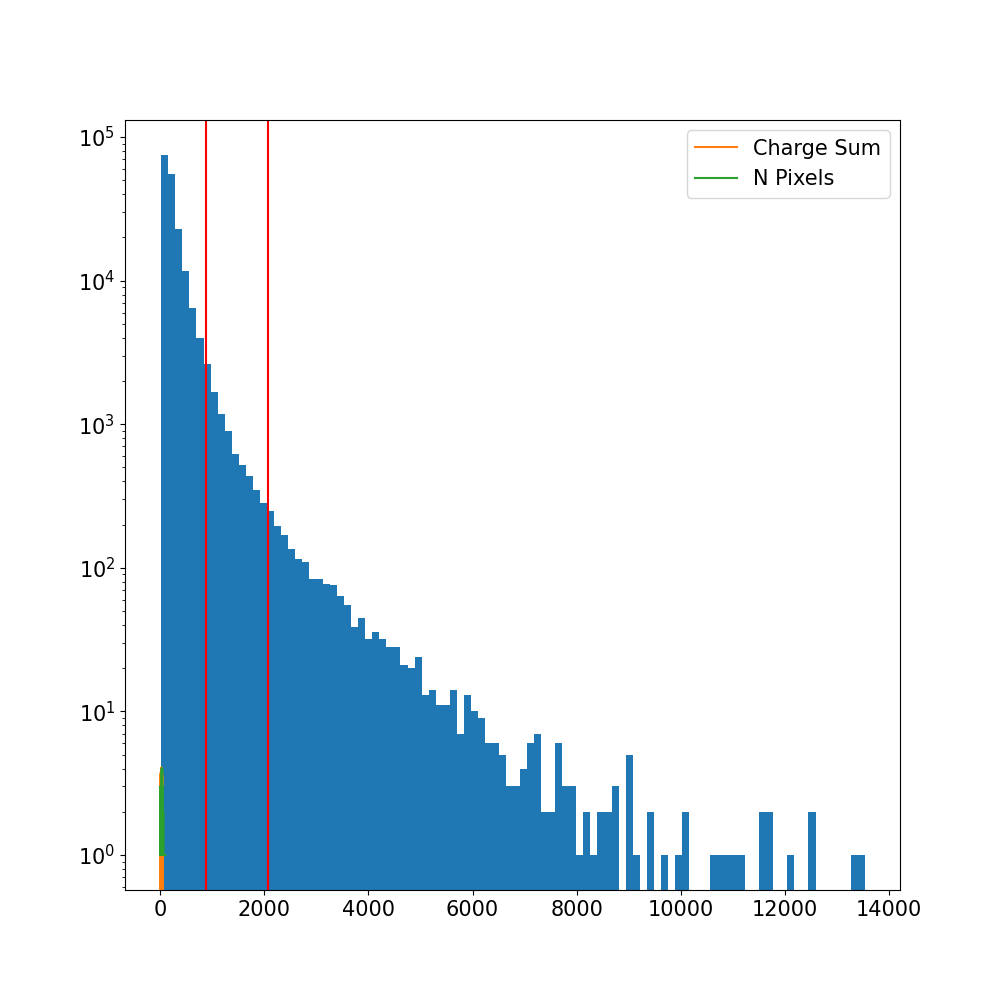

In [20]:
N = np.random.randint(0,len(Main))

plt.plot(Main[N,:,0],label = 'Charge Sum')
plt.plot(Main[N,:,1],label = 'N Pixels  ')

print(IDsList1[N])
print(Main[N,:,0])


plt.legend()
plt.show()

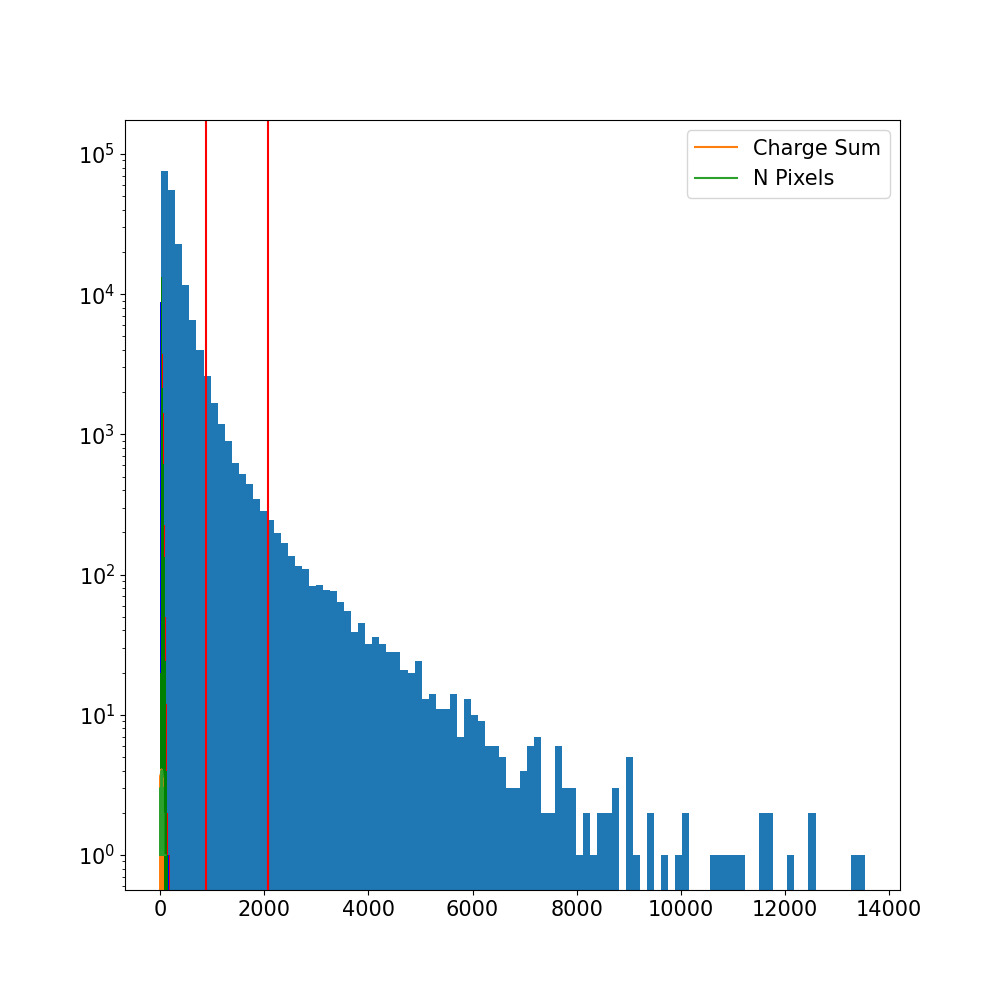

In [21]:

MinChi_i = torch.zeros(len(Run010))
MaxChi_i = torch.zeros(len(Run010))

for i,Event in enumerate(Run010):
    Chi_i = Event.get_pixel_values('Chi_i')
    MinChi_i[i] = Chi_i.min()
    MaxChi_i[i] = Chi_i.max()

Chi_spread = MaxChi_i - MinChi_i


plt.hist(MaxChi_i.numpy()/np.pi*180  ,bins=100,color = 'r')
plt.hist(MinChi_i.numpy()/np.pi*180  ,bins=100,color = 'b')
plt.hist(Chi_spread.numpy()/np.pi*180,bins=100,color = 'g')
plt.yscale('log')
plt.show()

In [22]:
Truth,_ = Truth_Energy_Xmax(Run010,None)

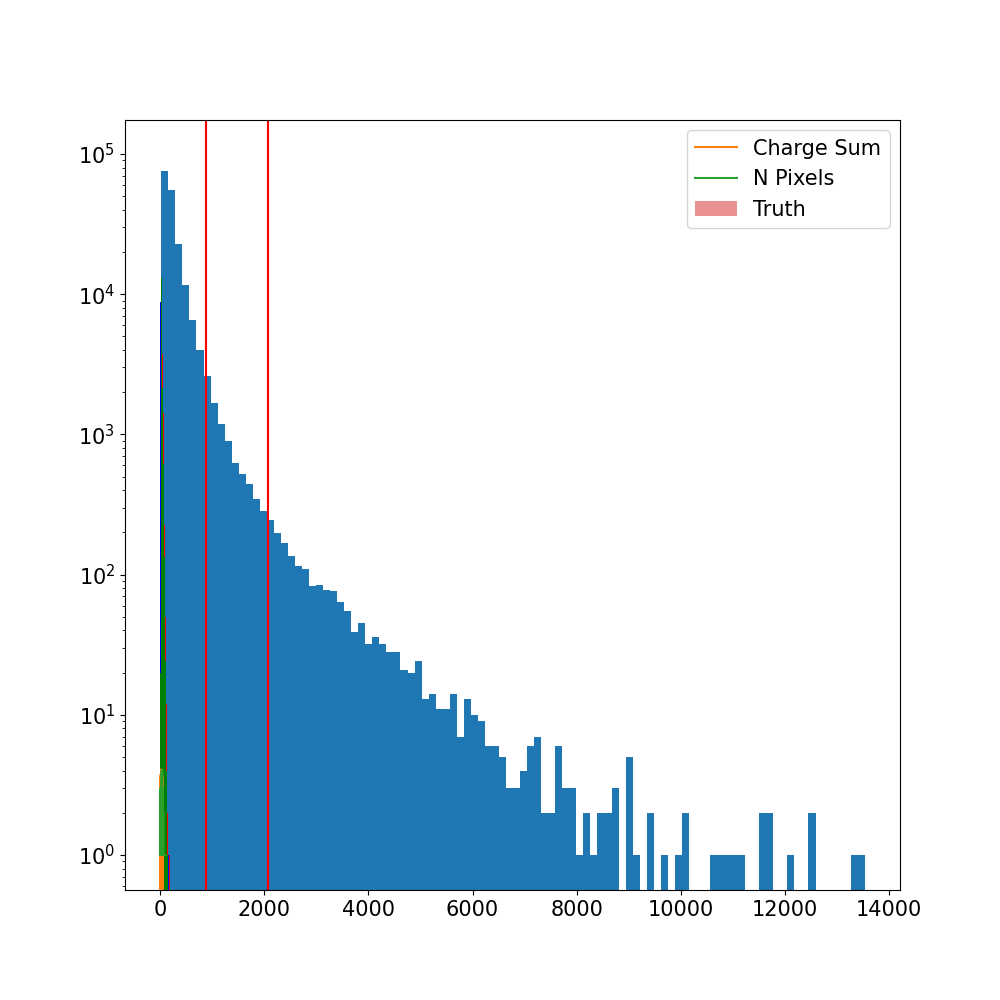

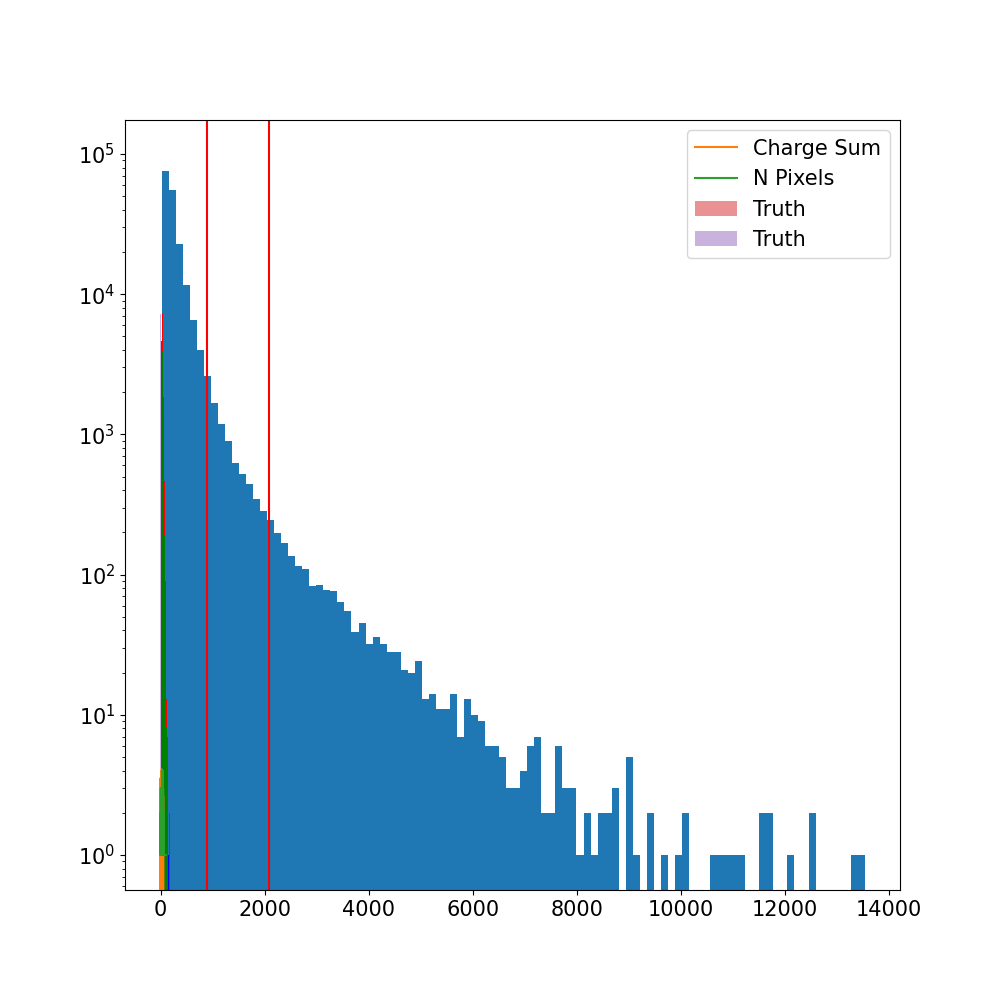

In [23]:
Nvars = Truth.shape[1]

# Plot all of them in histograms
for i in range(Nvars):
    plt.hist(Truth[:,i].numpy(),bins=100,label='Truth',alpha=0.5)
    plt.legend()
    plt.show()

# The Following was for Trace Conv3d Generation

In [24]:
# Event = Dataset.get_event_by_index(15)
# Status = Event.get_pixel_values('Status')
# Chi = Event.get_pixel_values('Chi_i').numpy() [Status >2]
# PulseCentroid = Event.get_pixel_values('PulseCentroid').numpy()[Status >2]
# St_chi = Event.get_value('Station_Chi_i')
# St_time = Event.get_value('Station_Time')

# # print(Event.get_value('Gen_Chi0')*180/torch.pi,Event.get_value('Gen_Rp')/1000,Event.get_value('Gen_T0'))
# # print()
# # print(Event.get_value('Station_Chi_i')*180/torch.pi,Event.get_value('Station_Time'))
# # for i in range(len(Chi)):
# #     if Status[i]>2:print(Chi[i].item()*180/torch.pi,',',PulseCentroid[i].item())

# X = Chi*180/torch.pi
# Y = PulseCentroid

# plt.figure()
# plt.scatter(X,Y,c='r')
# plt.scatter(St_chi*180/torch.pi,St_time,c='r',marker = 's')

# plt.scatter(X,Y/X,c = 'b')
# # plt.scatter(St_chi*180/torch.pi,St_time/St_chi,c='b',marker = 's')

# plt.grid()

In [25]:
# Main1 = torch.zeros((len(Dataset),2,20,22)) # Abs  Times



# IDsList = []
# for i,Event in enumerate(Dataset):
#     print(f'    Processing Main {i} / {len(Dataset)}',end='\r')
#     ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
#     IDsList.append(ID)

#     TelIDs = Event.get_pixel_values('TelID')
#     EyeIDs = Event.get_pixel_values('EyeID')

#     # Check if only HEAT (Check if any EyeID is not equal to 5)
#     if torch.sum(EyeIDs != 5) == 0:
#         continue
    

#     Mask = (TelIDs != 7)*(TelIDs != 8)*(TelIDs != 9)
#     if torch.sum(Mask) == 0: # Should be impossible cause of the above but who knows?
#         continue
#     SelectedTelescopeID = TelIDs[Mask].int().bincount().argmax()

#     Mask = (TelIDs == SelectedTelescopeID)

#     PixelIDs      = Event.get_pixel_values('PixelID')      [Mask]
#     Charge        = Event.get_pixel_values('Charge')       [Mask]
#     PulseCentroid = Event.get_pixel_values('PulseCentroid')[Mask]
#     StationTime   = Event.get_values('Station_Time').item()
#     # Normalise
#     Xs,Ys  = IndexToXY(PixelIDs)
#     Main1[i,0,Xs,Ys] = Charge
#     Main1[i,1,Xs,Ys] = PulseCentroid - StationTime
    




# # Normalise Main1
# Main1[:,0,:,:] = torch.log10(Main1[:,0,:,:])/3.75
# # Main1[:,1,:,:] = 

In [26]:
# Main1 = torch.zeros((len(Run010),2,20,22)) # Abs  Times

# IDsList = ()
# for i,Event in enumerate(Run010):
#     print(f'    Processing Main {i} / {len(Run010)}',end='\r')
#     ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
#     IDsList += (ID,)

#     TelIDs = Event.get_pixel_values('TelID')
#     EyeIDs = Event.get_pixel_values('EyeID')
#     # Status = Event.get_pixel_values('Status')
#     # Check if only HEAT (Check if any EyeID is not equal to 5)
#     if torch.sum(EyeIDs != 5) == 0:
#         continue
#     Mask = (TelIDs != 7)*(TelIDs != 8)*(TelIDs != 9)
#     if torch.sum(Mask) == 0: # Should be impossible cause of the above but who knows?
#         continue
#     SelectedTelescopeID = TelIDs[Mask].int().bincount().argmax()

#     Mask = (TelIDs == SelectedTelescopeID)

#     PixelIDs      = Event.get_pixel_values('PixelID')      [Mask]
#     Charge        = Event.get_pixel_values('Charge')       [Mask]
#     PulseCentroid = Event.get_pixel_values('PulseCentroid')[Mask]
#     StationTime   = Event.get_value('Station_Time').item()
#     # Normalise
#     Xs,Ys  = IndexToXY(PixelIDs)
#     Main1[i,0,Xs,Ys] = Charge
#     Main1[i,1,Xs,Ys] = PulseCentroid - StationTime

# # Normalise Main1
# Main1[:,0,:,:] = torch.log10(Main1[:,0,:,:]+1)/3.75
# Main1[:,1,:,:] = Main1[:,1,:,:]/1000


In [27]:
# IDsList = ()
# Gen_Chi0 = torch.zeros(len(Run010))
# Gen_Rp   = torch.zeros(len(Run010))
# Gen_T0   = torch.zeros(len(Run010))

# Rec_Chi0 = torch.zeros(len(Run010))
# Rec_Rp   = torch.zeros(len(Run010))
# Rec_T0   = torch.zeros(len(Run010))

# for i,Event in enumerate(Run010):
#     # ID Checks
#     ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
#     IDsList += (ID,)
#     if i%100 == 0:print(f'    Processing Truth {i} / {len(Run010)}',end='\r')
#     Gen_Chi0[i] = Event.get_value('Gen_Chi0').item()
#     Gen_Rp  [i] = Event.get_value('Gen_Rp').item()
#     Gen_T0  [i] = Event.get_value('Gen_T0').item()
    
#     Rec_Chi0[i] = Event.get_value('Rec_Chi0').item()
#     Rec_Rp  [i] = Event.get_value('Rec_Rp').item()
#     Rec_T0  [i] = Event.get_value('Rec_T0').item()

# # Normalisation
# Gen_Chi0 = torch.cos(Gen_Chi0)
# Rec_Chi0 = torch.cos(Rec_Chi0)

# Gen_Rp  /= 30000
# Rec_Rp  /= 30000

# Gen_T0  /=22000
# Rec_T0  /=22000



In [28]:
# X1 = Gen_T0.numpy()
# X2 = Rec_T0.numpy()

# Normalisation = lambda X: np.log(np.abs(X)+1)*np.sign(X)
# Normalisation = lambda X:X#/22000
# print(np.std(Normalisation(X1)))
# plt.figure()
# # binrange =np.linspace( 0,np.pi,100)
# binrange = 100
# vals,bins,_ = plt.hist(Normalisation(X1),bins=binrange)
# plt.hist(Normalisation(X2),bins=bins,alpha = 0.5)
# plt.grid()
# plt.yscale('log')

In [29]:
# Event = Dataset.get_event_by_index(0)

# Status = Event.get_pixel_values('Status')
# PulseCentroids = Event.get_pixel_values('PulseCentroid')[Status>2]
# Chi_i          = Event.get_pixel_values('Chi_i')        [Status>2]
# Rp             = Event.get_value('Gen_Rp')
# Chi0           = Event.get_value('Gen_Chi0')
# C = 3*10**8
# print(Rp.item(),Chi0.item())
# print(PulseCentroids*10**-9*C)


# plt.figure(figsize = [10,10])
# plt.scatter(Chi_i*180/np.pi,PulseCentroids*10**-9*C)
# plt.scatter(Chi_i*180/np.pi,PulseCentroids)

In [30]:
# # Event = Run010.get_blank_event()
# # print(Event._trace_data)

# Event  = Run010.get_event_by_index(0)
# PStart = Run010.get_pixel_values('PulseStart')
# PStop  = Run010.get_pixel_values('PulseStop')
# TelID  = Run010.get_pixel_values('TelID')
# EyeID  = Run010.get_pixel_values('EyeID')

# Mask = (TelID != 7)*(TelID != 8)*(TelID != 9)*(EyeID != 5)

# PStart = PStart[Mask].numpy()
# PStop  = PStop [Mask].numpy()

# bins = np.linspace(0,1000,100)
# plt.figure()
# plt.hist(PStart ,bins = bins)
# plt.hist(PStop  ,bins = bins,alpha = 0.5)
# plt.grid()
# # plt.yscale('log')

In [31]:
# # Main = torch.zeros((len(Run010),1000,20,22))
# Main = torch.zeros((len(Dataset),1000,20,22))

# Traces = Dataset.get_trace_values()
# PStart = Dataset.get_pixel_values('PulseStart')
# PStop  = Dataset.get_pixel_values('PulseStop')
# Pindex = Dataset.get_pixel_values('PixelID')
# EventPixelPosition = Dataset._event_pixel_position.to(torch.int)

# EventIndices = torch.repeat_interleave(torch.arange(len(EventPixelPosition)), EventPixelPosition[:,1]-EventPixelPosition[:,0]).int()
# Pstart = PStart.int()
# Pstop  = PStop.int()
# Xs, Ys = IndexToXY(Pindex)
# Xs = torch.tensor(Xs)
# Ys = torch.tensor(Ys)

# # Create a tensor of indices for the time dimension
# TimeIndices = torch.arange(1000).unsqueeze(0).repeat(len(EventIndices), 1)

# # # Create a mask where the time indices are between PStart and PStop
# # Mask = (TimeIndices >= PStart.unsqueeze(1)) & (TimeIndices < PStop.unsqueeze(1))

# # # Use advanced indexing to assign the values
# # Main[EventIndices.unsqueeze(1), Mask, Xs.unsqueeze(1), Ys.unsqueeze(1)] = Traces.unsqueeze(1)

# print(TimeIndices)



In [32]:
# # Main = torch.zeros((len(Run010),1000,20,22))
# Main = torch.zeros((len(Dataset),1000,20,22))

# Traces = Dataset.get_trace_values()
# PStart = Dataset.get_pixel_values('PulseStart')
# PStop  = Dataset.get_pixel_values('PulseStop')
# Pindex = Dataset.get_pixel_values('PixelID')
# EventPixelPosition = Dataset._event_pixel_position.to(torch.int)



# # Flatten EventIndices, Xs, and Ys to 1D tensors
# EventIndices_flat = EventIndices.flatten()
# Xs_flat = Xs.flatten()
# Ys_flat = Ys.flatten()

# # Create a 1D tensor of time indices for each trace
# TimeIndices = torch.arange(Pstart,Pstop)
# print(TimeIndices)
# # Create a mask where the time indices are between PStart and PStop for each trace
# Mask = (TimeIndices >= PStart) & (TimeIndices < PStop)

# print(Mask)

# # # Flatten the mask to a 1D tensor
# # Mask_flat = Mask.flatten()

# # # Use advanced indexing to assign the values
# # Main[EventIndices_flat, TimeIndices[Mask_flat], Xs_flat, Ys_flat] = Traces.flatten()

In [33]:
# # Main = torch.zeros((len(Run010),1000,20,22))
# Main = torch.zeros((len(Dataset),100,20,22))
# Main2 = torch.zeros((len(Dataset),20,22))

# Traces = Dataset.get_trace_values()
# PStart = Dataset.get_pixel_values('PulseStart')
# PStop  = Dataset.get_pixel_values('PulseStop')
# Pindex = Dataset.get_pixel_values('PixelID')
# EventPixelPosition = Dataset._event_pixel_position.to(torch.int)

# Mask = (Dataset.get_pixel_values('TelID') != 7) * (Dataset.get_pixel_values('TelID') != 8) * (Dataset.get_pixel_values('TelID') != 9) * (Dataset.get_pixel_values('EyeID') != 5)

# Traces = Traces[Mask]
# PStart = PStart[Mask]
# PStop  = PStop[Mask]
# Pindex = Pindex[Mask]

# # First make the index for the event dimenstion 
#     # Repeat the event index for the number of pixels in the event
# N_pixels_in_event = EventPixelPosition[:,1] - EventPixelPosition[:,0]
# EventIndices = torch.repeat_interleave(torch.arange(len(EventPixelPosition)), N_pixels_in_event).int()[Mask]


# # Now make the index for the XY dimensions
# Xs, Ys = IndexToXY(Pindex,return_tensor=True)

# Main[EventIndices, : , Xs, Ys] = Traces
# Main2[EventIndices,    Xs, Ys] = PStart
# Main2 = Main2.unsqueeze(1)

# indices = (torch.arange(100).reshape(1,-1,1,1)+Main2).to(torch.long)
# Main1 = torch.zeros((len(Dataset),1100,20,22))
# Main1.scatter_(1,indices,Main)
# Main1 = Main1[:,:1000,:,:]

# print(Main1[1,...].shape)

In [34]:
# # GraphData = [[]]
# Main = torch.zeros((len(Dataset._trace_data.shape[0]),100))
# for i,Event in enumerate(Dataset):
#     Traces = Dataset.get_trace_values()
#     Pstart = Dataset.get_pixel_values('PulseStart')
#     Pstop  = Dataset.get_pixel_values('PulseStop')
#     EyeID  = Dataset.get_pixel_values('EyeID')
#     TelID  = Dataset.get_pixel_values('TelID')
#     PixID  = Dataset.get_pixel_values('PixelID')


In [35]:
# Index = 1

# ToPlot = Main1[Index,:1000,:,:].permute(0,2,1).numpy()

# fig, axes = plt.subplots(22,20, figsize = (44,40))
# for i in range(22):
#     for j in range(20):
#         ax = axes[i,j]
#         ax.axis('off')
#         if ToPlot[:,i,j].sum()>0:
#             ax.plot(range(1000),ToPlot[:,i,j])
#             ax.set_title(f'{Main2[Index,0,j,i].item()}')
# plt.tight_layout()

In [36]:
# # Main = torch.zeros((len(Run010),1000,20,22))
# Main = torch.zeros((len(Run010),100,20,22))
# Main2 = torch.zeros((len(Run010),20,22))

# Traces = Run010.get_trace_values()
# PStart = Run010.get_pixel_values('PulseStart')
# PStop  = Run010.get_pixel_values('PulseStop')
# Pindex = Run010.get_pixel_values('PixelID')
# EventPixelPosition = Run010._event_pixel_position.to(torch.int)

# Mask = (Run010.get_pixel_values('TelID') != 7) * (Run010.get_pixel_values('TelID') != 8) * (Run010.get_pixel_values('TelID') != 9) * (Run010.get_pixel_values('EyeID') != 5)

# Traces = Traces[Mask]
# PStart = PStart[Mask]
# PStop  = PStop[Mask]
# Pindex = Pindex[Mask]

# # First make the index for the event dimenstion 
#     # Repeat the event index for the number of pixels in the event
# N_pixels_in_event = EventPixelPosition[:,1] - EventPixelPosition[:,0]
# EventIndices = torch.repeat_interleave(torch.arange(len(EventPixelPosition)), N_pixels_in_event).int()[Mask]


# # Now make the index for the XY dimensions
# Xs, Ys = IndexToXY(Pindex,return_tensor=True)

# Main[EventIndices, : , Xs, Ys] = Traces
# Main2[EventIndices,    Xs, Ys] = PStart
# Main2 = Main2.unsqueeze(1)

# indices = (torch.arange(100).reshape(1,-1,1,1)+Main2).to(torch.long)
# Main1 = torch.zeros((len(Run010),1100,20,22))
# Main1.scatter_(1,indices,Main)
# Main1 = Main1[:,:1000,:,:]

# print(Main1[1,...].shape)

In [37]:
# def Graph_Conv3d_Traces(Dataset,ProcessingDataset):
#     '''Will just provide 1 mirror array of pixel traces'''
#     IDsList = ()
#     GraphData = [] # Will have Event in dim1, [Trace,X,Y,PulseStart] in dim2, values of dim2 in dim3
#     for i,Event in enumerate(Dataset):
#         print(f'    Processing Main {i} / {len(Dataset)}',end='\r')
#         ID = (Event.get_value('EventID_1/2').int()*100000 + Event.get_value('EventID_2/2').int()).item()
#         IDsList += (ID,)

#         Traces = Event.get_trace_values()
#         Pstart = Event.get_pixel_values('PulseStart')
#         # Pstop  = Event.get_pixel_values('PulseStop')

#         EyeID = Event.get_pixel_values('EyeID'  )
#         TelID = Event.get_pixel_values('TelID'  )
#         PixID = Event.get_pixel_values('PixelID')
#         Mask =(EyeID != 5) * (TelID==torch.mode(TelID[TelID<7]).values.item())

#         Traces = Traces[Mask]
#         Pstart = Pstart[Mask]
#         PixID  = PixID[Mask]

#         Xs,Ys = IndexToXY(PixID,return_tensor=True)

#         # Traces normalised Here
#         Traces = torch.log1p((Traces).clip(min=0))
        
#         # Append to the GraphData
#         GraphData.append([Traces,Xs,Ys,Pstart])
#     return GraphData
#     # ProcessingDataset.GraphData = GraphData
#     # if ProcessingDataset._EventIDs is None:
#     #     ProcessingDataset._EventIDs = IDsList
#     # else:
#     #     assert ProcessingDataset._EventIDs == IDsList, 'EventIDs do not match'    

In [38]:
# GraphData = Graph_Conv3d_Traces(Dataset,None)

# print(GraphData[:][0])

In [39]:
# def Unpack_Graph_Conv3d_Traces(GraphData):
#     '''Unpacks the graph data into a tensor'''
#     Nevents = len(GraphData)
#     TraceMain = torch.zeros((Nevents,100,20,22))
#     StartMain = torch.zeros((Nevents,1,20,22))
#     Main      = torch.zeros((Nevents,1100,20,22))
    
#     N_pixels_in_event = torch.tensor(list(map(len,map(lambda x : x[0],GraphData))))
#     EventIndices = torch.repeat_interleave(torch.arange(Nevents), N_pixels_in_event).int()

#     Traces = torch.cat(list(map(lambda x : x[0],GraphData)))
#     Xs     = torch.cat(list(map(lambda x : x[1],GraphData)))
#     Ys     = torch.cat(list(map(lambda x : x[2],GraphData)))
#     Pstart = torch.cat(list(map(lambda x : x[3],GraphData)))

#     TraceMain[EventIndices, : , Xs, Ys] = Traces
#     StartMain[EventIndices, 0 , Xs, Ys] = Pstart
#     indices = (torch.arange(100).reshape(1,-1,1,1)+StartMain).to(torch.long)
#     Main.scatter_(1,indices,TraceMain)
#     Main = Main[:,:1000,:,:]
#     return Main
# Main = Unpack_Graph_Conv3d_Traces(GraphData)
    

In [40]:
# T = torch.tensor([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   6., 6., 6])

# print(T.shape)
# print(torch.mode(T)) # gives index 27
# print()
# T = torch.tensor([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
#                   6., 6., 6., 6., ])
# print(T.shape)
# print(torch.mode(T)) # gives index 14



In [41]:
# plt.figure(figsize = [20,10])

# # for i in range(n):
# N     = np.random.randint(0,len(Run010))
# print(f'Event {N}')
# Event = Run010.get_event_by_index(N)

# Traces = Event.get_trace_values()
# PStart = Event.get_pixel_values('PulseStart').int()
# PStop  = Event.get_pixel_values('PulseStop').int()
# TelID  = Event.get_pixel_values('TelID')
# EyeID  = Event.get_pixel_values('EyeID')
# Status = Event.get_pixel_values('Status')

# Mask   = (TelID != 7)*(TelID != 8)*(TelID != 9)*(EyeID != 5) * (Status > 2)
# Traces = Traces[Mask]
# PStart = PStart[Mask]
# PStop  = PStop[Mask]

# for i in range(len(Traces)):
#     Xstart = PStart[i].item()
#     Xstop  = PStop[i].item()
#     plt.plot(range(Xstart,Xstop),Traces[i][:Xstop-Xstart])



# The Following was for the CONV SDP

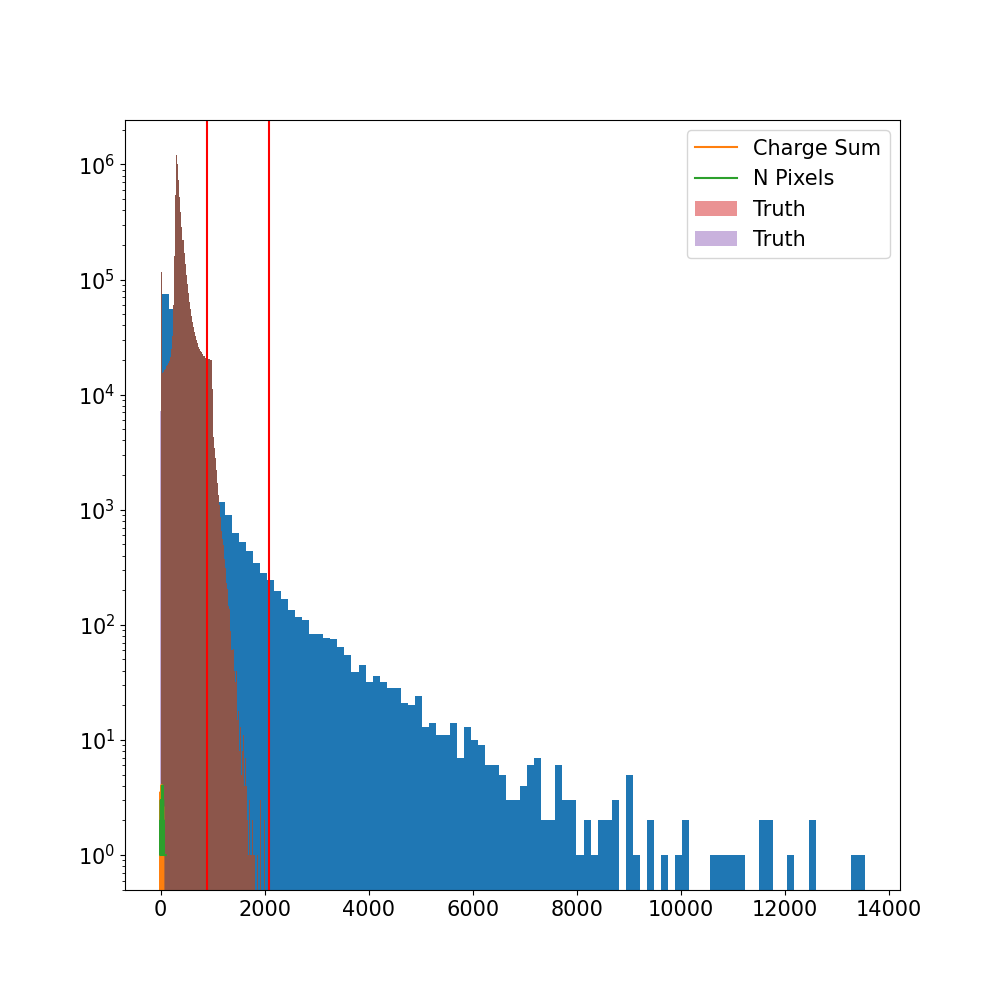

379.9541
151.3037


In [42]:
PC = Run010.get_pixel_values('PulseCentroid')
plt.hist(PC.numpy(),bins =100)
plt.show()

print(np.mean(PC.numpy()))
print(np.std(PC.numpy()))

In [43]:
SelectedMirrors = torch.zeros(len(Run010))
SDPPhi = torch.zeros(len(Run010))
SDPTheta = torch.zeros(len(Run010))
for i,Event in enumerate(Run010):
    TelIDs        = Event.get_pixel_values('TelID')
    EyeIDs        = Event.get_pixel_values('EyeID')
    if torch.sum(EyeIDs!=5) == 0: continue
    Mask = (TelIDs != 7)*(TelIDs != 8)*(TelIDs != 9)
    if torch.sum(Mask)==0:continue
    SelectedTelescopeID = TelIDs[Mask].int().bincount().argmax()
    SelectedMirrors[i]  = SelectedTelescopeID
    SDPPhi[i]          = Event.get_value('Gen_SDPPhi')
    SDPTheta[i]        = Event.get_value('Gen_SDPTheta')


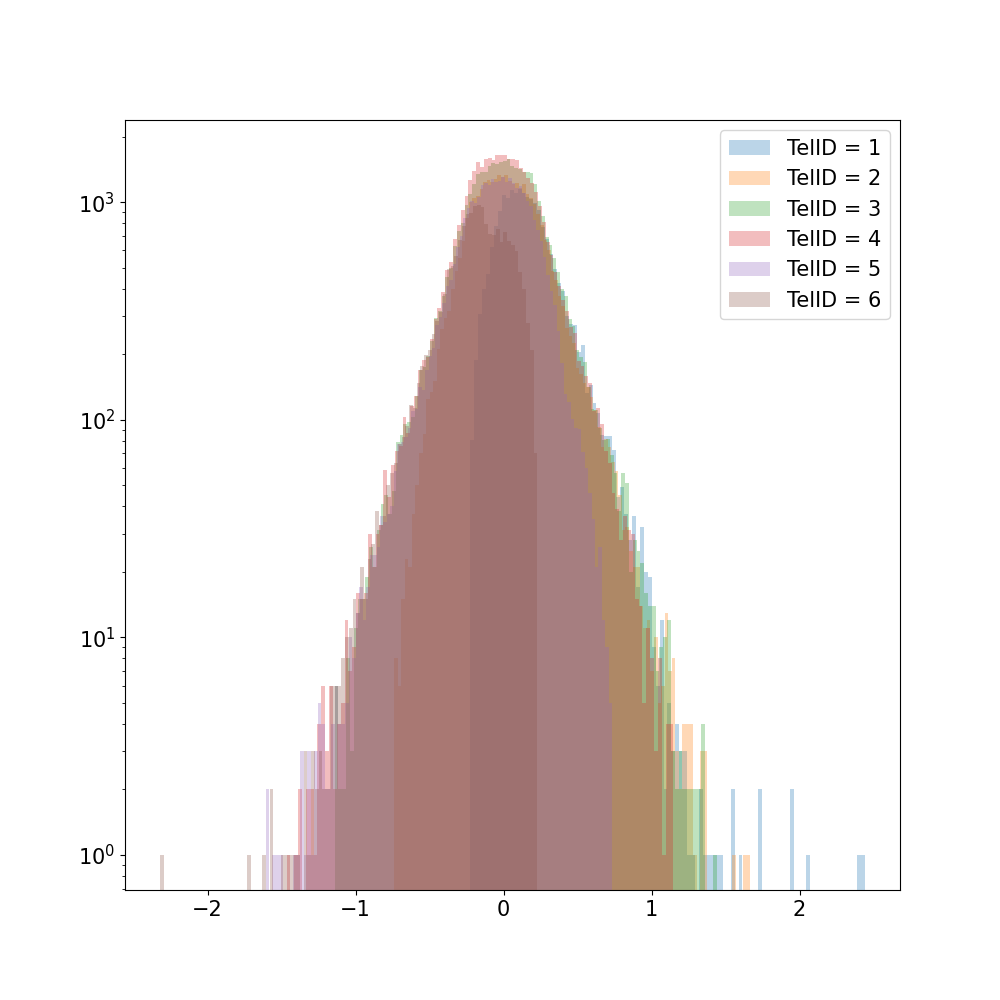

In [44]:
fig = plt.figure(figsize = [10,10])
X = SDPPhi.numpy()
X = X+2*torch.pi*(X<0)
X = X-torch.pi
Offsets = {1:-75/180*np.pi,2:-45/180*np.pi,3:-15/180*np.pi,4:15/180*np.pi,5:45/180*np.pi,6:75/180*np.pi}
# Offsets = {1:0,2:0,3:0,4:0,5:0,6:0}
for i in range(1,7):
    cut = SelectedMirrors == i
    plt.hist((X[cut]-Offsets[i]),bins = 100,label = f'TelID = {i}',alpha = 0.3)
plt.legend()
plt.yscale('log')
# plt.xlim(-1,1)

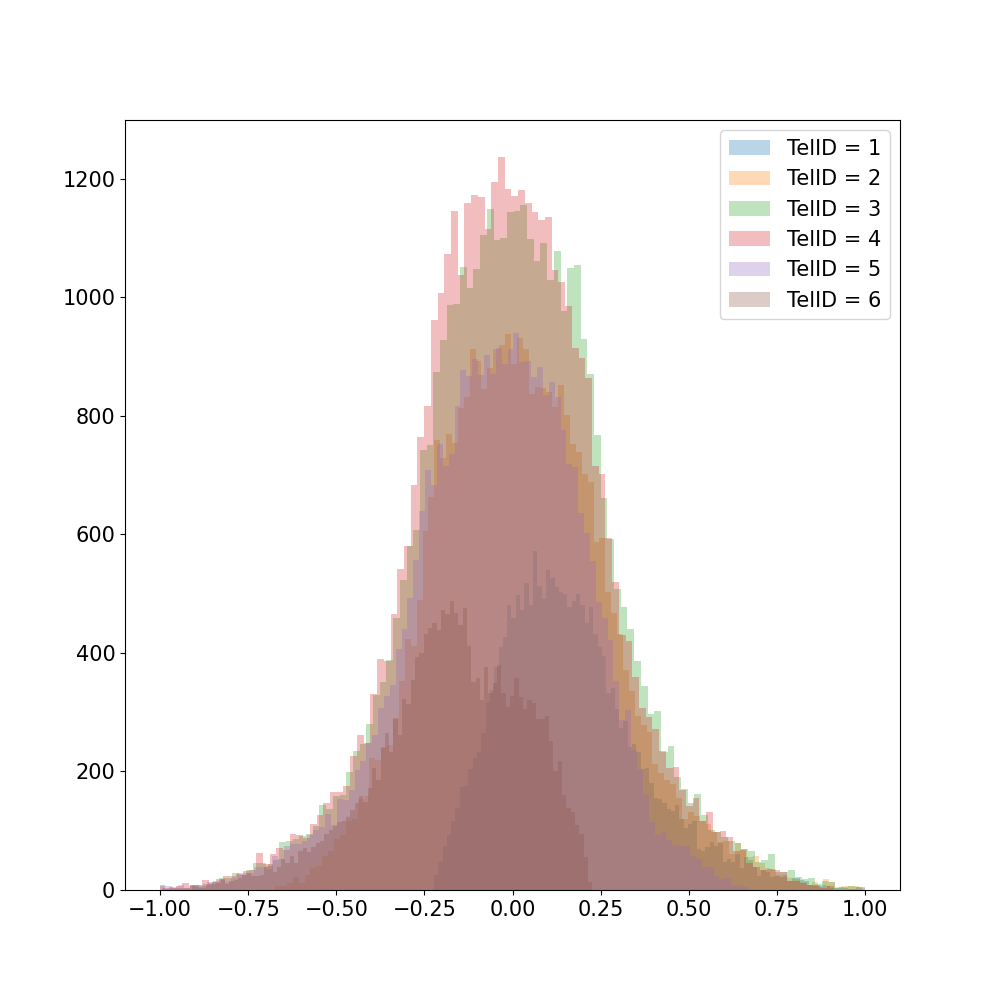

In [45]:
fig = plt.figure(figsize = [10,10])
X = SDPPhi.numpy()
X = X+2*torch.pi*(X<0)
X = X-torch.pi
Offsets = {1:-75/180*np.pi,2:-45/180*np.pi,3:-15/180*np.pi,4:15/180*np.pi,5:45/180*np.pi,6:75/180*np.pi}

for i in range(1,7):
    cut = SelectedMirrors == i
    plt.hist(np.sin(X[cut]-Offsets[i]),bins = 100,label = f'TelID = {i}',alpha = 0.3)
plt.legend()
# plt.yscale('log')

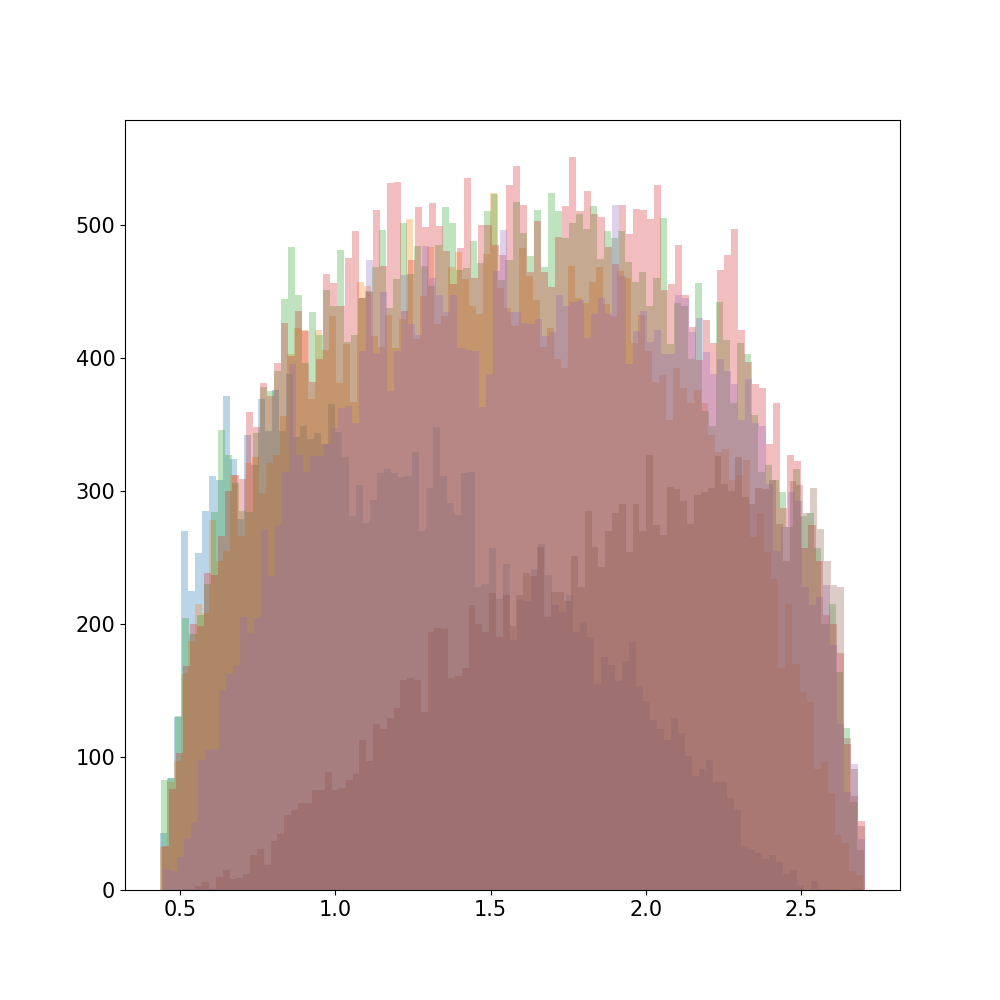

In [46]:
plt.figure(figsize=[10,10])
X = SDPTheta.numpy()

for i in range(1,7):
    cut = SelectedMirrors == i
    plt.hist((X[cut]),bins = 100,label = f'TelID = {i}',alpha = 0.3)

In [47]:
ProcessingDataset = ProcessingDatasetContainer('/remote/tychodata/ftairli/work/Projects/ProfileReconstruction/Data')
ProcessingDataset.RandomIter = False
ProcessingDataset.State = 'Static'

FileNotFoundError: [Errno 2] No such file or directory: '/remote/tychodata/ftairli/work/Projects/ProfileReconstruction/Data/CurrentProcessingDataset.pt'

### The Following is for the old Processing Graph Dataset, May be Useful So leaving It Commended Out

In [ ]:
# # Try to Produce The ProcessingDataset
# def GetTruths(GraphDataset):
#     ALLSDPPhi = GraphDataset._otherData[:,18]
#     ALLSDPTheta = GraphDataset._otherData[:,19]
    
#     # Truths = torch.cat((torch.cos(ALLSDPPhi).unsqueeze(1),torch.sin(ALLSDPPhi).unsqueeze(1),torch.cos(ALLSDPTheta).unsqueeze(1),torch.sin(ALLSDPTheta).unsqueeze(1)),dim=1)
#     Truths = torch.cat((ALLSDPPhi.unsqueeze(1),ALLSDPTheta.unsqueeze(1)),dim=1)
#     return Truths
# def GetFeatures(GraphDataset):
#     # Get Phi,Theta,Charge
#     Features = GraphDataset._pixelData[:,[7,9,10,4]]
#     # Normalise Features

#     Features[:,1] = Features[:,1]
#     Features[:,2] = Features[:,2]
    
#     Features[:,3] = torch.log10(Features[:,3]+1)/7.25
#     return Features




# ProcessingDataset = GraphDataset.GetProcessingDataset(GetTruths,GetFeatures,True,True)
# ProcessingDataset.AssignIndices()

In [ ]:
# ProcessingDataset._Features.shape

In [ ]:
# ProcessingDataset.State = 'Train'
# print(f'Training Lenght : {len(ProcessingDataset)}')
# ProcessingDataset.State = 'Val'
# print(f'Validation Lenght : {len(ProcessingDataset)}')
# ProcessingDataset.State = 'Test'
# print(f'Testing Lenght : {len(ProcessingDataset)}')


In [ ]:
# plt.hist(ProcessingDataset._Features[:,0].numpy(),bins=100)
# plt.show()

In [ ]:
# ProcessingDataset.State = 'Static'
# N = torch.randint(0,len(ProcessingDataset),(1,1)).item()
# N = 0
# print(f'Random Event N: {N}')
# All = False
# if All: Kloop = range(20)
# else: Kloop = range(N,N+1)
# for N in Kloop:
#     EvIndex, BatchFeatures,BatchEdges,BatchEdgeWeights,BatchTruthVals = ProcessingDataset[N]

#     BatchFeatures = BatchFeatures[BatchFeatures[:,0].argsort()]
#     BatchFeatures = BatchFeatures[:,1:]

#     print(f'BatchFeatures Shape : {BatchFeatures.shape}')
#     plt.figure(figsize=[10,10])
#     plt.scatter(BatchFeatures[:,0],-BatchFeatures[:,1]+90)

#     intercept = BatchTruthVals[0]/torch.pi*180-90
#     slope = -torch.tan(BatchTruthVals[1])

#     x = torch.linspace(torch.amin(BatchFeatures[:,0]).item(),torch.amax(BatchFeatures[:,0]).item(),100)
#     y = slope * (x - intercept)
#     # plt.plot(x, y, '-r', label='y = {}(x - {})'.format(slope, intercept))
#     plt.gca().invert_xaxis()
#     print(f'SDPTheta : {BatchTruthVals[1]/torch.pi*180}')
#     if intercept>0:
#         print(f'SDPPhi : {intercept}')
#     else: 
#         print(f'SDPPhi : {intercept+360}')
#     x_center = (plt.xlim()[0] + plt.xlim()[1]) / 2  # Calculate the center of the x-axis
#     threshold = 30
#     if abs(x_center - plt.xlim()[0]) < threshold and abs(x_center - plt.xlim()[1]) < threshold:
#         new_xlim = (x_center - threshold, x_center + threshold)
#         plt.xlim(new_xlim)
#     plt.grid()

In [ ]:
# Adjacency = torch.zeros(torch.amax(BatchEdges.T)+1,torch.amax(BatchEdges.T)+1)
# for i in range(len(BatchEdges.T)):
#     Adjacency[BatchEdges.T[i,0],BatchEdges.T[i,1]] = 1
#     Adjacency[BatchEdges.T[i,1],BatchEdges.T[i,0]] = 1

# def PlotGraph(Pixels,Adjacency):
#     plt.figure(figsize = [20,20])
#     # Invert x axis
#     for i in range(len(Adjacency)):
#         for j in range(len(Adjacency)):
#             if Adjacency[i,j] == 1:
#                 plt.plot([Pixels[i,0],Pixels[j,0]],[90-Pixels[i,1],90-Pixels[j,1]],c='black',alpha=0.2,zorder = 1)
#     plt.scatter(Pixels[:,0][torch.sum(Adjacency,dim=1)!=0],90-Pixels[:,1][torch.sum(Adjacency,dim=1)!=0],c=Pixels[:,2][torch.sum(Adjacency,dim=1)!=0],cmap='plasma',s = 100,zorder = 2)
#     plt.scatter(Pixels[:,0][torch.sum(Adjacency,dim=1)==0],90-Pixels[:,1][torch.sum(Adjacency,dim=1)==0],color='k',s = 50,marker='x',zorder = 2)
#     for i in range(len(Pixels)):
#         plt.annotate(str(i),(Pixels[i,0],90-Pixels[i,1]))
#     plt.grid()
#     plt.xlabel('Phi')
#     plt.ylabel('Elevation')
    
#     x_center = (plt.xlim()[0] + plt.xlim()[1]) / 2  # Calculate the center of the x-axis
#     threshold = 30
#     if abs(x_center - plt.xlim()[0]) < threshold and abs(x_center - plt.xlim()[1]) < threshold:
#         new_xlim = (x_center - threshold, x_center + threshold)
#         plt.xlim(new_xlim)
#     plt.gca().invert_xaxis()
#     plt.show()

# PlotGraph(BatchFeatures,Adjacency)

In [ ]:
# def PlotAdjacency(Adjacency):
#     plt.figure(figsize = [20,20])
#     plt.imshow(Adjacency)
#     for i in range(len(Adjacency)):
#         if torch.sum(Adjacency[i]) == 0:
#             plt.axvline(i,color='red')
#             plt.axhline(i,color='red')
#     plt.show()

# PlotAdjacency(Adjacency)

In [ ]:
# N = torch.randint(0,len(GraphDataset),(1,1)).item()

# N = 0
# Event,ActivePixels,Edges = GraphDataset.GetEventsByIndex(N)

# Pixels = Event.PixelObservables


In [ ]:
# Phi = Event.RecSDPPhi
# Theta = Event.RecSDPTheta

# PixelsPhi = Pixels.PixelPhi
# PixelsTheta = Pixels.PixelTheta

# plt.scatter(PixelsPhi,-PixelsTheta+90,c = Pixels.Charge,s = 500)
# intercept = Phi/torch.pi*180
# Rise = -torch.cos(Theta)
# Run  = torch.sin(Theta)
# slope = Rise/Run

# x = torch.linspace(torch.amin(BatchFeatures[:,0]).item(),torch.amax(BatchFeatures[:,0]).item(),100)
# y = slope * (x - intercept)
# # plt.plot(x, y, '-r', label='y = {}(x - {})'.format(slope, intercept))

# print(f'SDPTheta : {BatchTruthVals[1]/torch.pi*180}')
# print(f'SDPPhi : {intercept}')

In [ ]:
# for N in range(20):
#     Event = dataset.GetEventsByIndex(N)
#     print(f'Event GenSDPPhi : {Event.GenSDPPhi*180/torch.pi} Event RecSDPPhi : {Event.RecSDPPhi*180/torch.pi}')

In [ ]:
# # N = torch.randint(0,len(dataset),(1,1)).item()

# Event = dataset.GetEventsByIndex(N)

# Pixels = Event.PixelObservables
# Phi = Event.RecSDPPhi
# Theta = Event.RecSDPTheta

# PixelsPhi = Pixels.GetPixelData()[:,9]
# PixelsTheta = Pixels.GetPixelData()[:,10]
# plt.figure()
# plt.scatter(PixelsPhi,-PixelsTheta+90,c = Pixels.Charge,s = 500)
# intercept = (Phi-torch.pi/2)/torch.pi*180
# slope = -torch.tan(Theta)

# x = torch.linspace(torch.amin(PixelsPhi).item(),torch.amax(PixelsPhi).item(),100)
# y = slope * (x - intercept)
# # print(x,y)
# plt.plot(x, y, '-r')

# plt.grid()
# plt.title(f'SDPTheta :{(Theta*180/torch.pi)}  SDPPhi :{(Phi*180/torch.pi-90)}, ID: {Event.EventID}')
# plt.ylim([0,60])
# plt.xlim([torch.amin(PixelsPhi).item(),torch.amax(PixelsPhi).item()])
# plt.gca().invert_xaxis()
# # print(f'SDPTheta : {Phi/torch.pi*180}')
# # print(f'SDPPhi : {Theta/torch.pi*180}')
    

In [ ]:
# All_otherData = torch.load('/remote/tychodata/ftairli/work/Projects/GNN_SDP/Data/RawData/ALL_otherData.pt')

In [ ]:
# ALL_Phi = All_otherData[:,18].clone().numpy()
# ALL_Theta = All_otherData[:,19].numpy()
# X =  ALL_Phi
# X[X<0] = (X[X<0])+torch.pi*2
# X = X -torch.pi/2
# plt.hist(X,bins=100)
# plt.show()

In [ ]:
# import seaborn as sns
# X = np.sin(ALL_Phi)
# Y = np.cos(ALL_Theta)

# fig,ax =plt.subplots(1, 1, figsize=(15, 10))

# # Scatter plot for the first subplot
# # sns.scatterplot(x=X, y=Y, ax=ax, s=5,color='.15')
# sns.histplot(x=X, y=Y, ax=ax, bins=100, pthresh=0,cmap = 'mako',cbar=True)
# # ax[0].set_xlabel('Truth Phi (degrees)')
# # ax[0].set_ylabel('Prediction-Truth (degrees)')
# # ax[0].set_title('Phi')
# # ax[0].set_xlim(-40,40)
# # ax[0].set_ylim(-10,10)

# plt.show()
